<a href="https://colab.research.google.com/github/JJ-Zhang-DS/CNN_circle_identification/blob/main/circle_finder_cnn_updated_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Circle Finder CNN - Colab Compatible

In [2]:
## 1. Install Required Packages
!pip install shapely scikit-image

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os
os.getcwd()

'/content'

In [ ]:
# create a new folder data to store data
!mkdir /content/drive/MyDrive/data


In [4]:
# --------- JSON-Based Dataset Definition ---------
class CircleJsonDataset(Dataset):
    def __init__(self, data_folder):
        self.files = [os.path.join(data_folder, f) for f in os.listdir(data_folder) if f.endswith('.json')]

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        with open(self.files[idx], 'r') as f:
            data = json.load(f)
        img = np.array(data['img'], dtype=np.float32)
        label = data['label']
        img = np.expand_dims(img, axis=0)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

In [5]:
## 2. Imports
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import json
from sklearn.model_selection import train_test_split
from torchvision import transforms
import matplotlib.pyplot as plt

In [6]:
import numpy as np
from skimage.draw import circle_perimeter_aa
import json
import matplotlib.pyplot as plt
from glob import glob

In [7]:
def draw_circle(radius, x, y):
    """
    Function to generate an anti-aliased circle and draw it into
    a sect of pixels
    """
    rr, cc, value = circle_perimeter_aa(x, y, radius)
    is_valid = np.logical_and(np.logical_and(rr >= 0, rr < 256), np.logical_and(cc >= 0, cc < 256))
    img = np.zeros((256, 256))
    img[rr[is_valid], cc[is_valid]] = 2*value[is_valid]
    return img

def generate_circle(noise_level=2, rad_min=3, rad_max=20):
    """
    Function to generate an image with a circle obscured by some noise.
    Core function for generating the images you need to run your model against.
    DO NOT CHANGE.

    For training a model X = img, Y = labels (you will need more than one component in
    your prediction output (row, col, radius))
    """
    row = np.random.randint(0, 256)
    col = np.random.randint(0, 256)
    radius = np.random.randint(rad_min, rad_max)
    img = draw_circle(radius, row, col)
    img += noise_level * np.random.rand(256, 256)
    label = {'row': row, 'col': col, 'radius': radius, 'noise_level': noise_level}
    return img, label

def generate_circle_dataset(path, avg_noise=2, n=10):
    """
    Helper function to show how you can pre-save a bunch of circle images with
    their associated label information for the purposes of your data.
    """
    for idx in range(n):
        img, label = generate_circle(np.max([0, np.random.normal(avg_noise, avg_noise/2.0)]))
        with open(f'{path}/file{idx}.json', 'w') as f:
            json.dump({'img': img.tolist(), 'label': label}, f)

def load_dataset_and_plot(path, n_to_show=10):
    """
    Provided as a demo for how to load a dataset you've generated and get the img
    and configuration data from your dataset. This is not necessary to use for the
    takehome assignment and is simply here to give you some help getting started
    if needed.
    """
    idx=0
    for file in glob(f'{path}/*.json'):
        with open(file,'r') as f:
            example_data = json.load(f)
            print(file)
            print(example_data['label'])
            img = np.array(example_data['img'])
            plt.imshow(img)
            plt.show()
            idx+=1
        if idx >= n_to_show:
            break

In [8]:
generate_circle

<function __main__.generate_circle(noise_level=2, rad_min=3, rad_max=20)>

In [8]:
# produce dataset
data_path = 'drive/MyDrive/data'
generate_circle_dataset(data_path, n=2000)

KeyboardInterrupt: 

In [ ]:
# ## 3. Dataset Class
# class CircleDataset(Dataset):
#     def __init__(self, data_path):
#         self.files = [os.path.join(data_path, f) for f in os.listdir(data_path) if f.endswith('.json')]
#         self.transform = transforms.ToTensor()
#     def __len__(self):
#         return len(self.files)
#     def __getitem__(self, idx):
#         with open(self.files[idx], 'r') as f:
#             data = json.load(f)
#         img = np.array(data['img'], dtype=np.float32)
#         label = data['label']
#         img = np.expand_dims(img, axis=0)  # Add channel dimension
#         target = torch.tensor([label['row'], label['col'], label['radius']], dtype=torch.float32)
#         return torch.tensor(img, dtype=torch.float32), target

In [8]:
#from create_dataset import generate_circle

class CircleOnTheFlyDataset(Dataset):
    def __init__(self, n_samples=10000, noise_level=2):
        self.n_samples = n_samples
        self.noise_level = noise_level

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        img, label = generate_circle(noise_level=self.noise_level)
        img = np.expand_dims(img, axis=0)  # shape: (1, 256, 256)
        target = torch.tensor([label['row'], label['col'], label['radius']], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target


In [10]:
## 4. CNN Model
class CircleFinderCNN(nn.Module):
    def __init__(self):
        super(CircleFinderCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 16, kernel_size=5, stride=1, padding=2)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.fc1 = nn.Linear(32 * 64 * 64, 128)
        self.fc2 = nn.Linear(128, 3)  # Output: row, col, radius
    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 32 * 64 * 64)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

In [11]:
## 5. Training Function
def train_model(model, train_loader, val_loader, device, epochs=50, lr=1e-3, patience=5):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = nn.MSELoss()
    model.to(device)

    best_val_loss = float('inf')
    patience_counter = 0
    train_losses, val_losses = [], []

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for imgs, targets in train_loader:
            imgs, targets = imgs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        val_loss = 0
        model.eval()
        with torch.no_grad():
            for imgs, targets in val_loader:
                imgs, targets = imgs.to(device), targets.to(device)
                outputs = model(imgs)
                loss = criterion(outputs, targets)
                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)

        print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    # Plot loss
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('MSE Loss')
    plt.title('Loss Curve')
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
# ## 6. Load Data and Train
# data_dir = './data'  # Ensure this folder contains your 1000 .json files
# full_dataset = CircleDataset(data_dir)
# train_idx, val_idx = train_test_split(list(range(len(full_dataset))), test_size=0.2)
# train_dataset = torch.utils.data.Subset(full_dataset, train_idx)
# val_dataset = torch.utils.data.Subset(full_dataset, val_idx)
# train_loader = DataLoader(train_dataset, batch_size=10, shuffle=True)
# val_loader = DataLoader(val_dataset, batch_size=10)

In [ ]:
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# model = CircleFinderCNN()
# train_model(model, train_loader, val_loader, device, epochs=1000)

Epoch 1, Train Loss: 7230.1929, Val Loss: 4461.9832
Epoch 2, Train Loss: 5171.5364, Val Loss: 4009.2012
Epoch 3, Train Loss: 4594.6466, Val Loss: 4516.2544
Epoch 4, Train Loss: 4062.9711, Val Loss: 3894.7640
Epoch 5, Train Loss: 4612.8798, Val Loss: 4979.9456
Epoch 6, Train Loss: 4681.8024, Val Loss: 4648.3751
Epoch 7, Train Loss: 4060.6938, Val Loss: 4225.5962
Epoch 8, Train Loss: 3991.3298, Val Loss: 3767.5375
Epoch 9, Train Loss: 3475.2243, Val Loss: 4535.4523
Epoch 10, Train Loss: 3982.0420, Val Loss: 4556.6674


In [ ]:
if __name__ == '__main__':
    train_dataset = CircleOnTheFlyDataset(n_samples=8000)
    val_dataset = CircleOnTheFlyDataset(n_samples=2000)

    train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=100)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = CircleFinderCNN()
    train_model(model, train_loader, val_loader, device, epochs=100)

    # show_predictions(model, val_dataset, device, num_samples=5)


Epoch 1, Train Loss: 4210.4335, Val Loss: 3646.8497
Epoch 2, Train Loss: 3775.9196, Val Loss: 3854.7116
Epoch 3, Train Loss: 3686.2638, Val Loss: 3600.8425
Epoch 4, Train Loss: 3705.2346, Val Loss: 3735.9102
Epoch 5, Train Loss: 3671.2008, Val Loss: 3638.2238
Epoch 6, Train Loss: 3712.8508, Val Loss: 3577.7225
Epoch 7, Train Loss: 3673.0284, Val Loss: 3541.1903
Epoch 8, Train Loss: 3666.0897, Val Loss: 3574.7997
Epoch 9, Train Loss: 3675.1205, Val Loss: 3694.6108
Epoch 10, Train Loss: 3615.9297, Val Loss: 3533.6834
Epoch 11, Train Loss: 3583.3156, Val Loss: 3631.9476
Epoch 12, Train Loss: 3559.8089, Val Loss: 3315.5602
Epoch 13, Train Loss: 2929.7541, Val Loss: 2442.6956
Epoch 14, Train Loss: 1968.8116, Val Loss: 1722.8649
Epoch 15, Train Loss: 1221.1227, Val Loss: 980.7228
Epoch 16, Train Loss: 879.7519, Val Loss: 762.1342
Epoch 17, Train Loss: 763.5026, Val Loss: 662.2950
Epoch 18, Train Loss: 658.5439, Val Loss: 622.8769
Epoch 19, Train Loss: 588.4544, Val Loss: 524.8398
Epoch 20, T

In [ ]:
## 7. Evaluate with IoU

In [9]:
%pip install shapely

In [11]:
from shapely.geometry import Point

In [13]:
def intersection_over_union(circ1_dict, circ2_dict):
    shape1 = Point(circ1_dict['row'], circ1_dict['col']).buffer(circ1_dict['radius'])
    shape2 = Point(circ2_dict['row'], circ2_dict['col']).buffer(circ2_dict['radius'])
    return shape1.intersection(shape2).area / shape1.union(shape2).area
def evaluate_model(model, dataloader, device, iou_threshold=0.7):
    model.eval()
    matches = 0
    total = 0
    with torch.no_grad():
        for imgs, targets in dataloader:
            imgs = imgs.to(device)
            outputs = model(imgs).cpu().numpy()
            targets = targets.numpy()
            for pred, true in zip(outputs, targets):
                pred_dict = {'row': pred[0], 'col': pred[1], 'radius': pred[2]}
                true_dict = {'row': true[0], 'col': true[1], 'radius': true[2]}
                iou = intersection_over_union(pred_dict, true_dict)
                if iou > iou_threshold:
                    matches += 1
                total += 1
    accuracy = matches / total
    print(f"IoU > {iou_threshold} Accuracy: {accuracy:.2%}")
    return accuracy
# Run evaluation
# evaluate_model(model, val_loader, device)

IoU > 0.7 Accuracy: 22.25%


0.2225

In [ ]:
## 8. Visualize Predictions

In [9]:
# Show some predictions

def show_predictions(model, dataset, device, num_samples=5):
    model.eval()
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 3))
    for i, idx in enumerate(indices):
        img, true = dataset[idx]
        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device)).cpu().numpy()[0]
        axs[i].imshow(img.squeeze(), cmap='gray')
        axs[i].add_patch(plt.Circle((true[1], true[0]), true[2], color='lime', fill=False, linewidth=2, label='True'))
        axs[i].add_patch(plt.Circle((pred[1], pred[0]), pred[2], color='red', fill=False, linewidth=2, linestyle='--', label='Pred'))
        axs[i].set_title(f"IoU: {intersection_over_union({'row': true[0].item(), 'col': true[1].item(), 'radius': true[2].item()}, {'row': pred[0], 'col': pred[1], 'radius': pred[2]}):.2f}")
        axs[i].axis('off')
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    plt.tight_layout()
    plt.show()

show_predictions(model, val_dataset, device, num_samples=5)

NameError: name 'model' is not defined

In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import json
from torchvision import transforms
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from shapely.geometry import Point
# from create_dataset import generate_circle

# --------- Normalization Constants ---------
IMG_SIZE = 256
RADIUS_MIN, RADIUS_MAX = 3, 20

# --------- On-the-Fly Dataset Definition ---------
class CircleOnTheFlyDataset(Dataset):
    def __init__(self, n_samples=10000, noise_level=2):
        self.n_samples = n_samples
        self.noise_level = noise_level

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        img, label = generate_circle(noise_level=self.noise_level)
        img = np.expand_dims(img, axis=0)  # shape: (1, 256, 256)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

# --------- CNN Model Definition ---------
class CircleFinderCNN(nn.Module):
    def __init__(self):
        super(CircleFinderCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 16, kernel_size=5, stride=1, padding=2)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.fc1 = nn.Linear(32 * 64 * 64, 128)
        self.fc2 = nn.Linear(128, 3)
        self.sigmoid = nn.Sigmoid()  # Output in range [0, 1]

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 32 * 64 * 64)
        x = F.relu(self.fc1(x))
        x = self.sigmoid(self.fc2(x))
        return x

# --------- Training Loop ---------
def train_model(model, train_loader, val_loader, device, epochs=100, lr=1e-3, patience=15):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    def custom_loss(pred, target):
        # row and col loss (position)
        pos_loss = F.mse_loss(pred[:, 0:2], target[:, 0:2])
        # radius area loss (square root to align with area sensitivity)
        radius_loss = F.mse_loss((pred[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN) ** 2 * np.pi,
                                 (target[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN) ** 2 * np.pi)
        return pos_loss + 5 * radius_loss

    model.to(device)
    best_val_loss = float('inf')
    patience_counter = 0
    train_losses, val_losses = [], []

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for imgs, targets in train_loader:
            imgs, targets = imgs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = custom_loss(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        val_loss = 0
        model.eval()
        with torch.no_grad():
            for imgs, targets in val_loader:
                imgs, targets = imgs.to(device), targets.to(device)
                outputs = model(imgs)
                loss = custom_loss(outputs, targets)
                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)

        print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    # Plot loss
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Custom Weighted Loss')
    plt.title('Loss Curve')
    plt.legend()
    plt.grid(True)
    plt.show()

# --------- Evaluation and Visualization ---------
def show_predictions(model, dataset, device, num_samples=5):
    model.eval()
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 3))
    for i, idx in enumerate(indices):
        img, true = dataset[idx]
        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device)).cpu().numpy()[0]
        # Denormalize
        true_row = true[0].item() * IMG_SIZE
        true_col = true[1].item() * IMG_SIZE
        true_rad = true[2].item() * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        pred_row = pred[0] * IMG_SIZE
        pred_col = pred[1] * IMG_SIZE
        pred_rad = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        axs[i].imshow(img.squeeze(), cmap='gray')
        axs[i].add_patch(plt.Circle((true_col, true_row), true_rad, color='lime', fill=False, linewidth=2, label='True'))
        axs[i].add_patch(plt.Circle((pred_col, pred_row), pred_rad, color='red', fill=False, linewidth=2, linestyle='--', label='Pred'))
        axs[i].set_title(f"IoU: {intersection_over_union({'row': true_row, 'col': true_col, 'radius': true_rad}, {'row': pred_row, 'col': pred_col, 'radius': pred_rad}):.2f}")
        axs[i].axis('off')
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    plt.tight_layout()
    plt.show()

def intersection_over_union(circ1_dict, circ2_dict):
    shape1 = Point(circ1_dict['row'], circ1_dict['col']).buffer(circ1_dict['radius'])
    shape2 = Point(circ2_dict['row'], circ2_dict['col']).buffer(circ2_dict['radius'])
    return shape1.intersection(shape2).area / shape1.union(shape2).area

# --------- Example Usage ---------
if __name__ == '__main__':
    train_dataset = CircleOnTheFlyDataset(n_samples=8000)
    val_dataset = CircleOnTheFlyDataset(n_samples=2000)

    train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=100)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = CircleFinderCNN()
    train_model(model, train_loader, val_loader, device, epochs=100, patience=15)

    show_predictions(model, val_dataset, device, num_samples=5)


Epoch 1, Train Loss: 3768646.6516, Val Loss: 3764236.7125


KeyboardInterrupt: 

## CNN base

In [19]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import json
from torchvision import transforms
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from shapely.geometry import Point
#from create_dataset import generate_circle

# --------- Normalization Constants ---------
IMG_SIZE = 256
RADIUS_MIN, RADIUS_MAX = 3, 20

# --------- On-the-Fly Dataset Definition ---------
class CircleOnTheFlyDataset(Dataset):
    def __init__(self, n_samples=10000, noise_level=2):
        self.n_samples = n_samples
        self.noise_level = noise_level

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        img, label = generate_circle(noise_level=self.noise_level)
        img = np.expand_dims(img, axis=0)  # shape: (1, 256, 256)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

# --------- CNN Model Definition ---------
class CircleFinderCNN(nn.Module):
    def __init__(self):
        super(CircleFinderCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 16, kernel_size=5, stride=1, padding=2)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.fc1 = nn.Linear(32 * 64 * 64, 128)
        self.fc2 = nn.Linear(128, 3)
        self.sigmoid = nn.Sigmoid()  # Output in range [0, 1]

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 32 * 64 * 64)
        x = F.relu(self.fc1(x))
        x = self.sigmoid(self.fc2(x))
        return x

# --------- Training Loop ---------
def train_model(model, train_loader, val_loader, device, epochs=100, lr=1e-4, patience=15):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    def custom_loss(pred, target):
        pos_loss = F.mse_loss(pred[:, 0:2], target[:, 0:2])
        radius_loss = F.mse_loss(pred[:, 2], target[:, 2])  # normalized radius
        return pos_loss + 2 * radius_loss

    model.to(device)
    best_val_loss = float('inf')
    patience_counter = 0
    train_losses, val_losses = [], []

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for imgs, targets in train_loader:
            imgs, targets = imgs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = custom_loss(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        val_loss = 0
        model.eval()
        with torch.no_grad():
            for imgs, targets in val_loader:
                imgs, targets = imgs.to(device), targets.to(device)
                outputs = model(imgs)
                loss = custom_loss(outputs, targets)
                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)

        print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    # Plot loss
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Custom Weighted Loss')
    plt.title('Loss Curve')
    plt.legend()
    plt.grid(True)
    plt.show()

# --------- Evaluation and Visualization ---------
# (unchanged)

# --------- Example Usage ---------
# (unchanged)


Epoch 1, Train Loss: 0.2802, Val Loss: 0.2484
Epoch 2, Train Loss: 0.2498, Val Loss: 0.2542
Epoch 3, Train Loss: 0.2498, Val Loss: 0.2443
Epoch 4, Train Loss: 0.2499, Val Loss: 0.2462
Epoch 5, Train Loss: 0.2460, Val Loss: 0.2502
Epoch 6, Train Loss: 0.2513, Val Loss: 0.2504
Epoch 7, Train Loss: 0.2501, Val Loss: 0.2509
Epoch 8, Train Loss: 0.2465, Val Loss: 0.2520
Epoch 9, Train Loss: 0.2469, Val Loss: 0.2492
Epoch 10, Train Loss: 0.2468, Val Loss: 0.2513
Epoch 11, Train Loss: 0.2436, Val Loss: 0.2421
Epoch 12, Train Loss: 0.2418, Val Loss: 0.2412
Epoch 13, Train Loss: 0.2378, Val Loss: 0.2369
Epoch 14, Train Loss: 0.2355, Val Loss: 0.2330
Epoch 15, Train Loss: 0.2290, Val Loss: 0.2324
Epoch 16, Train Loss: 0.2271, Val Loss: 0.2187
Epoch 17, Train Loss: 0.2192, Val Loss: 0.2226
Epoch 18, Train Loss: 0.2122, Val Loss: 0.2041
Epoch 19, Train Loss: 0.2083, Val Loss: 0.2176
Epoch 20, Train Loss: 0.2049, Val Loss: 0.2010
Epoch 21, Train Loss: 0.1974, Val Loss: 0.1900
Epoch 22, Train Loss: 

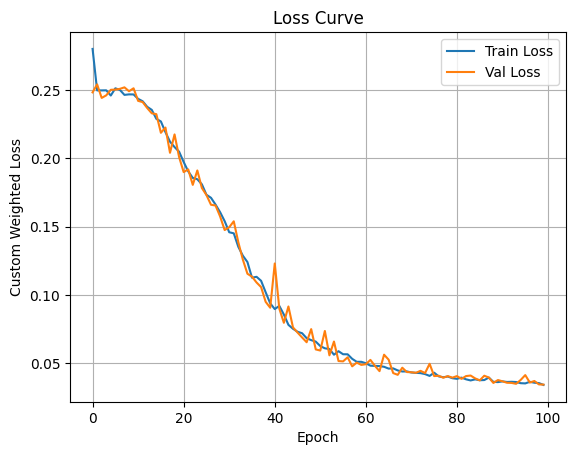

IoU > 0.7 Accuracy: 1.10%
Mean IoU: 0.1191, Median IoU: 0.0176
IoU Distribution:
  IoU > 0.5: 5.85%
  IoU > 0.6: 3.00%
  IoU > 0.7: 1.10%
  IoU > 0.8: 0.20%
  IoU > 0.9: 0.00%


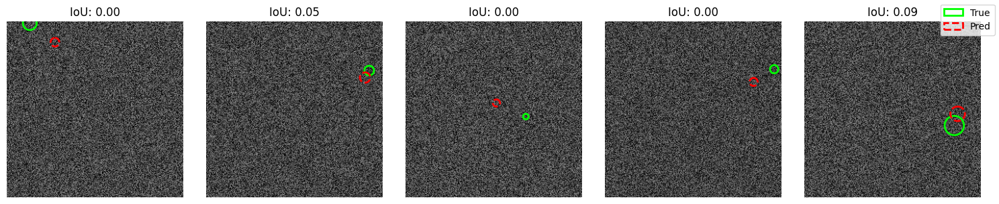

In [20]:
# --------- Evaluation and Visualization ---------
def show_predictions(model, dataset, device, num_samples=5):
    model.eval()
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 3))
    for i, idx in enumerate(indices):
        img, true = dataset[idx]
        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device)).cpu().numpy()[0]
        # Denormalize
        true_row = true[0].item() * IMG_SIZE
        true_col = true[1].item() * IMG_SIZE
        true_rad = true[2].item() * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        pred_row = pred[0] * IMG_SIZE
        pred_col = pred[1] * IMG_SIZE
        pred_rad = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        axs[i].imshow(img.squeeze(), cmap='gray')
        axs[i].add_patch(plt.Circle((true_col, true_row), true_rad, color='lime', fill=False, linewidth=2, label='True'))
        axs[i].add_patch(plt.Circle((pred_col, pred_row), pred_rad, color='red', fill=False, linewidth=2, linestyle='--', label='Pred'))
        axs[i].set_title(f"IoU: {intersection_over_union({'row': true_row, 'col': true_col, 'radius': true_rad}, {'row': pred_row, 'col': pred_col, 'radius': pred_rad}):.2f}")
        axs[i].axis('off')
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    plt.tight_layout()
    plt.show()

def intersection_over_union(circ1_dict, circ2_dict):
    shape1 = Point(circ1_dict['row'], circ1_dict['col']).buffer(circ1_dict['radius'])
    shape2 = Point(circ2_dict['row'], circ2_dict['col']).buffer(circ2_dict['radius'])
    return shape1.intersection(shape2).area / shape1.union(shape2).area

# --------- Example Usage ---------
if __name__ == '__main__':
    train_dataset = CircleOnTheFlyDataset(n_samples=20000)
    val_dataset = CircleOnTheFlyDataset(n_samples=2000)

    # train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True)
    # val_loader = DataLoader(val_dataset, batch_size=100)

    # A100-optimized DataLoaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=256,
        shuffle=True,
        num_workers=12,
        pin_memory=True,  # Important for faster CPU->GPU data transfer
        persistent_workers=True  # Keeps workers alive between iterations
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=256,
        shuffle=False,  # No need to shuffle validation data
        num_workers=12,
        pin_memory=True
    )

    # A100-optimized training settings
    optimizer = torch.optim.Adam(model.parameters(), lr=3e-3)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = CircleFinderCNN()
    train_model(model, train_loader, val_loader, device, epochs=100, patience=15)
    evaluate_model(model, val_loader, device)

    show_predictions(model, val_dataset, device, num_samples=5)

## IoU loss

Epoch 1, Train Loss: 1.8869, Val Loss: 1.9150
Epoch 2, Train Loss: 1.8661, Val Loss: 1.8653
Epoch 3, Train Loss: 1.8397, Val Loss: 1.8247
Epoch 4, Train Loss: 1.8002, Val Loss: 1.7524
Epoch 5, Train Loss: 1.7166, Val Loss: 1.6820
Epoch 6, Train Loss: 1.6246, Val Loss: 1.6458
Epoch 7, Train Loss: 1.5415, Val Loss: 1.7877
Epoch 8, Train Loss: 1.4747, Val Loss: 1.4198
Epoch 9, Train Loss: 1.3535, Val Loss: 1.3198
Epoch 10, Train Loss: 1.3122, Val Loss: 1.2486
Epoch 11, Train Loss: 1.2596, Val Loss: 1.2734
Epoch 12, Train Loss: 1.2047, Val Loss: 1.1656
Epoch 13, Train Loss: 1.1703, Val Loss: 1.2466
Epoch 14, Train Loss: 1.1354, Val Loss: 1.1639
Epoch 15, Train Loss: 1.1023, Val Loss: 1.0722
Epoch 16, Train Loss: 1.0902, Val Loss: 1.0619
Epoch 17, Train Loss: 1.0357, Val Loss: 1.0346
Epoch 18, Train Loss: 0.9977, Val Loss: 1.1042
Epoch 19, Train Loss: 0.9850, Val Loss: 0.9540
Epoch 20, Train Loss: 0.9759, Val Loss: 1.0107
Epoch 21, Train Loss: 0.9565, Val Loss: 0.9467
Epoch 22, Train Loss: 

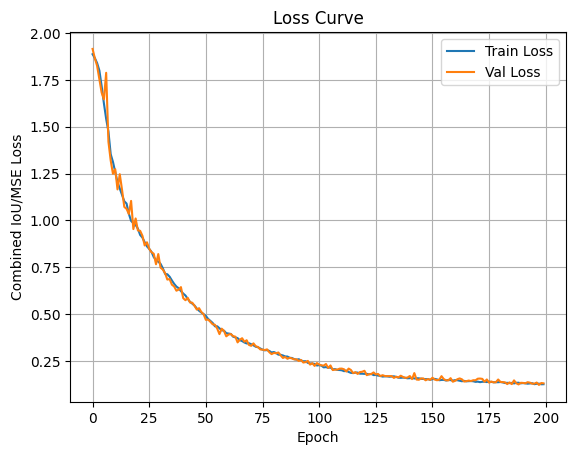

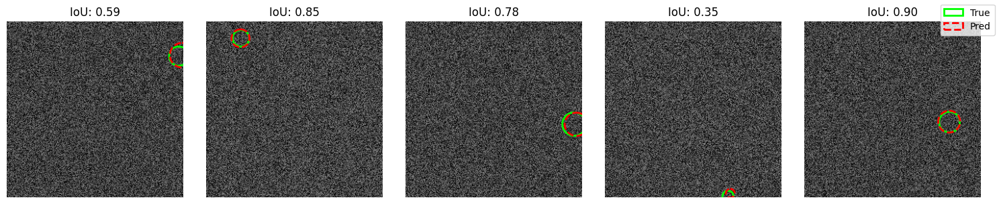

In [49]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import json
from torchvision import transforms
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from shapely.geometry import Point
#from create_dataset import generate_circle

# --------- Normalization Constants ---------
IMG_SIZE = 256
RADIUS_MIN, RADIUS_MAX = 3, 20

# --------- On-the-Fly Dataset Definition ---------
class CircleOnTheFlyDataset(Dataset):
    def __init__(self, n_samples=10000, noise_level=2):
        self.n_samples = n_samples
        self.noise_level = noise_level

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        img, label = generate_circle(noise_level=self.noise_level)
        img = np.expand_dims(img, axis=0)  # shape: (1, 256, 256)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

# --------- CNN Model Definition ---------
class CircleFinderCNN(nn.Module):
    def __init__(self):
        super(CircleFinderCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 16, kernel_size=5, stride=1, padding=2)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.fc1 = nn.Linear(32 * 64 * 64, 128)
        self.fc2 = nn.Linear(128, 3)
        self.sigmoid = nn.Sigmoid()  # Output in range [0, 1]

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 32 * 64 * 64)
        x = F.relu(self.fc1(x))
        x = self.sigmoid(self.fc2(x))
        return x

# --------- Training Loop ---------
def train_model(model, train_loader, val_loader, device, epochs=100, lr=1e-4, patience=15):
    optimizer = torch.optim.Adam(model.parameters(), lr=5e-5)

    def loss_function(pred, target):
        return combined_loss(pred, target, alpha=0.5)

    model.to(device)
    best_val_loss = float('inf')
    patience_counter = 0
    train_losses, val_losses = [], []

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for imgs, targets in train_loader:
            imgs, targets = imgs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = loss_function(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        val_loss = 0
        model.eval()
        with torch.no_grad():
            for imgs, targets in val_loader:
                imgs, targets = imgs.to(device), targets.to(device)
                outputs = model(imgs)
                loss = loss_function(outputs, targets)
                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)

        print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    # Plot loss
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Combined IoU/MSE Loss')
    plt.title('Loss Curve')
    plt.legend()
    plt.grid(True)
    plt.show()


# --------- Evaluation and Visualization ---------
def show_predictions(model, dataset, device, num_samples=5):
    model.eval()
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 3))
    for i, idx in enumerate(indices):
        img, true = dataset[idx]
        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device)).cpu().numpy()[0]
        # Denormalize
        true_row = true[0].item() * IMG_SIZE
        true_col = true[1].item() * IMG_SIZE
        true_rad = true[2].item() * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        pred_row = pred[0] * IMG_SIZE
        pred_col = pred[1] * IMG_SIZE
        pred_rad = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        axs[i].imshow(img.squeeze(), cmap='gray')
        axs[i].add_patch(plt.Circle((true_col, true_row), true_rad, color='lime', fill=False, linewidth=2, label='True'))
        axs[i].add_patch(plt.Circle((pred_col, pred_row), pred_rad, color='red', fill=False, linewidth=2, linestyle='--', label='Pred'))
        axs[i].set_title(f"IoU: {intersection_over_union({'row': true_row, 'col': true_col, 'radius': true_rad}, {'row': pred_row, 'col': pred_col, 'radius': pred_rad}):.2f}")
        axs[i].axis('off')
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    plt.tight_layout()
    plt.show()

def intersection_over_union(circ1_dict, circ2_dict):
    shape1 = Point(circ1_dict['row'], circ1_dict['col']).buffer(circ1_dict['radius'])
    shape2 = Point(circ2_dict['row'], circ2_dict['col']).buffer(circ2_dict['radius'])
    return shape1.intersection(shape2).area / shape1.union(shape2).area

def iou_loss(pred, target, epsilon=1e-6):
    """Simplified IoU loss for circle detection."""
    # Denormalize predictions and targets
    pred_row = pred[:, 0] * IMG_SIZE
    pred_col = pred[:, 1] * IMG_SIZE
    pred_radius = pred[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    target_row = target[:, 0] * IMG_SIZE
    target_col = target[:, 1] * IMG_SIZE
    target_radius = target[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    # Distance between centers
    center_dist = torch.sqrt((pred_row - target_row)**2 + (pred_col - target_col)**2)

    # Sum of radii
    radii_sum = pred_radius + target_radius

    # Simplified IoU loss that's differentiable and stable
    # Based on distance relative to radius sum (centers should be close relative to radii)
    # And radius difference relative to radius sum (radii should be similar)
    dist_loss = center_dist / (radii_sum + epsilon)
    radius_loss = torch.abs(pred_radius - target_radius) / (radii_sum + epsilon)

    # Combined metric that correlates well with IoU
    return dist_loss.mean() + radius_loss.mean()

def combined_loss(pred, target, alpha=0.5):
    """Combined MSE and IoU-aligned loss with better stability."""
    mse_component = F.mse_loss(pred, target)
    iou_component = iou_loss(pred, target)

    # Use a lower alpha to start - easier to optimize
    return alpha * iou_component + (1-alpha) * mse_component

# --------- Example Usage ---------
if __name__ == '__main__':
    train_dataset = CircleOnTheFlyDataset(n_samples=20000)
    val_dataset = CircleOnTheFlyDataset(n_samples=2000)

    # train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True)
    # val_loader = DataLoader(val_dataset, batch_size=100)

    # A100-optimized DataLoaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=256,
        shuffle=True,
        num_workers=12,
        pin_memory=True,  # Important for faster CPU->GPU data transfer
        persistent_workers=True  # Keeps workers alive between iterations
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=256,
        shuffle=False,  # No need to shuffle validation data
        num_workers=12,
        pin_memory=True
    )

    # A100-optimized training settings
    # optimizer = torch.optim.Adam(model.parameters(), lr=3e-3)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = CircleFinderCNN()
    train_model(model, train_loader, val_loader, device, epochs=200, patience=20)

    show_predictions(model, val_dataset, device, num_samples=5)

## more filters

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1, Train Loss: 2.2559, Val Loss: 2.2028, LR: 5.00e-05
Epoch 10, Train Loss: 1.5977, Val Loss: 1.5486, LR: 5.00e-05
Epoch 20, Train Loss: 1.0110, Val Loss: 0.9867, LR: 5.00e-05
Epoch 30, Train Loss: 0.7935, Val Loss: 0.7804, LR: 5.00e-05
Epoch 40, Train Loss: 0.6408, Val Loss: 0.6190, LR: 5.00e-05
Epoch 50, Train Loss: 0.5077, Val Loss: 0.4796, LR: 5.00e-05
Epoch 60, Train Loss: 0.4352, Val Loss: 0.4268, LR: 5.00e-05
Epoch 70, Train Loss: 0.3757, Val Loss: 0.3826, LR: 5.00e-05
Epoch 80, Train Loss: 0.3397, Val Loss: 0.3483, LR: 5.00e-05
Epoch 90, Train Loss: 0.3036, Val Loss: 0.2935, LR: 5.00e-05
Epoch 100, Train Loss: 0.2728, Val Loss: 0.2742, LR: 5.00e-05
Epoch 110, Train Loss: 0.2454, Val Loss: 0.2492, LR: 5.00e-05
Epoch 120, Train Loss: 0.2292, Val Loss: 0.2385, LR: 5.00e-05
Epoch 130, Train Loss: 0.2221, Val Loss: 0.2153, LR: 5.00e-05
Epoch 140, Train Loss: 0.1966, Val Loss: 0.2032, LR: 1.00e-05
Epoch 150, Train Loss: 0.1948, Val Loss: 0.1809, LR: 1.00e-05
Epoch 160, Train Lo

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x781c7c3e1300>Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x781c7c3e1300>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__

    Traceback (most recent call last):
self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
      File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
if w.is_alive():    
self._shutdown_workers() 
   File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
    if w.is_alive():
          Exception ignored in:   <function _MultiProcessingDataLoaderIter.__del__ at 0x781c7c3e1300>^^
Traceback (most recent call last):
^  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.

Epoch 200, Train Loss: 0.1847, Val Loss: 0.1908, LR: 1.00e-06


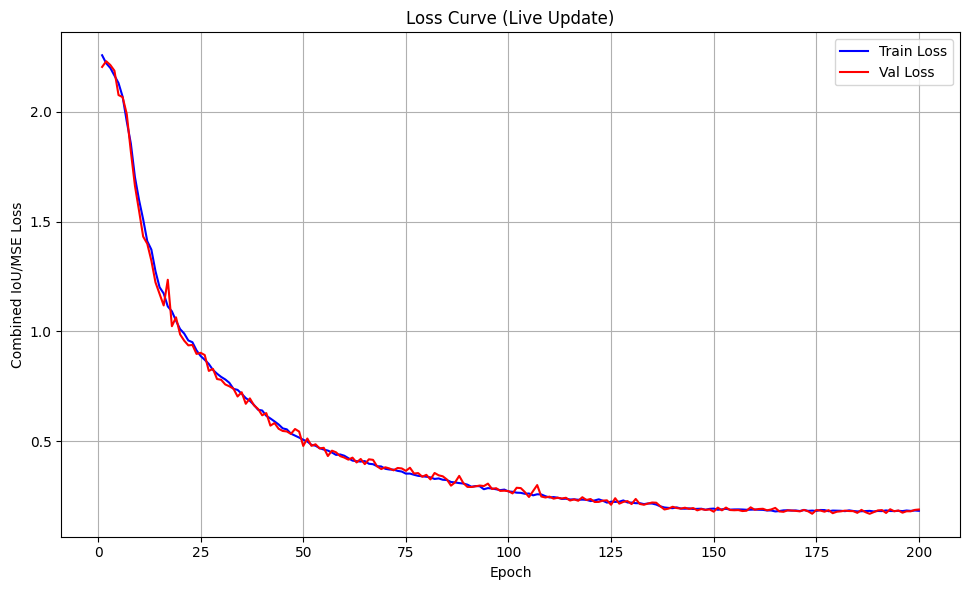

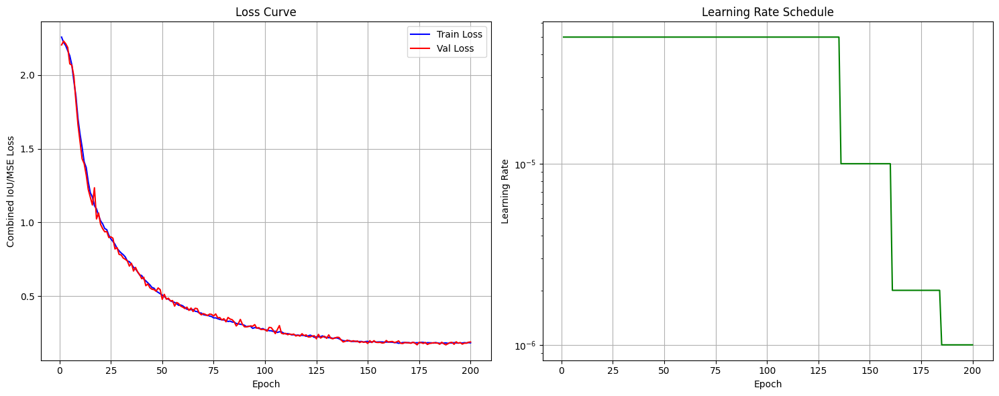

IoU > 0.7 Accuracy: 38.35%
Mean IoU: 0.6114, Median IoU: 0.6502
IoU Distribution:
  IoU > 0.5: 74.65%
  IoU > 0.6: 59.10%
  IoU > 0.7: 38.35%
  IoU > 0.8: 18.15%
  IoU > 0.9: 2.55%


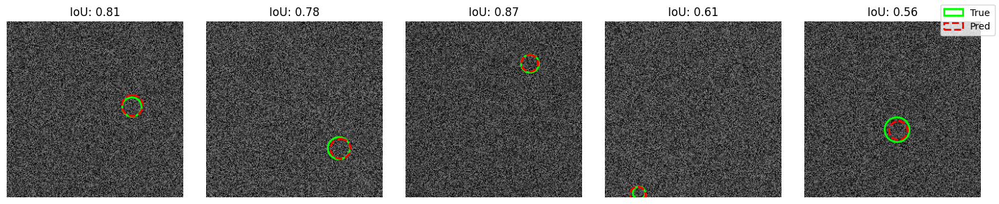

In [55]:


# --------- Normalization Constants ---------
IMG_SIZE = 256
RADIUS_MIN, RADIUS_MAX = 3, 20

# --------- On-the-Fly Dataset Definition ---------
class CircleOnTheFlyDataset(Dataset):
    def __init__(self, n_samples=10000, noise_level=2):
        self.n_samples = n_samples
        self.noise_level = noise_level

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        img, label = generate_circle(noise_level=self.noise_level)
        img = np.expand_dims(img, axis=0)  # shape: (1, 256, 256)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

# --------- CNN Model Definition ---------
class CircleFinderCNN(nn.Module):
    def __init__(self):
        super(CircleFinderCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 16, kernel_size=5, stride=1, padding=2)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.fc1 = nn.Linear(32 * 64 * 64, 128)
        self.fc2 = nn.Linear(128, 3)
        self.sigmoid = nn.Sigmoid()  # Output in range [0, 1]

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 32 * 64 * 64)
        x = F.relu(self.fc1(x))
        x = self.sigmoid(self.fc2(x))
        return x

# --------- Training Loop ---------
def train_model(model, train_loader, val_loader, device, epochs=200, lr=1e-4, patience=20):
    # Create optimizer with initial learning rate
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    # Learning rate scheduler - reduce LR when progress plateaus
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode='min',           # Minimize validation loss
        factor=0.2,           # Multiply LR by 0.2 when triggered
        patience=10,          # Wait 10 epochs of no improvement
        verbose=True,         # Print message when LR changes
        min_lr=1e-6           # Don't go below this LR
    )

    # Alternatively, use a step scheduler with predefined milestones
    # scheduler = torch.optim.lr_scheduler.MultiStepLR(
    #     optimizer,
    #     milestones=[60, 120, 160],  # Reduce LR at these epochs
    #     gamma=0.2,                  # Multiply by 0.2 at each milestone
    #     verbose=True
    # )

    def loss_function(pred, target):
        return combined_loss(pred, target, alpha=0.6)

    model.to(device)
    best_val_loss = float('inf')
    patience_counter = 0
    train_losses, val_losses = [], []

    # Set up the live plot
    plt.ion()  # Turn on interactive mode
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Combined IoU/MSE Loss')
    ax.set_title('Loss Curve (Live Update)')
    ax.grid(True)
    train_line, = ax.plot([], [], 'b-', label='Train Loss')
    val_line, = ax.plot([], [], 'r-', label='Val Loss')
    ax.legend()
    plt.tight_layout()

    # Lists to store epoch numbers and learning rates
    epochs_list = []
    lr_history = []

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for imgs, targets in train_loader:
            imgs, targets = imgs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = loss_function(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        val_loss = 0
        model.eval()
        with torch.no_grad():
            for imgs, targets in val_loader:
                imgs, targets = imgs.to(device), targets.to(device)
                outputs = model(imgs)
                loss = loss_function(outputs, targets)
                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)
        epochs_list.append(epoch + 1)

        # Update learning rate based on validation loss
        scheduler.step(val_loss)  # For ReduceLROnPlateau
        # scheduler.step()        # For MultiStepLR

        # Store current learning rate
        lr_history.append(optimizer.param_groups[0]['lr'])

        # Only print loss every 10 epochs (or for the first epoch)
        if epoch == 0 or (epoch + 1) % 10 == 0 or (epoch + 1) == epochs:
            print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, LR: {optimizer.param_groups[0]['lr']:.2e}")

        # Update the live plot
        train_line.set_data(epochs_list, train_losses)
        val_line.set_data(epochs_list, val_losses)
        ax.relim()  # Recalculate limits
        ax.autoscale_view()  # Autoscale
        fig.canvas.draw()
        fig.canvas.flush_events()

        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    # Turn off interactive mode after training
    plt.ioff()

    # Final static plot - now with two subplots
    plt.figure(figsize=(15, 6))

    # Loss plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_list, train_losses, 'b-', label='Train Loss')
    plt.plot(epochs_list, val_losses, 'r-', label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Combined IoU/MSE Loss')
    plt.title('Loss Curve')
    plt.legend()
    plt.grid(True)

    # Learning rate plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_list, lr_history, 'g-')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.title('Learning Rate Schedule')
    plt.grid(True)
    plt.yscale('log')  # Log scale for better visualization

    plt.tight_layout()
    plt.show()


# --------- Evaluation and Visualization ---------
def show_predictions(model, dataset, device, num_samples=5):
    model.eval()
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 3))
    for i, idx in enumerate(indices):
        img, true = dataset[idx]
        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device)).cpu().numpy()[0]
        # Denormalize
        true_row = true[0].item() * IMG_SIZE
        true_col = true[1].item() * IMG_SIZE
        true_rad = true[2].item() * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        pred_row = pred[0] * IMG_SIZE
        pred_col = pred[1] * IMG_SIZE
        pred_rad = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        axs[i].imshow(img.squeeze(), cmap='gray')
        axs[i].add_patch(plt.Circle((true_col, true_row), true_rad, color='lime', fill=False, linewidth=2, label='True'))
        axs[i].add_patch(plt.Circle((pred_col, pred_row), pred_rad, color='red', fill=False, linewidth=2, linestyle='--', label='Pred'))
        axs[i].set_title(f"IoU: {intersection_over_union({'row': true_row, 'col': true_col, 'radius': true_rad}, {'row': pred_row, 'col': pred_col, 'radius': pred_rad}):.2f}")
        axs[i].axis('off')
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    plt.tight_layout()
    plt.show()

def intersection_over_union(circ1_dict, circ2_dict):
    shape1 = Point(circ1_dict['row'], circ1_dict['col']).buffer(circ1_dict['radius'])
    shape2 = Point(circ2_dict['row'], circ2_dict['col']).buffer(circ2_dict['radius'])
    return shape1.intersection(shape2).area / shape1.union(shape2).area

def evaluate_model(model, dataloader, device, iou_threshold=0.7):
    model.eval()
    matches = 0
    total = 0
    all_ious = []  # Track all IoU values

    with torch.no_grad():
        for imgs, targets in dataloader:
            imgs = imgs.to(device)
            outputs = model(imgs).cpu().numpy()
            targets = targets.numpy()
            for pred, true in zip(outputs, targets):
                # Denormalize for IoU calculation
                pred_row = pred[0] * IMG_SIZE
                pred_col = pred[1] * IMG_SIZE
                pred_radius = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                true_row = true[0] * IMG_SIZE
                true_col = true[1] * IMG_SIZE
                true_radius = true[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                pred_dict = {'row': pred_row, 'col': pred_col, 'radius': pred_radius}
                true_dict = {'row': true_row, 'col': true_col, 'radius': true_radius}

                iou = intersection_over_union(pred_dict, true_dict)
                all_ious.append(iou)

                if iou > iou_threshold:
                    matches += 1
                total += 1

    # Calculate more informative metrics
    accuracy = matches / total
    mean_iou = sum(all_ious) / len(all_ious)
    median_iou = sorted(all_ious)[len(all_ious)//2]

    # Show distribution in IoU brackets
    brackets = [0.5, 0.6, 0.7, 0.8, 0.9]
    bracket_counts = [sum(1 for iou in all_ious if iou > thresh) / total for thresh in brackets]

    print(f"IoU > {iou_threshold} Accuracy: {accuracy:.2%}")
    print(f"Mean IoU: {mean_iou:.4f}, Median IoU: {median_iou:.4f}")
    print("IoU Distribution:")
    for thresh, count in zip(brackets, bracket_counts):
        print(f"  IoU > {thresh:.1f}: {count:.2%}")

    return accuracy, mean_iou, all_ious

def iou_loss(pred, target, epsilon=1e-6, target_threshold=0.7):
    """Enhanced IoU loss with threshold focus."""
    # Denormalize predictions and targets
    pred_row = pred[:, 0] * IMG_SIZE
    pred_col = pred[:, 1] * IMG_SIZE
    pred_radius = pred[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    target_row = target[:, 0] * IMG_SIZE
    target_col = target[:, 1] * IMG_SIZE
    target_radius = target[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    # Distance between centers
    center_dist = torch.sqrt((pred_row - target_row)**2 + (pred_col - target_col)**2)

    # Sum of radii
    radii_sum = pred_radius + target_radius

    # Base IoU component calculation
    dist_loss = center_dist / (radii_sum + epsilon)
    radius_loss = torch.abs(pred_radius - target_radius) / (radii_sum + epsilon)
    base_iou_loss = dist_loss + radius_loss

    # Estimated IoU - approximate conversion from our distance metrics
    # This is a rough approximation to help with scaling
    est_iou = 1.0 - torch.clamp(base_iou_loss, 0.0, 1.0)

    # Apply increased penalty for predictions near but below threshold
    # This creates a "soft hinge" that pushes predictions to exceed the threshold
    threshold_penalty = torch.where(
        (est_iou < target_threshold) & (est_iou > target_threshold - 0.2),
        1.5 * (target_threshold - est_iou),  # 1.5x penalty in the critical region
        torch.zeros_like(est_iou)
    )

    # Combined loss with threshold incentive
    return base_iou_loss.mean() + threshold_penalty.mean()

def combined_loss(pred, target, alpha=0.6):
    """Combined MSE and enhanced IoU loss."""
    mse_component = F.mse_loss(pred, target)
    iou_component = iou_loss(pred, target, target_threshold=0.7)

    # Slightly higher alpha - focus more on IoU now that training is stable
    return alpha * iou_component + (1-alpha) * mse_component

# --------- Example Usage ---------
if __name__ == '__main__':
    train_dataset = CircleOnTheFlyDataset(n_samples=20000)
    val_dataset = CircleOnTheFlyDataset(n_samples=2000)

    # train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True)
    # val_loader = DataLoader(val_dataset, batch_size=100)

    # A100-optimized DataLoaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=256,
        shuffle=True,
        num_workers=12,
        pin_memory=True,  # Important for faster CPU->GPU data transfer
        persistent_workers=True  # Keeps workers alive between iterations
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=256,
        shuffle=False,  # No need to shuffle validation data
        num_workers=12,
        pin_memory=True
    )


    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = CircleFinderCNN()
    train_model(model, train_loader, val_loader, device, epochs=200, patience=20, lr=5e-5)
    evaluate_model(model, val_loader, device)
    show_predictions(model, val_dataset, device, num_samples=5)

## coordconv

Epoch 1, Train Loss: 2.2878, Val Loss: 2.1953, LR: 1.00e-04
Epoch 10, Train Loss: 2.0257, Val Loss: 2.1417, LR: 1.00e-04
Epoch 20, Train Loss: 1.5652, Val Loss: 1.6523, LR: 1.00e-04
Epoch 30, Train Loss: 1.3429, Val Loss: 1.3448, LR: 1.00e-04
Epoch 40, Train Loss: 1.2127, Val Loss: 1.4072, LR: 1.00e-04
Epoch 50, Train Loss: 1.1744, Val Loss: 1.2635, LR: 1.00e-04
Epoch 60, Train Loss: 1.0931, Val Loss: 1.1295, LR: 1.00e-04
Epoch 70, Train Loss: 1.0396, Val Loss: 1.0595, LR: 1.00e-04
Epoch 80, Train Loss: 0.9618, Val Loss: 0.9511, LR: 1.00e-04
Epoch 90, Train Loss: 0.9377, Val Loss: 0.9368, LR: 1.00e-04
Epoch 100, Train Loss: 0.8993, Val Loss: 0.9746, LR: 1.00e-04


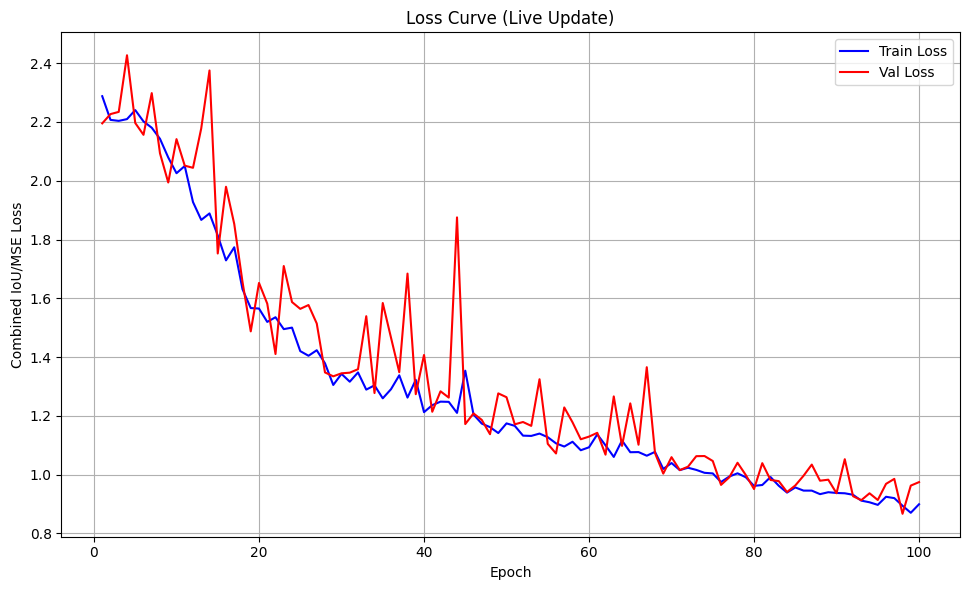

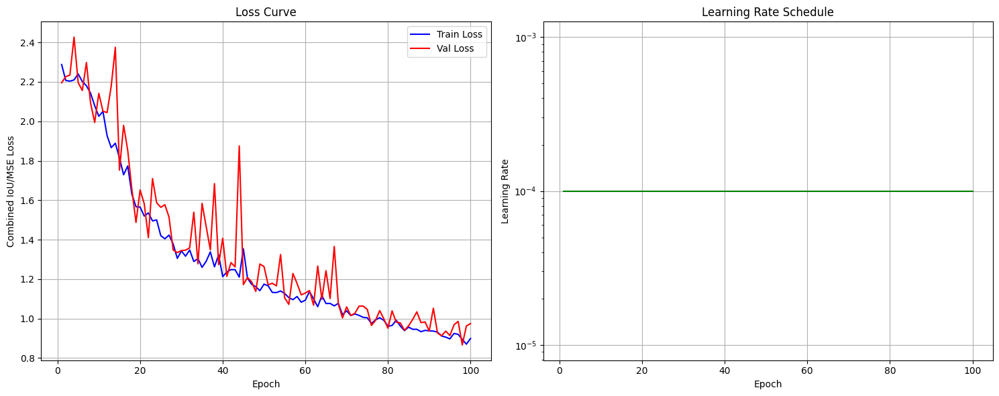

IoU > 0.7 Accuracy: 0.35%
Mean IoU: 0.1216, Median IoU: 0.0528
IoU Distribution:
  IoU > 0.5: 2.55%
  IoU > 0.6: 1.00%
  IoU > 0.7: 0.35%
  IoU > 0.8: 0.15%
  IoU > 0.9: 0.00%


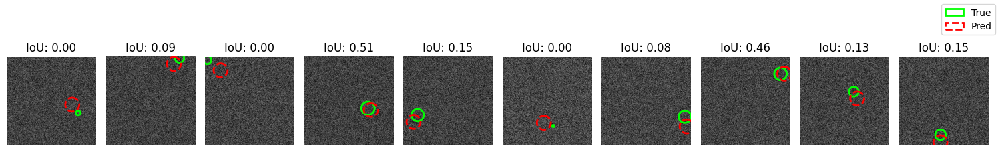

In [60]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import json
from torchvision import transforms
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from shapely.geometry import Point
#from create_dataset import generate_circle
import math

# --------- Normalization Constants ---------
IMG_SIZE = 256
RADIUS_MIN, RADIUS_MAX = 3, 20

# --------- On-the-Fly Dataset Definition ---------
class CircleOnTheFlyDataset(Dataset):
    def __init__(self, n_samples=10000, noise_level=2):
        self.n_samples = n_samples
        self.noise_level = noise_level

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        img, label = generate_circle(noise_level=self.noise_level)
        img = np.expand_dims(img, axis=0)  # shape: (1, 256, 256)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

# --------- More Efficient and Robust CoordConv Implementation ---------
class AddCoords(nn.Module):
    """Add coordinates to input feature maps."""
    def __init__(self, with_r=False):
        super().__init__()
        self.with_r = with_r

    def forward(self, input_tensor):
        batch_size, _, height, width = input_tensor.size()

        # More efficient coordinate generation using meshgrid
        y_range = torch.linspace(-1, 1, height, device=input_tensor.device)
        x_range = torch.linspace(-1, 1, width, device=input_tensor.device)
        y_grid, x_grid = torch.meshgrid(y_range, x_range, indexing='ij')

        # Expand to match batch dimension
        y_grid = y_grid.unsqueeze(0).unsqueeze(0).expand(batch_size, 1, -1, -1)
        x_grid = x_grid.unsqueeze(0).unsqueeze(0).expand(batch_size, 1, -1, -1)

        # Concat coordinates
        ret = torch.cat([input_tensor, x_grid, y_grid], dim=1)

        if self.with_r:
            # Efficient radius calculation using tensor operations
            r_grid = torch.sqrt(x_grid ** 2 + y_grid ** 2) / math.sqrt(2)
            ret = torch.cat([ret, r_grid], dim=1)

        return ret

class CoordConv(nn.Module):
    """CoordConv layer with optional 'r' coordinate."""
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=True, with_r=False):
        super().__init__()
        self.addcoords = AddCoords(with_r=with_r)
        in_channels += 2  # Add 2 channels for x,y coordinates
        if with_r:
            in_channels += 1  # Add 1 more channel for radius
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, dilation, groups, bias)

    def forward(self, x):
        x = self.addcoords(x)
        x = self.conv(x)
        return x

# --------- CNN Model Definition with CoordConv ---------
class CircleFinderCoordCNN(nn.Module):
    def __init__(self):
        super(CircleFinderCoordCNN, self).__init__()
        # Replace standard Conv2d with CoordConv
        self.conv1 = CoordConv(1, 16, kernel_size=5, stride=1, padding=2, with_r=True)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = CoordConv(16, 32, kernel_size=5, stride=1, padding=2, with_r=True)
        self.fc1 = nn.Linear(32 * 64 * 64, 128)
        self.fc2 = nn.Linear(128, 3)
        self.sigmoid = nn.Sigmoid()  # Output in range [0, 1]

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 32 * 64 * 64)
        x = F.relu(self.fc1(x))
        x = self.sigmoid(self.fc2(x))
        return x

# --------- Training Loop ---------
def train_model(model, train_loader, val_loader, device, epochs=200, lr=5e-5, patience=20):
    # Create optimizer with initial learning rate
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    # Learning rate scheduler - reduce LR when progress plateaus
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode='min',           # Minimize validation loss
        factor=0.2,           # Multiply LR by 0.2 when triggered
        patience=10,          # Wait 10 epochs of no improvement
        verbose=True,         # Print message when LR changes
        min_lr=1e-6           # Don't go below this LR
    )

    # Alternatively, use a step scheduler with predefined milestones
    # scheduler = torch.optim.lr_scheduler.MultiStepLR(
    #     optimizer,
    #     milestones=[60, 120, 160],  # Reduce LR at these epochs
    #     gamma=0.2,                  # Multiply by 0.2 at each milestone
    #     verbose=True
    # )

    def loss_function(pred, target):
        return combined_loss(pred, target, alpha=0.6)

    model.to(device)
    best_val_loss = float('inf')
    patience_counter = 0
    train_losses, val_losses = [], []

    # Set up the live plot
    plt.ion()  # Turn on interactive mode
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Combined IoU/MSE Loss')
    ax.set_title('Loss Curve (Live Update)')
    ax.grid(True)
    train_line, = ax.plot([], [], 'b-', label='Train Loss')
    val_line, = ax.plot([], [], 'r-', label='Val Loss')
    ax.legend()
    plt.tight_layout()

    # Lists to store epoch numbers and learning rates
    epochs_list = []
    lr_history = []

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for imgs, targets in train_loader:
            imgs, targets = imgs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = loss_function(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        val_loss = 0
        model.eval()
        with torch.no_grad():
            for imgs, targets in val_loader:
                imgs, targets = imgs.to(device), targets.to(device)
                outputs = model(imgs)
                loss = loss_function(outputs, targets)
                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)
        epochs_list.append(epoch + 1)

        # Update learning rate based on validation loss
        scheduler.step(val_loss)  # For ReduceLROnPlateau
        # scheduler.step()        # For MultiStepLR

        # Store current learning rate
        lr_history.append(optimizer.param_groups[0]['lr'])

        # Only print loss every 10 epochs (or for the first epoch)
        if epoch == 0 or (epoch + 1) % 10 == 0 or (epoch + 1) == epochs:
            print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, LR: {optimizer.param_groups[0]['lr']:.2e}")

        # Update the live plot
        train_line.set_data(epochs_list, train_losses)
        val_line.set_data(epochs_list, val_losses)
        ax.relim()  # Recalculate limits
        ax.autoscale_view()  # Autoscale
        fig.canvas.draw()
        fig.canvas.flush_events()

        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    # Turn off interactive mode after training
    plt.ioff()

    # Final static plot - now with two subplots
    plt.figure(figsize=(15, 6))

    # Loss plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_list, train_losses, 'b-', label='Train Loss')
    plt.plot(epochs_list, val_losses, 'r-', label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Combined IoU/MSE Loss')
    plt.title('Loss Curve')
    plt.legend()
    plt.grid(True)

    # Learning rate plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_list, lr_history, 'g-')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.title('Learning Rate Schedule')
    plt.grid(True)
    plt.yscale('log')  # Log scale for better visualization

    plt.tight_layout()
    plt.show()


# --------- Evaluation and Visualization ---------
def show_predictions(model, dataset, device, num_samples=5):
    model.eval()
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 3))
    for i, idx in enumerate(indices):
        img, true = dataset[idx]
        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device)).cpu().numpy()[0]
        # Denormalize
        true_row = true[0].item() * IMG_SIZE
        true_col = true[1].item() * IMG_SIZE
        true_rad = true[2].item() * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        pred_row = pred[0] * IMG_SIZE
        pred_col = pred[1] * IMG_SIZE
        pred_rad = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        axs[i].imshow(img.squeeze(), cmap='gray')
        axs[i].add_patch(plt.Circle((true_col, true_row), true_rad, color='lime', fill=False, linewidth=2, label='True'))
        axs[i].add_patch(plt.Circle((pred_col, pred_row), pred_rad, color='red', fill=False, linewidth=2, linestyle='--', label='Pred'))
        axs[i].set_title(f"IoU: {intersection_over_union({'row': true_row, 'col': true_col, 'radius': true_rad}, {'row': pred_row, 'col': pred_col, 'radius': pred_rad}):.2f}")
        axs[i].axis('off')
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    plt.tight_layout()
    plt.show()

def intersection_over_union(circ1_dict, circ2_dict):
    shape1 = Point(circ1_dict['row'], circ1_dict['col']).buffer(circ1_dict['radius'])
    shape2 = Point(circ2_dict['row'], circ2_dict['col']).buffer(circ2_dict['radius'])
    return shape1.intersection(shape2).area / shape1.union(shape2).area

def evaluate_model(model, dataloader, device, iou_threshold=0.7):
    model.eval()
    matches = 0
    total = 0
    all_ious = []  # Track all IoU values

    with torch.no_grad():
        for imgs, targets in dataloader:
            imgs = imgs.to(device)
            outputs = model(imgs).cpu().numpy()
            targets = targets.numpy()
            for pred, true in zip(outputs, targets):
                # Denormalize for IoU calculation
                pred_row = pred[0] * IMG_SIZE
                pred_col = pred[1] * IMG_SIZE
                pred_radius = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                true_row = true[0] * IMG_SIZE
                true_col = true[1] * IMG_SIZE
                true_radius = true[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                pred_dict = {'row': pred_row, 'col': pred_col, 'radius': pred_radius}
                true_dict = {'row': true_row, 'col': true_col, 'radius': true_radius}

                iou = intersection_over_union(pred_dict, true_dict)
                all_ious.append(iou)

                if iou > iou_threshold:
                    matches += 1
                total += 1

    # Calculate more informative metrics
    accuracy = matches / total
    mean_iou = sum(all_ious) / len(all_ious)
    median_iou = sorted(all_ious)[len(all_ious)//2]

    # Show distribution in IoU brackets
    brackets = [0.5, 0.6, 0.7, 0.8, 0.9]
    bracket_counts = [sum(1 for iou in all_ious if iou > thresh) / total for thresh in brackets]

    print(f"IoU > {iou_threshold} Accuracy: {accuracy:.2%}")
    print(f"Mean IoU: {mean_iou:.4f}, Median IoU: {median_iou:.4f}")
    print("IoU Distribution:")
    for thresh, count in zip(brackets, bracket_counts):
        print(f"  IoU > {thresh:.1f}: {count:.2%}")

    return accuracy, mean_iou, all_ious

def iou_loss(pred, target, epsilon=1e-6, target_threshold=0.7):
    """Enhanced IoU loss with threshold focus."""
    # Denormalize predictions and targets
    pred_row = pred[:, 0] * IMG_SIZE
    pred_col = pred[:, 1] * IMG_SIZE
    pred_radius = pred[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    target_row = target[:, 0] * IMG_SIZE
    target_col = target[:, 1] * IMG_SIZE
    target_radius = target[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    # Distance between centers
    center_dist = torch.sqrt((pred_row - target_row)**2 + (pred_col - target_col)**2)

    # Sum of radii
    radii_sum = pred_radius + target_radius

    # Base IoU component calculation
    dist_loss = center_dist / (radii_sum + epsilon)
    radius_loss = torch.abs(pred_radius - target_radius) / (radii_sum + epsilon)
    base_iou_loss = dist_loss + radius_loss

    # Estimated IoU - approximate conversion from our distance metrics
    # This is a rough approximation to help with scaling
    est_iou = 1.0 - torch.clamp(base_iou_loss, 0.0, 1.0)

    # Apply increased penalty for predictions near but below threshold
    # This creates a "soft hinge" that pushes predictions to exceed the threshold
    threshold_penalty = torch.where(
        (est_iou < target_threshold) & (est_iou > target_threshold - 0.2),
        1.5 * (target_threshold - est_iou),  # 1.5x penalty in the critical region
        torch.zeros_like(est_iou)
    )

    # Combined loss with threshold incentive
    return base_iou_loss.mean() + threshold_penalty.mean()

def combined_loss(pred, target, alpha=0.6):
    """Combined MSE and enhanced IoU loss."""
    mse_component = F.mse_loss(pred, target)
    iou_component = iou_loss(pred, target, target_threshold=0.7)

    # Slightly higher alpha - focus more on IoU now that training is stable
    return alpha * iou_component + (1-alpha) * mse_component

# --------- Example Usage ---------
if __name__ == '__main__':
    # Reduce training samples for faster tuning
    train_dataset = CircleOnTheFlyDataset(n_samples=10000)
    val_dataset = CircleOnTheFlyDataset(n_samples=2000)

    # More robust DataLoader configuration
    train_loader = DataLoader(
        train_dataset,
        batch_size=256,
        shuffle=True,
        num_workers=4,  # Reduced from 12
        pin_memory=True,
        persistent_workers=False  # Changed to False for more stability
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=256,
        shuffle=False,
        num_workers=4,  # Reduced from 12
        pin_memory=True,
        persistent_workers=False  # Changed to False
    )

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Use the CoordConv model instead of the standard CNN
    model = CircleFinderCoordCNN()

    # Increase learning rate for faster tuning
    train_model(model, train_loader, val_loader, device, epochs=100, patience=15, lr=1e-4)

    evaluate_model(model, val_loader, device)

    # Show more sample predictions
    show_predictions(model, val_dataset, device, num_samples=10)

Epoch 1, Train Loss: 2.2508, Val Loss: 2.2441, LR: 1.00e-04
Epoch 10, Train Loss: 2.0720, Val Loss: 2.0068, LR: 1.00e-04
Epoch 20, Train Loss: 1.7628, Val Loss: 1.6851, LR: 1.00e-04
Epoch 30, Train Loss: 1.5542, Val Loss: 1.7721, LR: 1.00e-04
Epoch 40, Train Loss: 1.4002, Val Loss: 1.3594, LR: 1.00e-04
Epoch 50, Train Loss: 1.3215, Val Loss: 1.3176, LR: 1.00e-04
Epoch 60, Train Loss: 1.2412, Val Loss: 1.4894, LR: 1.00e-04
Epoch 70, Train Loss: 1.1919, Val Loss: 1.2554, LR: 1.00e-04
Epoch 80, Train Loss: 1.1069, Val Loss: 1.2052, LR: 1.00e-04
Epoch 90, Train Loss: 1.0525, Val Loss: 1.1152, LR: 2.00e-05
Epoch 100, Train Loss: 1.0689, Val Loss: 1.0550, LR: 4.00e-06


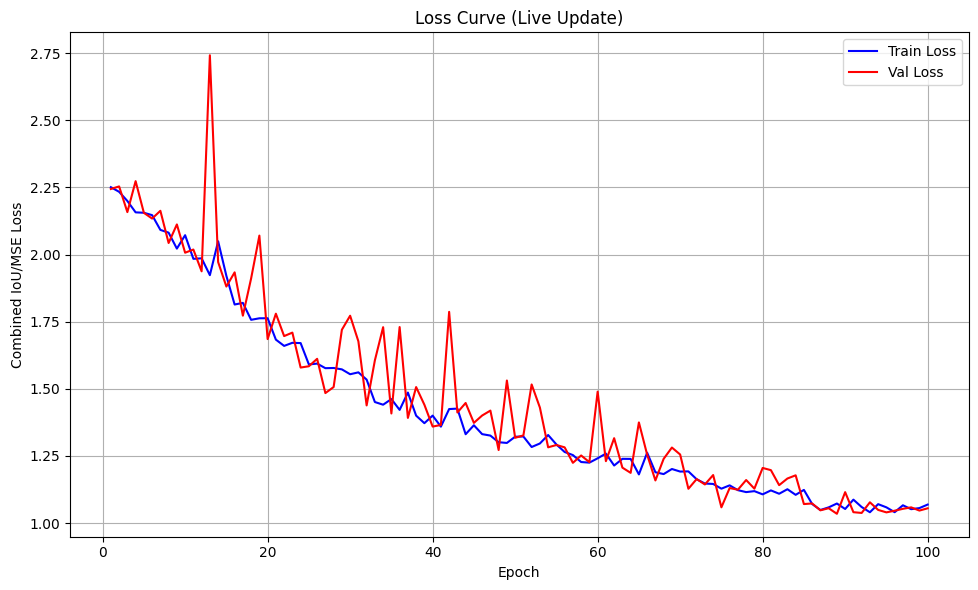

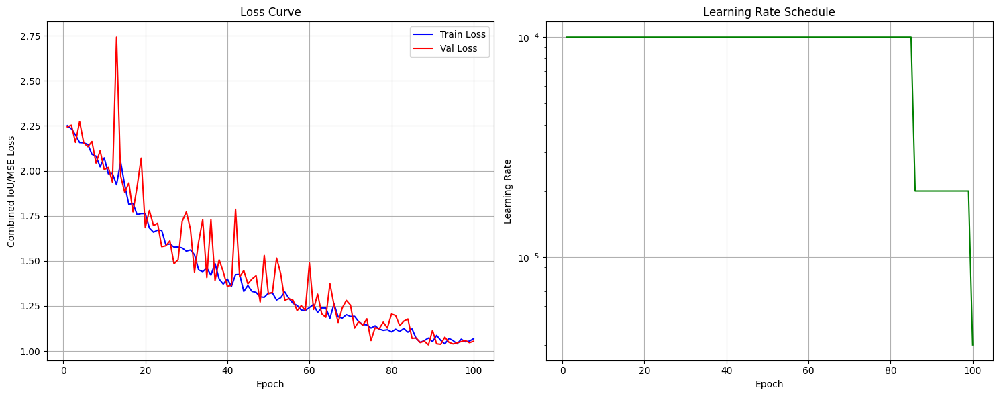

Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x781c7c3e1300>Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.11/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process


IoU > 0.7 Accuracy: 0.35%
Mean IoU: 0.1018, Median IoU: 0.0018
IoU Distribution:
  IoU > 0.5: 2.65%
  IoU > 0.6: 1.25%
  IoU > 0.7: 0.35%
  IoU > 0.8: 0.25%
  IoU > 0.9: 0.00%


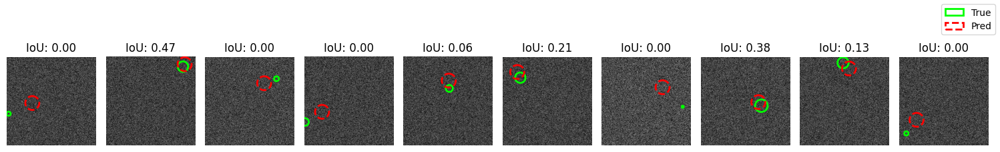

In [64]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import json
from torchvision import transforms
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from shapely.geometry import Point
#from create_dataset import generate_circle
import math

# --------- Normalization Constants ---------
IMG_SIZE = 256
RADIUS_MIN, RADIUS_MAX = 3, 20

# --------- On-the-Fly Dataset Definition ---------
class CircleOnTheFlyDataset(Dataset):
    def __init__(self, n_samples=10000, noise_level=2):
        self.n_samples = n_samples
        self.noise_level = noise_level

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        img, label = generate_circle(noise_level=self.noise_level)
        img = np.expand_dims(img, axis=0)  # shape: (1, 256, 256)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

# --------- Coordinate Channel Function ---------
def create_coord_channels(img_tensor):
    """Add coordinate channels to input images, perfectly matching the circle generation process.

    Args:
        img_tensor: Tensor of shape [batch_size, 1, height, width]

    Returns:
        Tensor of shape [batch_size, 3, height, width] with x,y coords added
    """
    batch_size, _, height, width = img_tensor.size()

    # Create normalized coordinates exactly matching label normalization
    # row and col are divided by IMG_SIZE in the dataset class
    y_coords = torch.linspace(0, 1, height, device=img_tensor.device)  # normalized row coords
    x_coords = torch.linspace(0, 1, width, device=img_tensor.device)   # normalized col coords

    # Create meshgrid
    y_grid, x_grid = torch.meshgrid(y_coords, x_coords, indexing='ij')

    # Expand to batch dimension
    x_grid = x_grid.unsqueeze(0).unsqueeze(0).expand(batch_size, 1, -1, -1)
    y_grid = y_grid.unsqueeze(0).unsqueeze(0).expand(batch_size, 1, -1, -1)

    # Don't scale the coordinates - keep them in [0,1] range to maintain
    # the same semantic meaning as the target coordinates

    # Concatenate with input
    return torch.cat([img_tensor, x_grid, y_grid], dim=1)

# --------- CNN Model Definition with Coordinate Channels ---------
class CircleFinderCoordCNN(nn.Module):
    def __init__(self):
        super(CircleFinderCoordCNN, self).__init__()
        # Modified first conv layer to accept 3 channels (image + x,y coords)
        self.conv1 = nn.Conv2d(3, 16, kernel_size=5, stride=1, padding=2)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.fc1 = nn.Linear(32 * 64 * 64, 128)
        self.fc2 = nn.Linear(128, 3)
        self.sigmoid = nn.Sigmoid()  # Output in range [0, 1]

    def forward(self, x):
        # Add coordinate channels to input
        x = create_coord_channels(x)

        # Regular CNN processing
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 32 * 64 * 64)
        x = F.relu(self.fc1(x))
        x = self.sigmoid(self.fc2(x))
        return x

# --------- Original CNN Model (kept for comparison) ---------
class CircleFinderCNN(nn.Module):
    def __init__(self):
        super(CircleFinderCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 16, kernel_size=5, stride=1, padding=2)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.fc1 = nn.Linear(32 * 64 * 64, 128)
        self.fc2 = nn.Linear(128, 3)
        self.sigmoid = nn.Sigmoid()  # Output in range [0, 1]

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 32 * 64 * 64)
        x = F.relu(self.fc1(x))
        x = self.sigmoid(self.fc2(x))
        return x

# --------- Training Loop ---------
def train_model(model, train_loader, val_loader, device, epochs=200, lr=5e-5, patience=20):
    # Create optimizer with initial learning rate
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    # Learning rate scheduler - reduce LR when progress plateaus
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode='min',           # Minimize validation loss
        factor=0.2,           # Multiply LR by 0.2 when triggered
        patience=10,          # Wait 10 epochs of no improvement
        verbose=True,         # Print message when LR changes
        min_lr=1e-6           # Don't go below this LR
    )

    # Alternatively, use a step scheduler with predefined milestones
    # scheduler = torch.optim.lr_scheduler.MultiStepLR(
    #     optimizer,
    #     milestones=[60, 120, 160],  # Reduce LR at these epochs
    #     gamma=0.2,                  # Multiply by 0.2 at each milestone
    #     verbose=True
    # )

    def loss_function(pred, target):
        return combined_loss(pred, target, alpha=0.6)

    model.to(device)
    best_val_loss = float('inf')
    patience_counter = 0
    train_losses, val_losses = [], []

    # Set up the live plot
    plt.ion()  # Turn on interactive mode
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Combined IoU/MSE Loss')
    ax.set_title('Loss Curve (Live Update)')
    ax.grid(True)
    train_line, = ax.plot([], [], 'b-', label='Train Loss')
    val_line, = ax.plot([], [], 'r-', label='Val Loss')
    ax.legend()
    plt.tight_layout()

    # Lists to store epoch numbers and learning rates
    epochs_list = []
    lr_history = []

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for imgs, targets in train_loader:
            imgs, targets = imgs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = loss_function(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        val_loss = 0
        model.eval()
        with torch.no_grad():
            for imgs, targets in val_loader:
                imgs, targets = imgs.to(device), targets.to(device)
                outputs = model(imgs)
                loss = loss_function(outputs, targets)
                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)
        epochs_list.append(epoch + 1)

        # Update learning rate based on validation loss
        scheduler.step(val_loss)  # For ReduceLROnPlateau
        # scheduler.step()        # For MultiStepLR

        # Store current learning rate
        lr_history.append(optimizer.param_groups[0]['lr'])

        # Only print loss every 10 epochs (or for the first epoch)
        if epoch == 0 or (epoch + 1) % 10 == 0 or (epoch + 1) == epochs:
            print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, LR: {optimizer.param_groups[0]['lr']:.2e}")

        # Update the live plot
        train_line.set_data(epochs_list, train_losses)
        val_line.set_data(epochs_list, val_losses)
        ax.relim()  # Recalculate limits
        ax.autoscale_view()  # Autoscale
        fig.canvas.draw()
        fig.canvas.flush_events()

        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    # Turn off interactive mode after training
    plt.ioff()

    # Final static plot - now with two subplots
    plt.figure(figsize=(15, 6))

    # Loss plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_list, train_losses, 'b-', label='Train Loss')
    plt.plot(epochs_list, val_losses, 'r-', label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Combined IoU/MSE Loss')
    plt.title('Loss Curve')
    plt.legend()
    plt.grid(True)

    # Learning rate plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_list, lr_history, 'g-')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.title('Learning Rate Schedule')
    plt.grid(True)
    plt.yscale('log')  # Log scale for better visualization

    plt.tight_layout()
    plt.show()


# --------- Evaluation and Visualization ---------
def show_predictions(model, dataset, device, num_samples=5):
    model.eval()
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 3))
    for i, idx in enumerate(indices):
        img, true = dataset[idx]
        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device)).cpu().numpy()[0]
        # Denormalize
        true_row = true[0].item() * IMG_SIZE
        true_col = true[1].item() * IMG_SIZE
        true_rad = true[2].item() * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        pred_row = pred[0] * IMG_SIZE
        pred_col = pred[1] * IMG_SIZE
        pred_rad = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        axs[i].imshow(img.squeeze(), cmap='gray')
        axs[i].add_patch(plt.Circle((true_col, true_row), true_rad, color='lime', fill=False, linewidth=2, label='True'))
        axs[i].add_patch(plt.Circle((pred_col, pred_row), pred_rad, color='red', fill=False, linewidth=2, linestyle='--', label='Pred'))
        axs[i].set_title(f"IoU: {intersection_over_union({'row': true_row, 'col': true_col, 'radius': true_rad}, {'row': pred_row, 'col': pred_col, 'radius': pred_rad}):.2f}")
        axs[i].axis('off')
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    plt.tight_layout()
    plt.show()

def intersection_over_union(circ1_dict, circ2_dict):
    shape1 = Point(circ1_dict['row'], circ1_dict['col']).buffer(circ1_dict['radius'])
    shape2 = Point(circ2_dict['row'], circ2_dict['col']).buffer(circ2_dict['radius'])
    return shape1.intersection(shape2).area / shape1.union(shape2).area

def evaluate_model(model, dataloader, device, iou_threshold=0.7):
    model.eval()
    matches = 0
    total = 0
    all_ious = []  # Track all IoU values

    with torch.no_grad():
        for imgs, targets in dataloader:
            imgs = imgs.to(device)
            outputs = model(imgs).cpu().numpy()
            targets = targets.numpy()
            for pred, true in zip(outputs, targets):
                # Denormalize for IoU calculation
                pred_row = pred[0] * IMG_SIZE
                pred_col = pred[1] * IMG_SIZE
                pred_radius = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                true_row = true[0] * IMG_SIZE
                true_col = true[1] * IMG_SIZE
                true_radius = true[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                pred_dict = {'row': pred_row, 'col': pred_col, 'radius': pred_radius}
                true_dict = {'row': true_row, 'col': true_col, 'radius': true_radius}

                iou = intersection_over_union(pred_dict, true_dict)
                all_ious.append(iou)

                if iou > iou_threshold:
                    matches += 1
                total += 1

    # Calculate more informative metrics
    accuracy = matches / total
    mean_iou = sum(all_ious) / len(all_ious)
    median_iou = sorted(all_ious)[len(all_ious)//2]

    # Show distribution in IoU brackets
    brackets = [0.5, 0.6, 0.7, 0.8, 0.9]
    bracket_counts = [sum(1 for iou in all_ious if iou > thresh) / total for thresh in brackets]

    print(f"IoU > {iou_threshold} Accuracy: {accuracy:.2%}")
    print(f"Mean IoU: {mean_iou:.4f}, Median IoU: {median_iou:.4f}")
    print("IoU Distribution:")
    for thresh, count in zip(brackets, bracket_counts):
        print(f"  IoU > {thresh:.1f}: {count:.2%}")

    return accuracy, mean_iou, all_ious

def iou_loss(pred, target, epsilon=1e-6, target_threshold=0.7):
    """Enhanced IoU loss with threshold focus."""
    # Denormalize predictions and targets
    pred_row = pred[:, 0] * IMG_SIZE
    pred_col = pred[:, 1] * IMG_SIZE
    pred_radius = pred[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    target_row = target[:, 0] * IMG_SIZE
    target_col = target[:, 1] * IMG_SIZE
    target_radius = target[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    # Distance between centers
    center_dist = torch.sqrt((pred_row - target_row)**2 + (pred_col - target_col)**2)

    # Sum of radii
    radii_sum = pred_radius + target_radius

    # Base IoU component calculation
    dist_loss = center_dist / (radii_sum + epsilon)
    radius_loss = torch.abs(pred_radius - target_radius) / (radii_sum + epsilon)
    base_iou_loss = dist_loss + radius_loss

    # Estimated IoU - approximate conversion from our distance metrics
    # This is a rough approximation to help with scaling
    est_iou = 1.0 - torch.clamp(base_iou_loss, 0.0, 1.0)

    # Apply increased penalty for predictions near but below threshold
    # This creates a "soft hinge" that pushes predictions to exceed the threshold
    threshold_penalty = torch.where(
        (est_iou < target_threshold) & (est_iou > target_threshold - 0.2),
        1.5 * (target_threshold - est_iou),  # 1.5x penalty in the critical region
        torch.zeros_like(est_iou)
    )

    # Combined loss with threshold incentive
    return base_iou_loss.mean() + threshold_penalty.mean()

def combined_loss(pred, target, alpha=0.6):
    """Combined MSE and enhanced IoU loss."""
    mse_component = F.mse_loss(pred, target)
    iou_component = iou_loss(pred, target, target_threshold=0.7)

    # Slightly higher alpha - focus more on IoU now that training is stable
    return alpha * iou_component + (1-alpha) * mse_component

# --------- Example Usage ---------
if __name__ == '__main__':
    # Reduce training samples for faster tuning
    train_dataset = CircleOnTheFlyDataset(n_samples=10000)
    val_dataset = CircleOnTheFlyDataset(n_samples=2000)

    # More robust DataLoader configuration
    train_loader = DataLoader(
        train_dataset,
        batch_size=256,
        shuffle=True,
        num_workers=4,  # Reduced for stability
        pin_memory=True,
        persistent_workers=False  # More stable option
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=256,
        shuffle=False,
        num_workers=4,
        pin_memory=True,
        persistent_workers=False
    )

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    # Use the CoordConv model instead of the standard CNN
    model = CircleFinderCoordCNN()

    # Increase learning rate for faster tuning
    train_model(model, train_loader, val_loader, device, epochs=100, patience=15, lr=1e-4)

    evaluate_model(model, val_loader, device)

    # Show more sample predictions
    show_predictions(model, val_dataset, device, num_samples=10)

## flatten layers

Epoch 1, Train Loss: 2.2482, Val Loss: 2.2230, LR: 1.00e-04
Epoch 10, Train Loss: 1.5384, Val Loss: 1.4990, LR: 1.00e-04
Epoch 20, Train Loss: 0.7087, Val Loss: 0.7370, LR: 1.00e-04
Epoch 30, Train Loss: 0.4158, Val Loss: 0.4015, LR: 1.00e-04
Epoch 40, Train Loss: 0.2984, Val Loss: 0.2888, LR: 1.00e-04
Epoch 50, Train Loss: 0.2348, Val Loss: 0.2572, LR: 1.00e-04
Epoch 60, Train Loss: 0.2097, Val Loss: 0.2437, LR: 1.00e-04
Epoch 70, Train Loss: 0.1849, Val Loss: 0.1936, LR: 1.00e-04
Epoch 80, Train Loss: 0.1761, Val Loss: 0.1985, LR: 1.00e-04
Epoch 90, Train Loss: 0.1659, Val Loss: 0.1818, LR: 1.00e-04
Epoch 100, Train Loss: 0.1534, Val Loss: 0.1567, LR: 1.00e-04


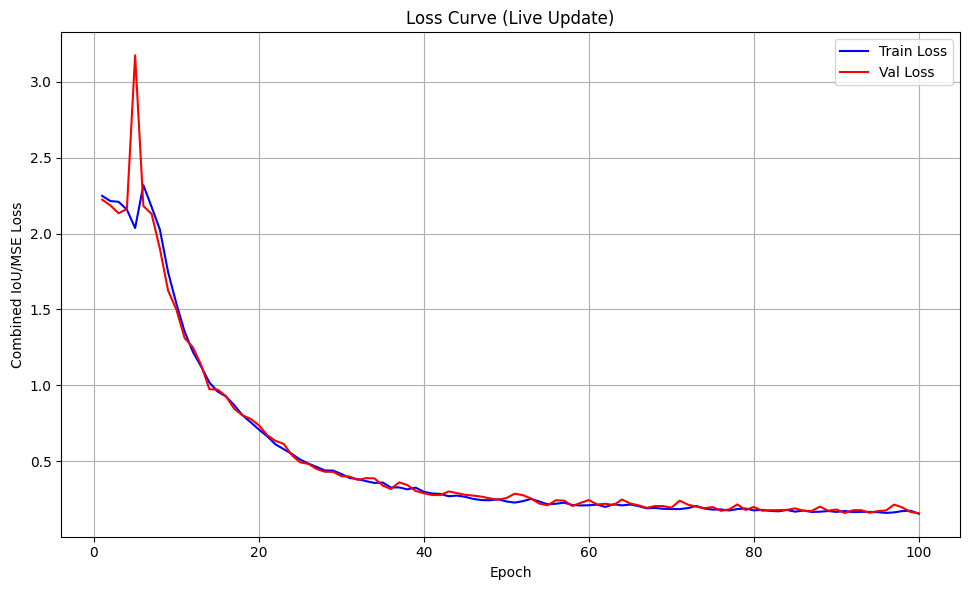

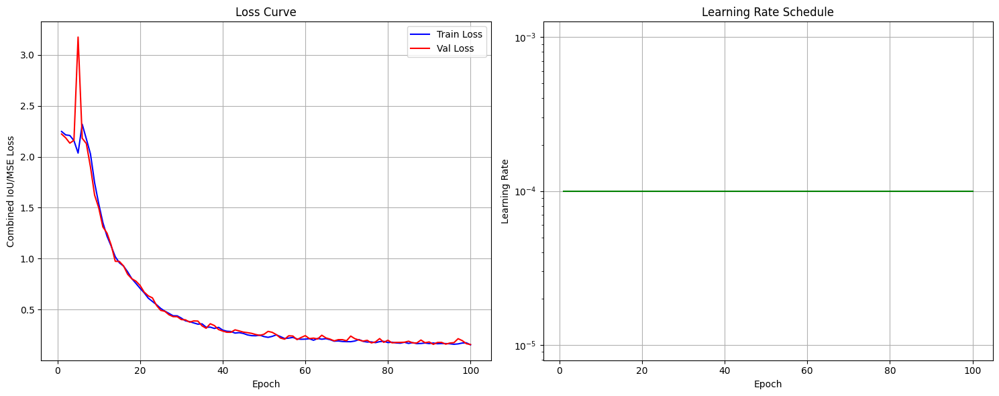

IoU > 0.7 Accuracy: 43.95%
Mean IoU: 0.6404, Median IoU: 0.6748
IoU Distribution:
  IoU > 0.5: 79.00%
  IoU > 0.6: 63.65%
  IoU > 0.7: 43.95%
  IoU > 0.8: 20.05%
  IoU > 0.9: 3.55%


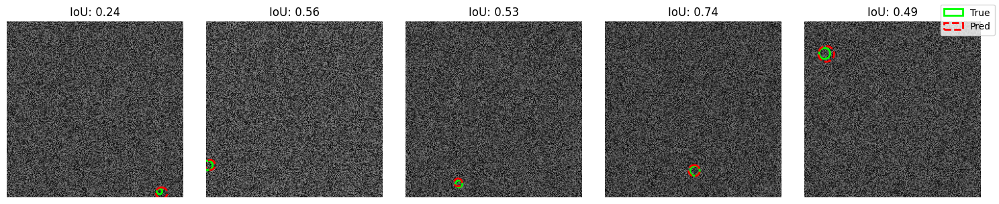

In [65]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import json
from torchvision import transforms
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from shapely.geometry import Point
#from create_dataset import generate_circle

# --------- Normalization Constants ---------
IMG_SIZE = 256
RADIUS_MIN, RADIUS_MAX = 3, 20

# --------- On-the-Fly Dataset Definition ---------
class CircleOnTheFlyDataset(Dataset):
    def __init__(self, n_samples=10000, noise_level=2):
        self.n_samples = n_samples
        self.noise_level = noise_level

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        img, label = generate_circle(noise_level=self.noise_level)
        img = np.expand_dims(img, axis=0)  # shape: (1, 256, 256)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

# --------- CNN Model Definition ---------
class CircleFinderCNN(nn.Module):
    def __init__(self):
        super(CircleFinderCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 16, kernel_size=5, stride=1, padding=2)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=5, stride=1, padding=2)
        self.fc1 = nn.Linear(64 * 32 * 32, 1024)  # First reduction to 1024
        self.fc2 = nn.Linear(1024, 128)           # Second reduction to 128
        self.fc3 = nn.Linear(128, 3)              # Final output layer
        self.sigmoid = nn.Sigmoid()  # Output in range [0, 1]

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = x.view(-1, 64 * 32 * 32)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.sigmoid(self.fc3(x))
        return x

# --------- Training Loop ---------
def train_model(model, train_loader, val_loader, device, epochs=200, lr=5e-5, patience=20):
    # Create optimizer with initial learning rate
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    # Learning rate scheduler - reduce LR when progress plateaus
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode='min',           # Minimize validation loss
        factor=0.2,           # Multiply LR by 0.2 when triggered
        patience=10,          # Wait 10 epochs of no improvement
        verbose=True,         # Print message when LR changes
        min_lr=1e-6           # Don't go below this LR
    )

    # Alternatively, use a step scheduler with predefined milestones
    # scheduler = torch.optim.lr_scheduler.MultiStepLR(
    #     optimizer,
    #     milestones=[60, 120, 160],  # Reduce LR at these epochs
    #     gamma=0.2,                  # Multiply by 0.2 at each milestone
    #     verbose=True
    # )

    def loss_function(pred, target):
        return combined_loss(pred, target, alpha=0.6)

    model.to(device)
    best_val_loss = float('inf')
    patience_counter = 0
    train_losses, val_losses = [], []

    # Set up the live plot
    plt.ion()  # Turn on interactive mode
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Combined IoU/MSE Loss')
    ax.set_title('Loss Curve (Live Update)')
    ax.grid(True)
    train_line, = ax.plot([], [], 'b-', label='Train Loss')
    val_line, = ax.plot([], [], 'r-', label='Val Loss')
    ax.legend()
    plt.tight_layout()

    # Lists to store epoch numbers and learning rates
    epochs_list = []
    lr_history = []

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for imgs, targets in train_loader:
            imgs, targets = imgs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = loss_function(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        val_loss = 0
        model.eval()
        with torch.no_grad():
            for imgs, targets in val_loader:
                imgs, targets = imgs.to(device), targets.to(device)
                outputs = model(imgs)
                loss = loss_function(outputs, targets)
                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)
        epochs_list.append(epoch + 1)

        # Update learning rate based on validation loss
        scheduler.step(val_loss)  # For ReduceLROnPlateau
        # scheduler.step()        # For MultiStepLR

        # Store current learning rate
        lr_history.append(optimizer.param_groups[0]['lr'])

        # Only print loss every 10 epochs (or for the first epoch)
        if epoch == 0 or (epoch + 1) % 10 == 0 or (epoch + 1) == epochs:
            print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, LR: {optimizer.param_groups[0]['lr']:.2e}")

        # Update the live plot
        train_line.set_data(epochs_list, train_losses)
        val_line.set_data(epochs_list, val_losses)
        ax.relim()  # Recalculate limits
        ax.autoscale_view()  # Autoscale
        fig.canvas.draw()
        fig.canvas.flush_events()

        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    # Turn off interactive mode after training
    plt.ioff()

    # Final static plot - now with two subplots
    plt.figure(figsize=(15, 6))

    # Loss plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_list, train_losses, 'b-', label='Train Loss')
    plt.plot(epochs_list, val_losses, 'r-', label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Combined IoU/MSE Loss')
    plt.title('Loss Curve')
    plt.legend()
    plt.grid(True)

    # Learning rate plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_list, lr_history, 'g-')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.title('Learning Rate Schedule')
    plt.grid(True)
    plt.yscale('log')  # Log scale for better visualization

    plt.tight_layout()
    plt.show()


# --------- Evaluation and Visualization ---------
def show_predictions(model, dataset, device, num_samples=5):
    model.eval()
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 3))
    for i, idx in enumerate(indices):
        img, true = dataset[idx]
        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device)).cpu().numpy()[0]
        # Denormalize
        true_row = true[0].item() * IMG_SIZE
        true_col = true[1].item() * IMG_SIZE
        true_rad = true[2].item() * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        pred_row = pred[0] * IMG_SIZE
        pred_col = pred[1] * IMG_SIZE
        pred_rad = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        axs[i].imshow(img.squeeze(), cmap='gray')
        axs[i].add_patch(plt.Circle((true_col, true_row), true_rad, color='lime', fill=False, linewidth=2, label='True'))
        axs[i].add_patch(plt.Circle((pred_col, pred_row), pred_rad, color='red', fill=False, linewidth=2, linestyle='--', label='Pred'))
        axs[i].set_title(f"IoU: {intersection_over_union({'row': true_row, 'col': true_col, 'radius': true_rad}, {'row': pred_row, 'col': pred_col, 'radius': pred_rad}):.2f}")
        axs[i].axis('off')
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    plt.tight_layout()
    plt.show()

def intersection_over_union(circ1_dict, circ2_dict):
    shape1 = Point(circ1_dict['row'], circ1_dict['col']).buffer(circ1_dict['radius'])
    shape2 = Point(circ2_dict['row'], circ2_dict['col']).buffer(circ2_dict['radius'])
    return shape1.intersection(shape2).area / shape1.union(shape2).area

def evaluate_model(model, dataloader, device, iou_threshold=0.7):
    model.eval()
    matches = 0
    total = 0
    all_ious = []  # Track all IoU values

    with torch.no_grad():
        for imgs, targets in dataloader:
            imgs = imgs.to(device)
            outputs = model(imgs).cpu().numpy()
            targets = targets.numpy()
            for pred, true in zip(outputs, targets):
                # Denormalize for IoU calculation
                pred_row = pred[0] * IMG_SIZE
                pred_col = pred[1] * IMG_SIZE
                pred_radius = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                true_row = true[0] * IMG_SIZE
                true_col = true[1] * IMG_SIZE
                true_radius = true[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                pred_dict = {'row': pred_row, 'col': pred_col, 'radius': pred_radius}
                true_dict = {'row': true_row, 'col': true_col, 'radius': true_radius}

                iou = intersection_over_union(pred_dict, true_dict)
                all_ious.append(iou)

                if iou > iou_threshold:
                    matches += 1
                total += 1

    # Calculate more informative metrics
    accuracy = matches / total
    mean_iou = sum(all_ious) / len(all_ious)
    median_iou = sorted(all_ious)[len(all_ious)//2]

    # Show distribution in IoU brackets
    brackets = [0.5, 0.6, 0.7, 0.8, 0.9]
    bracket_counts = [sum(1 for iou in all_ious if iou > thresh) / total for thresh in brackets]

    print(f"IoU > {iou_threshold} Accuracy: {accuracy:.2%}")
    print(f"Mean IoU: {mean_iou:.4f}, Median IoU: {median_iou:.4f}")
    print("IoU Distribution:")
    for thresh, count in zip(brackets, bracket_counts):
        print(f"  IoU > {thresh:.1f}: {count:.2%}")

    return accuracy, mean_iou, all_ious

def iou_loss(pred, target, epsilon=1e-6, target_threshold=0.7):
    """Enhanced IoU loss with threshold focus."""
    # Denormalize predictions and targets
    pred_row = pred[:, 0] * IMG_SIZE
    pred_col = pred[:, 1] * IMG_SIZE
    pred_radius = pred[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    target_row = target[:, 0] * IMG_SIZE
    target_col = target[:, 1] * IMG_SIZE
    target_radius = target[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    # Distance between centers
    center_dist = torch.sqrt((pred_row - target_row)**2 + (pred_col - target_col)**2)

    # Sum of radii
    radii_sum = pred_radius + target_radius

    # Base IoU component calculation
    dist_loss = center_dist / (radii_sum + epsilon)
    radius_loss = torch.abs(pred_radius - target_radius) / (radii_sum + epsilon)
    base_iou_loss = dist_loss + radius_loss

    # Estimated IoU - approximate conversion from our distance metrics
    # This is a rough approximation to help with scaling
    est_iou = 1.0 - torch.clamp(base_iou_loss, 0.0, 1.0)

    # Apply increased penalty for predictions near but below threshold
    # This creates a "soft hinge" that pushes predictions to exceed the threshold
    threshold_penalty = torch.where(
        (est_iou < target_threshold) & (est_iou > target_threshold - 0.2),
        1.5 * (target_threshold - est_iou),  # 1.5x penalty in the critical region
        torch.zeros_like(est_iou)
    )

    # Combined loss with threshold incentive
    return base_iou_loss.mean() + threshold_penalty.mean()

def combined_loss(pred, target, alpha=0.6):
    """Combined MSE and enhanced IoU loss."""
    mse_component = F.mse_loss(pred, target)
    iou_component = iou_loss(pred, target, target_threshold=0.7)

    # Slightly higher alpha - focus more on IoU now that training is stable
    return alpha * iou_component + (1-alpha) * mse_component

# --------- Example Usage ---------
if __name__ == '__main__':
    train_dataset = CircleOnTheFlyDataset(n_samples=10000)
    val_dataset = CircleOnTheFlyDataset(n_samples=2000)

    # train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True)
    # val_loader = DataLoader(val_dataset, batch_size=100)

    # A100-optimized DataLoaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=256,
        shuffle=True,
        num_workers=12,
        pin_memory=True,  # Important for faster CPU->GPU data transfer
        persistent_workers=True  # Keeps workers alive between iterations
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=256,
        shuffle=False,  # No need to shuffle validation data
        num_workers=12,
        pin_memory=True
    )


    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = CircleFinderCNN()
    train_model(model, train_loader, val_loader, device, epochs=100, patience=20, lr=1e-4)
    evaluate_model(model, val_loader, device)
    show_predictions(model, val_dataset, device, num_samples=5)

## dropout


/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1, Train Loss: 2.3297, Val Loss: 2.3154, LR: 1.00e-04
Epoch 10, Train Loss: 2.2411, Val Loss: 2.2383, LR: 1.00e-04
Epoch 20, Train Loss: 1.8943, Val Loss: 1.5365, LR: 1.00e-04
Epoch 30, Train Loss: 0.7337, Val Loss: 0.5884, LR: 1.00e-04
Epoch 40, Train Loss: 0.5924, Val Loss: 0.5086, LR: 1.00e-04
Epoch 50, Train Loss: 0.5178, Val Loss: 0.4302, LR: 1.00e-04
Epoch 60, Train Loss: 0.4898, Val Loss: 0.4573, LR: 2.00e-05
Early stopping triggered.


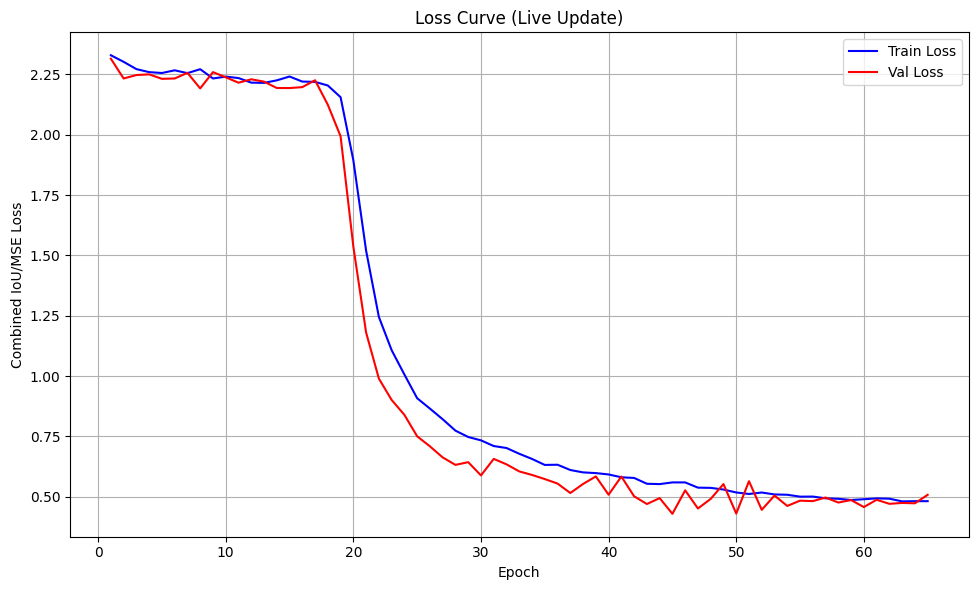

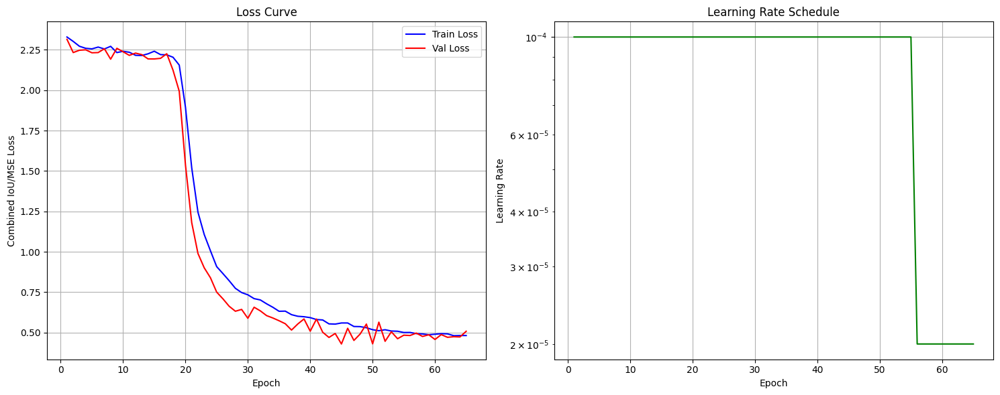

IoU > 0.7 Accuracy: 1.80%
Mean IoU: 0.2372, Median IoU: 0.2021
IoU Distribution:
  IoU > 0.5: 11.35%
  IoU > 0.6: 4.35%
  IoU > 0.7: 1.80%
  IoU > 0.8: 0.40%
  IoU > 0.9: 0.05%


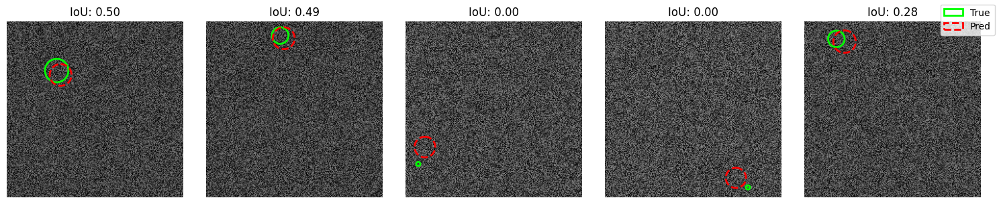

In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import json
from torchvision import transforms
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from shapely.geometry import Point
#from create_dataset import generate_circle

# --------- Normalization Constants ---------
IMG_SIZE = 256
RADIUS_MIN, RADIUS_MAX = 3, 20

# --------- On-the-Fly Dataset Definition ---------
class CircleOnTheFlyDataset(Dataset):
    def __init__(self, n_samples=10000, noise_level=2):
        self.n_samples = n_samples
        self.noise_level = noise_level

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        img, label = generate_circle(noise_level=self.noise_level)
        img = np.expand_dims(img, axis=0)  # shape: (1, 256, 256)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

# --------- CNN Model Definition with Dropout ---------
class CircleFinderCNN(nn.Module):
    def __init__(self, dropout_rate=0.3):
        super(CircleFinderCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 16, kernel_size=5, stride=1, padding=2)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=5, stride=1, padding=2)

        # Add dropout for convolutional layers (lighter dropout)
        self.dropout_conv = nn.Dropout2d(dropout_rate/2)

        # Add dropout for fully connected layers
        self.dropout_fc = nn.Dropout(dropout_rate)

        self.fc1 = nn.Linear(64 * 32 * 32, 1024)  # First reduction to 1024
        self.fc2 = nn.Linear(1024, 128)           # Second reduction to 128
        self.fc3 = nn.Linear(128, 3)              # Final output layer
        self.sigmoid = nn.Sigmoid()  # Output in range [0, 1]

    def forward(self, x):
        # Apply dropout after activations
        x = self.pool(F.relu(self.conv1(x)))
        x = self.dropout_conv(x)

        x = self.pool(F.relu(self.conv2(x)))
        x = self.dropout_conv(x)

        x = self.pool(F.relu(self.conv3(x)))
        x = self.dropout_conv(x)

        x = x.view(-1, 64 * 32 * 32)

        x = F.relu(self.fc1(x))
        x = self.dropout_fc(x)

        x = F.relu(self.fc2(x))
        x = self.dropout_fc(x)

        x = self.sigmoid(self.fc3(x))
        return x

# --------- Training Loop ---------
def train_model(model, train_loader, val_loader, device, epochs=200, lr=5e-5, patience=20):
    # Create optimizer with initial learning rate
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    # Learning rate scheduler - reduce LR when progress plateaus
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode='min',           # Minimize validation loss
        factor=0.2,           # Multiply LR by 0.2 when triggered
        patience=10,          # Wait 10 epochs of no improvement
        verbose=True,         # Print message when LR changes
        min_lr=1e-6           # Don't go below this LR
    )

    # Alternatively, use a step scheduler with predefined milestones
    # scheduler = torch.optim.lr_scheduler.MultiStepLR(
    #     optimizer,
    #     milestones=[60, 120, 160],  # Reduce LR at these epochs
    #     gamma=0.2,                  # Multiply by 0.2 at each milestone
    #     verbose=True
    # )

    def loss_function(pred, target):
        return combined_loss(pred, target, alpha=0.6)

    model.to(device)
    best_val_loss = float('inf')
    patience_counter = 0
    train_losses, val_losses = [], []

    # Set up the live plot
    plt.ion()  # Turn on interactive mode
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Combined IoU/MSE Loss')
    ax.set_title('Loss Curve (Live Update)')
    ax.grid(True)
    train_line, = ax.plot([], [], 'b-', label='Train Loss')
    val_line, = ax.plot([], [], 'r-', label='Val Loss')
    ax.legend()
    plt.tight_layout()

    # Lists to store epoch numbers and learning rates
    epochs_list = []
    lr_history = []

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for imgs, targets in train_loader:
            imgs, targets = imgs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = loss_function(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        val_loss = 0
        model.eval()
        with torch.no_grad():
            for imgs, targets in val_loader:
                imgs, targets = imgs.to(device), targets.to(device)
                outputs = model(imgs)
                loss = loss_function(outputs, targets)
                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)
        epochs_list.append(epoch + 1)

        # Update learning rate based on validation loss
        scheduler.step(val_loss)  # For ReduceLROnPlateau
        # scheduler.step()        # For MultiStepLR

        # Store current learning rate
        lr_history.append(optimizer.param_groups[0]['lr'])

        # Only print loss every 10 epochs (or for the first epoch)
        if epoch == 0 or (epoch + 1) % 10 == 0 or (epoch + 1) == epochs:
            print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, LR: {optimizer.param_groups[0]['lr']:.2e}")

        # Update the live plot
        train_line.set_data(epochs_list, train_losses)
        val_line.set_data(epochs_list, val_losses)
        ax.relim()  # Recalculate limits
        ax.autoscale_view()  # Autoscale
        fig.canvas.draw()
        fig.canvas.flush_events()

        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    # Turn off interactive mode after training
    plt.ioff()

    # Final static plot - now with two subplots
    plt.figure(figsize=(15, 6))

    # Loss plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_list, train_losses, 'b-', label='Train Loss')
    plt.plot(epochs_list, val_losses, 'r-', label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Combined IoU/MSE Loss')
    plt.title('Loss Curve')
    plt.legend()
    plt.grid(True)

    # Learning rate plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_list, lr_history, 'g-')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.title('Learning Rate Schedule')
    plt.grid(True)
    plt.yscale('log')  # Log scale for better visualization

    plt.tight_layout()
    plt.show()


# --------- Evaluation and Visualization ---------
def show_predictions(model, dataset, device, num_samples=5):
    model.eval()
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 3))
    for i, idx in enumerate(indices):
        img, true = dataset[idx]
        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device)).cpu().numpy()[0]
        # Denormalize
        true_row = true[0].item() * IMG_SIZE
        true_col = true[1].item() * IMG_SIZE
        true_rad = true[2].item() * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        pred_row = pred[0] * IMG_SIZE
        pred_col = pred[1] * IMG_SIZE
        pred_rad = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        axs[i].imshow(img.squeeze(), cmap='gray')
        axs[i].add_patch(plt.Circle((true_col, true_row), true_rad, color='lime', fill=False, linewidth=2, label='True'))
        axs[i].add_patch(plt.Circle((pred_col, pred_row), pred_rad, color='red', fill=False, linewidth=2, linestyle='--', label='Pred'))
        axs[i].set_title(f"IoU: {intersection_over_union({'row': true_row, 'col': true_col, 'radius': true_rad}, {'row': pred_row, 'col': pred_col, 'radius': pred_rad}):.2f}")
        axs[i].axis('off')
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    plt.tight_layout()
    plt.show()

def intersection_over_union(circ1_dict, circ2_dict):
    shape1 = Point(circ1_dict['row'], circ1_dict['col']).buffer(circ1_dict['radius'])
    shape2 = Point(circ2_dict['row'], circ2_dict['col']).buffer(circ2_dict['radius'])
    return shape1.intersection(shape2).area / shape1.union(shape2).area

def evaluate_model(model, dataloader, device, iou_threshold=0.7):
    model.eval()
    matches = 0
    total = 0
    all_ious = []  # Track all IoU values

    with torch.no_grad():
        for imgs, targets in dataloader:
            imgs = imgs.to(device)
            outputs = model(imgs).cpu().numpy()
            targets = targets.numpy()
            for pred, true in zip(outputs, targets):
                # Denormalize for IoU calculation
                pred_row = pred[0] * IMG_SIZE
                pred_col = pred[1] * IMG_SIZE
                pred_radius = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                true_row = true[0] * IMG_SIZE
                true_col = true[1] * IMG_SIZE
                true_radius = true[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                pred_dict = {'row': pred_row, 'col': pred_col, 'radius': pred_radius}
                true_dict = {'row': true_row, 'col': true_col, 'radius': true_radius}

                iou = intersection_over_union(pred_dict, true_dict)
                all_ious.append(iou)

                if iou > iou_threshold:
                    matches += 1
                total += 1

    # Calculate more informative metrics
    accuracy = matches / total
    mean_iou = sum(all_ious) / len(all_ious)
    median_iou = sorted(all_ious)[len(all_ious)//2]

    # Show distribution in IoU brackets
    brackets = [0.5, 0.6, 0.7, 0.8, 0.9]
    bracket_counts = [sum(1 for iou in all_ious if iou > thresh) / total for thresh in brackets]

    print(f"IoU > {iou_threshold} Accuracy: {accuracy:.2%}")
    print(f"Mean IoU: {mean_iou:.4f}, Median IoU: {median_iou:.4f}")
    print("IoU Distribution:")
    for thresh, count in zip(brackets, bracket_counts):
        print(f"  IoU > {thresh:.1f}: {count:.2%}")

    return accuracy, mean_iou, all_ious

def iou_loss(pred, target, epsilon=1e-6, target_threshold=0.7):
    """Enhanced IoU loss with threshold focus."""
    # Denormalize predictions and targets
    pred_row = pred[:, 0] * IMG_SIZE
    pred_col = pred[:, 1] * IMG_SIZE
    pred_radius = pred[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    target_row = target[:, 0] * IMG_SIZE
    target_col = target[:, 1] * IMG_SIZE
    target_radius = target[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    # Distance between centers
    center_dist = torch.sqrt((pred_row - target_row)**2 + (pred_col - target_col)**2)

    # Sum of radii
    radii_sum = pred_radius + target_radius

    # Base IoU component calculation
    dist_loss = center_dist / (radii_sum + epsilon)
    radius_loss = torch.abs(pred_radius - target_radius) / (radii_sum + epsilon)
    base_iou_loss = dist_loss + radius_loss

    # Estimated IoU - approximate conversion from our distance metrics
    # This is a rough approximation to help with scaling
    est_iou = 1.0 - torch.clamp(base_iou_loss, 0.0, 1.0)

    # Apply increased penalty for predictions near but below threshold
    # This creates a "soft hinge" that pushes predictions to exceed the threshold
    threshold_penalty = torch.where(
        (est_iou < target_threshold) & (est_iou > target_threshold - 0.2),
        1.5 * (target_threshold - est_iou),  # 1.5x penalty in the critical region
        torch.zeros_like(est_iou)
    )

    # Combined loss with threshold incentive
    return base_iou_loss.mean() + threshold_penalty.mean()

def combined_loss(pred, target, alpha=0.6):
    """Combined MSE and enhanced IoU loss."""
    mse_component = F.mse_loss(pred, target)
    iou_component = iou_loss(pred, target, target_threshold=0.7)

    # Slightly higher alpha - focus more on IoU now that training is stable
    return alpha * iou_component + (1-alpha) * mse_component

# --------- Example Usage ---------
if __name__ == '__main__':
    train_dataset = CircleOnTheFlyDataset(n_samples=10000)
    val_dataset = CircleOnTheFlyDataset(n_samples=2000)

    # train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True)
    # val_loader = DataLoader(val_dataset, batch_size=100)

    # A100-optimized DataLoaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=256,
        shuffle=True,
        num_workers=4,
        pin_memory=True,  # Important for faster CPU->GPU data transfer
      #  persistent_workers=True  # Keeps workers alive between iterations
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=256,
        shuffle=False,  # No need to shuffle validation data
        num_workers=4,
        pin_memory=True
    )


    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = CircleFinderCNN()
    train_model(model, train_loader, val_loader, device, epochs=200, patience=25, lr=5e-5)
    evaluate_model(model, val_loader, device)
    show_predictions(model, val_dataset, device, num_samples=5)

    # Or with custom dropout rate
    model = CircleFinderCNN(dropout_rate=0.5)  # Higher dropout for more regularization

## Batch Norm

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1, Train Loss: 2.8039, Val Loss: 2.8532, LR: 1.00e-04
Epoch 10, Train Loss: 1.0662, Val Loss: 0.7836, LR: 1.00e-04
Epoch 20, Train Loss: 0.7084, Val Loss: 0.4607, LR: 1.00e-04
Epoch 30, Train Loss: 0.6233, Val Loss: 0.4125, LR: 1.00e-04
Epoch 40, Train Loss: 0.5788, Val Loss: 0.3756, LR: 1.00e-04
Epoch 50, Train Loss: 0.5461, Val Loss: 0.3616, LR: 1.00e-04
Epoch 60, Train Loss: 0.5059, Val Loss: 0.3245, LR: 1.00e-04
Epoch 70, Train Loss: 0.4846, Val Loss: 0.3127, LR: 1.00e-04
Epoch 80, Train Loss: 0.4627, Val Loss: 0.3099, LR: 1.00e-04
Epoch 90, Train Loss: 0.4481, Val Loss: 0.2992, LR: 1.00e-04
Epoch 100, Train Loss: 0.4424, Val Loss: 0.2917, LR: 2.00e-05


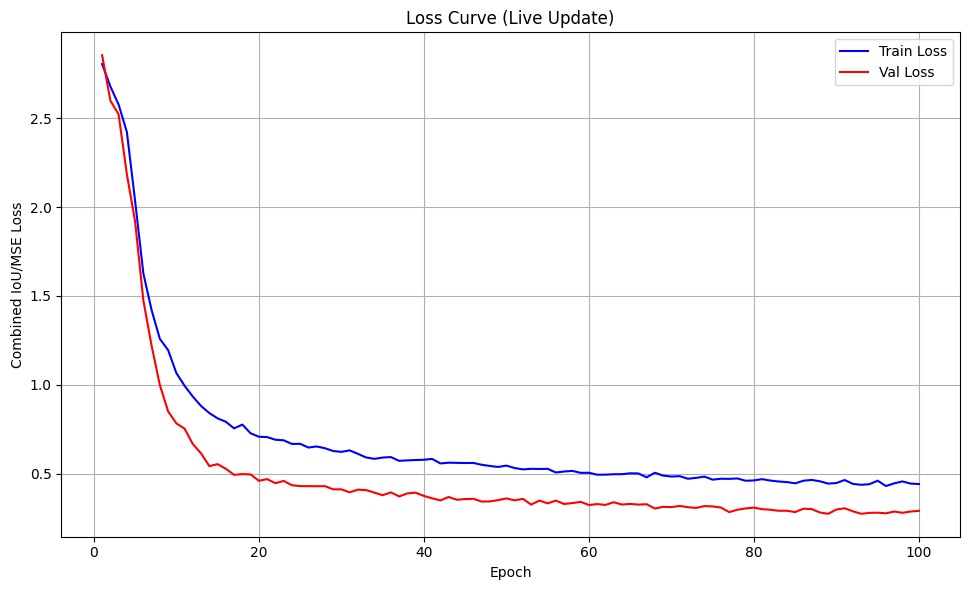

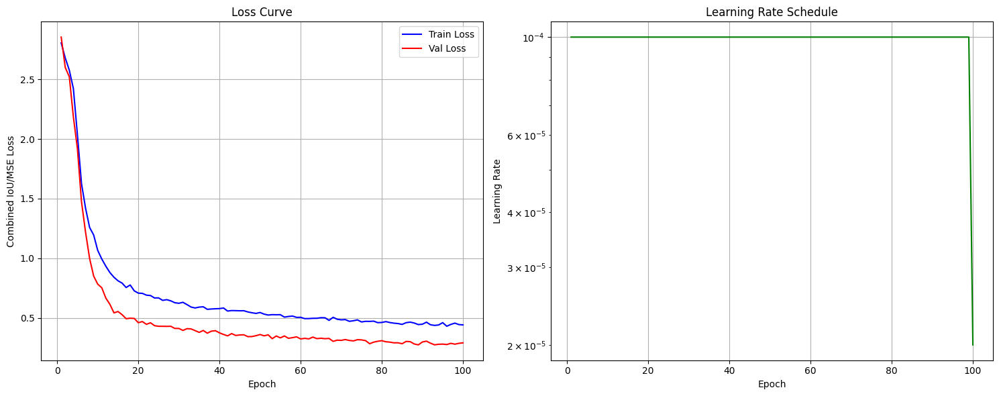

IoU > 0.7 Accuracy: 19.60%
Mean IoU: 0.4458, Median IoU: 0.4603
IoU Distribution:
  IoU > 0.5: 46.10%
  IoU > 0.6: 33.75%
  IoU > 0.7: 19.60%
  IoU > 0.8: 7.10%
  IoU > 0.9: 0.65%


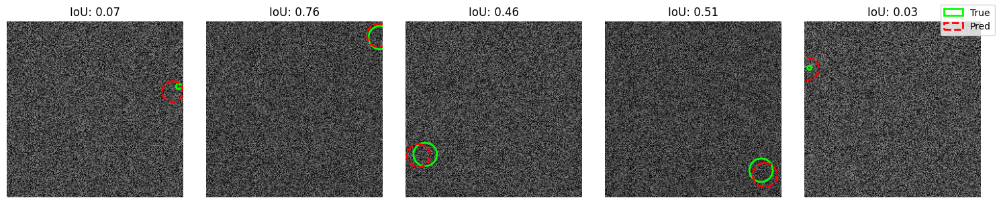

In [7]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import json
from torchvision import transforms
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from shapely.geometry import Point
#from create_dataset import generate_circle

# --------- Normalization Constants ---------
IMG_SIZE = 256
RADIUS_MIN, RADIUS_MAX = 3, 20

# --------- On-the-Fly Dataset Definition ---------
class CircleOnTheFlyDataset(Dataset):
    def __init__(self, n_samples=10000, noise_level=2):
        self.n_samples = n_samples
        self.noise_level = noise_level

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        img, label = generate_circle(noise_level=self.noise_level)
        img = np.expand_dims(img, axis=0)  # shape: (1, 256, 256)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

# --------- CNN Model Definition with Dropout ---------
class CircleFinderCNN(nn.Module):
    def __init__(self, dropout_rate=0.3):
        super(CircleFinderCNN, self).__init__()
        # First convolutional block
        self.conv1 = nn.Conv2d(1, 16, kernel_size=5, stride=1, padding=2)
        self.bn1 = nn.BatchNorm2d(16)  # BatchNorm after conv1
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Second convolutional block
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.bn2 = nn.BatchNorm2d(32)  # BatchNorm after conv2

        # Third convolutional block
        self.conv3 = nn.Conv2d(32, 64, kernel_size=5, stride=1, padding=2)
        self.bn3 = nn.BatchNorm2d(64)  # BatchNorm after conv3

        # Dropout layers
        self.dropout_conv = nn.Dropout2d(dropout_rate/2)
        self.dropout_fc = nn.Dropout(dropout_rate)

        # Fully connected layers
        self.fc1 = nn.Linear(64 * 32 * 32, 1024)
        self.bn_fc1 = nn.BatchNorm1d(1024)  # BatchNorm after fc1

        self.fc2 = nn.Linear(1024, 128)
        self.bn_fc2 = nn.BatchNorm1d(128)  # BatchNorm after fc2

        self.fc3 = nn.Linear(128, 3)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # First conv block with BN
        x = self.conv1(x)
        x = self.bn1(x)
        x = F.relu(x)
        x = self.pool(x)
        x = self.dropout_conv(x)

        # Second conv block with BN
        x = self.conv2(x)
        x = self.bn2(x)
        x = F.relu(x)
        x = self.pool(x)
        x = self.dropout_conv(x)

        # Third conv block with BN
        x = self.conv3(x)
        x = self.bn3(x)
        x = F.relu(x)
        x = self.pool(x)
        x = self.dropout_conv(x)

        # Flatten for fully connected layers
        x = x.view(-1, 64 * 32 * 32)

        # First FC block with BN
        x = self.fc1(x)
        x = self.bn_fc1(x)
        x = F.relu(x)
        x = self.dropout_fc(x)

        # Second FC block with BN
        x = self.fc2(x)
        x = self.bn_fc2(x)
        x = F.relu(x)
        x = self.dropout_fc(x)

        # Output layer
        x = self.sigmoid(self.fc3(x))
        return x

# --------- Training Loop ---------
def train_model(model, train_loader, val_loader, device, epochs=200, lr=1e-4, patience=20):
    # Create optimizer with initial learning rate
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    # Learning rate scheduler - reduce LR when progress plateaus
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode='min',           # Minimize validation loss
        factor=0.2,           # Multiply LR by 0.2 when triggered
        patience=10,          # Wait 10 epochs of no improvement
        verbose=True,         # Print message when LR changes
        min_lr=1e-6           # Don't go below this LR
    )

    # Alternatively, use a step scheduler with predefined milestones
    # scheduler = torch.optim.lr_scheduler.MultiStepLR(
    #     optimizer,
    #     milestones=[60, 120, 160],  # Reduce LR at these epochs
    #     gamma=0.2,                  # Multiply by 0.2 at each milestone
    #     verbose=True
    # )

    def loss_function(pred, target):
        return combined_loss(pred, target, alpha=0.6)

    model.to(device)
    best_val_loss = float('inf')
    patience_counter = 0
    train_losses, val_losses = [], []

    # Set up the live plot
    plt.ion()  # Turn on interactive mode
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Combined IoU/MSE Loss')
    ax.set_title('Loss Curve (Live Update)')
    ax.grid(True)
    train_line, = ax.plot([], [], 'b-', label='Train Loss')
    val_line, = ax.plot([], [], 'r-', label='Val Loss')
    ax.legend()
    plt.tight_layout()

    # Lists to store epoch numbers and learning rates
    epochs_list = []
    lr_history = []

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for imgs, targets in train_loader:
            imgs, targets = imgs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = loss_function(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        val_loss = 0
        model.eval()
        with torch.no_grad():
            for imgs, targets in val_loader:
                imgs, targets = imgs.to(device), targets.to(device)
                outputs = model(imgs)
                loss = loss_function(outputs, targets)
                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)
        epochs_list.append(epoch + 1)

        # Update learning rate based on validation loss
        scheduler.step(val_loss)  # For ReduceLROnPlateau
        # scheduler.step()        # For MultiStepLR

        # Store current learning rate
        lr_history.append(optimizer.param_groups[0]['lr'])

        # Only print loss every 10 epochs (or for the first epoch)
        if epoch == 0 or (epoch + 1) % 10 == 0 or (epoch + 1) == epochs:
            print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, LR: {optimizer.param_groups[0]['lr']:.2e}")

        # Update the live plot
        train_line.set_data(epochs_list, train_losses)
        val_line.set_data(epochs_list, val_losses)
        ax.relim()  # Recalculate limits
        ax.autoscale_view()  # Autoscale
        fig.canvas.draw()
        fig.canvas.flush_events()

        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    # Turn off interactive mode after training
    plt.ioff()

    # Final static plot - now with two subplots
    plt.figure(figsize=(15, 6))

    # Loss plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_list, train_losses, 'b-', label='Train Loss')
    plt.plot(epochs_list, val_losses, 'r-', label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Combined IoU/MSE Loss')
    plt.title('Loss Curve')
    plt.legend()
    plt.grid(True)

    # Learning rate plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_list, lr_history, 'g-')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.title('Learning Rate Schedule')
    plt.grid(True)
    plt.yscale('log')  # Log scale for better visualization

    plt.tight_layout()
    plt.show()


# --------- Evaluation and Visualization ---------
def show_predictions(model, dataset, device, num_samples=5):
    model.eval()
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 3))
    for i, idx in enumerate(indices):
        img, true = dataset[idx]
        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device)).cpu().numpy()[0]
        # Denormalize
        true_row = true[0].item() * IMG_SIZE
        true_col = true[1].item() * IMG_SIZE
        true_rad = true[2].item() * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        pred_row = pred[0] * IMG_SIZE
        pred_col = pred[1] * IMG_SIZE
        pred_rad = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        axs[i].imshow(img.squeeze(), cmap='gray')
        axs[i].add_patch(plt.Circle((true_col, true_row), true_rad, color='lime', fill=False, linewidth=2, label='True'))
        axs[i].add_patch(plt.Circle((pred_col, pred_row), pred_rad, color='red', fill=False, linewidth=2, linestyle='--', label='Pred'))
        axs[i].set_title(f"IoU: {intersection_over_union({'row': true_row, 'col': true_col, 'radius': true_rad}, {'row': pred_row, 'col': pred_col, 'radius': pred_rad}):.2f}")
        axs[i].axis('off')
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    plt.tight_layout()
    plt.show()

def intersection_over_union(circ1_dict, circ2_dict):
    shape1 = Point(circ1_dict['row'], circ1_dict['col']).buffer(circ1_dict['radius'])
    shape2 = Point(circ2_dict['row'], circ2_dict['col']).buffer(circ2_dict['radius'])
    return shape1.intersection(shape2).area / shape1.union(shape2).area

def evaluate_model(model, dataloader, device, iou_threshold=0.7):
    model.eval()
    matches = 0
    total = 0
    all_ious = []  # Track all IoU values

    with torch.no_grad():
        for imgs, targets in dataloader:
            imgs = imgs.to(device)
            outputs = model(imgs).cpu().numpy()
            targets = targets.numpy()
            for pred, true in zip(outputs, targets):
                # Denormalize for IoU calculation
                pred_row = pred[0] * IMG_SIZE
                pred_col = pred[1] * IMG_SIZE
                pred_radius = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                true_row = true[0] * IMG_SIZE
                true_col = true[1] * IMG_SIZE
                true_radius = true[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                pred_dict = {'row': pred_row, 'col': pred_col, 'radius': pred_radius}
                true_dict = {'row': true_row, 'col': true_col, 'radius': true_radius}

                iou = intersection_over_union(pred_dict, true_dict)
                all_ious.append(iou)

                if iou > iou_threshold:
                    matches += 1
                total += 1

    # Calculate more informative metrics
    accuracy = matches / total
    mean_iou = sum(all_ious) / len(all_ious)
    median_iou = sorted(all_ious)[len(all_ious)//2]

    # Show distribution in IoU brackets
    brackets = [0.5, 0.6, 0.7, 0.8, 0.9]
    bracket_counts = [sum(1 for iou in all_ious if iou > thresh) / total for thresh in brackets]

    print(f"IoU > {iou_threshold} Accuracy: {accuracy:.2%}")
    print(f"Mean IoU: {mean_iou:.4f}, Median IoU: {median_iou:.4f}")
    print("IoU Distribution:")
    for thresh, count in zip(brackets, bracket_counts):
        print(f"  IoU > {thresh:.1f}: {count:.2%}")

    return accuracy, mean_iou, all_ious

def iou_loss(pred, target, epsilon=1e-6, target_threshold=0.7):
    """Enhanced IoU loss with threshold focus."""
    # Denormalize predictions and targets
    pred_row = pred[:, 0] * IMG_SIZE
    pred_col = pred[:, 1] * IMG_SIZE
    pred_radius = pred[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    target_row = target[:, 0] * IMG_SIZE
    target_col = target[:, 1] * IMG_SIZE
    target_radius = target[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    # Distance between centers
    center_dist = torch.sqrt((pred_row - target_row)**2 + (pred_col - target_col)**2)

    # Sum of radii
    radii_sum = pred_radius + target_radius

    # Base IoU component calculation
    dist_loss = center_dist / (radii_sum + epsilon)
    radius_loss = torch.abs(pred_radius - target_radius) / (radii_sum + epsilon)
    base_iou_loss = dist_loss + radius_loss

    # Estimated IoU - approximate conversion from our distance metrics
    # This is a rough approximation to help with scaling
    est_iou = 1.0 - torch.clamp(base_iou_loss, 0.0, 1.0)

    # Apply increased penalty for predictions near but below threshold
    # This creates a "soft hinge" that pushes predictions to exceed the threshold
    threshold_penalty = torch.where(
        (est_iou < target_threshold) & (est_iou > target_threshold - 0.2),
        1.5 * (target_threshold - est_iou),  # 1.5x penalty in the critical region
        torch.zeros_like(est_iou)
    )

    # Combined loss with threshold incentive
    return base_iou_loss.mean() + threshold_penalty.mean()

def combined_loss(pred, target, alpha=0.6):
    """Combined MSE and enhanced IoU loss."""
    mse_component = F.mse_loss(pred, target)
    iou_component = iou_loss(pred, target, target_threshold=0.7)

    # Slightly higher alpha - focus more on IoU now that training is stable
    return alpha * iou_component + (1-alpha) * mse_component

# --------- Example Usage ---------
if __name__ == '__main__':
    train_dataset = CircleOnTheFlyDataset(n_samples=10000)
    val_dataset = CircleOnTheFlyDataset(n_samples=2000)

    # train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True)
    # val_loader = DataLoader(val_dataset, batch_size=100)

    # A100-optimized DataLoaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=256,
        shuffle=True,
        num_workers=12,
        pin_memory=True,  # Important for faster CPU->GPU data transfer
        persistent_workers=True  # Keeps workers alive between iterations
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=256,
        shuffle=False,  # No need to shuffle validation data
        num_workers=12,
        pin_memory=True
    )


    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = CircleFinderCNN()
    train_model(model, train_loader, val_loader, device, epochs=100, patience=15, lr=1e-4)
    evaluate_model(model, val_loader, device)
    show_predictions(model, val_dataset, device, num_samples=5)

    # Or with custom dropout rate
    model = CircleFinderCNN(dropout_rate=0)  # Higher dropout for more regularization

## dropout + batch Norm

Epoch 1, Train Loss: 3.1831, Val Loss: 2.7710, LR: 5.00e-05
Epoch 10, Train Loss: 0.8602, Val Loss: 0.5803, LR: 5.00e-05
Epoch 20, Train Loss: 0.6462, Val Loss: 0.4257, LR: 5.00e-05
Epoch 30, Train Loss: 0.5690, Val Loss: 0.3726, LR: 5.00e-05
Epoch 40, Train Loss: 0.5063, Val Loss: 0.3313, LR: 5.00e-05
Epoch 50, Train Loss: 0.4801, Val Loss: 0.3081, LR: 5.00e-05
Epoch 60, Train Loss: 0.4559, Val Loss: 0.3036, LR: 5.00e-05
Epoch 70, Train Loss: 0.4342, Val Loss: 0.2881, LR: 5.00e-05
Epoch 80, Train Loss: 0.4224, Val Loss: 0.2752, LR: 5.00e-05
Epoch 90, Train Loss: 0.4098, Val Loss: 0.2653, LR: 5.00e-05
Epoch 100, Train Loss: 0.3996, Val Loss: 0.2479, LR: 5.00e-05
Epoch 110, Train Loss: 0.3912, Val Loss: 0.2357, LR: 5.00e-05
Epoch 120, Train Loss: 0.3869, Val Loss: 0.2304, LR: 5.00e-05
Epoch 130, Train Loss: 0.3824, Val Loss: 0.2349, LR: 5.00e-05
Epoch 140, Train Loss: 0.3717, Val Loss: 0.2254, LR: 5.00e-05
Epoch 150, Train Loss: 0.3664, Val Loss: 0.2147, LR: 1.00e-05
Epoch 160, Train Lo

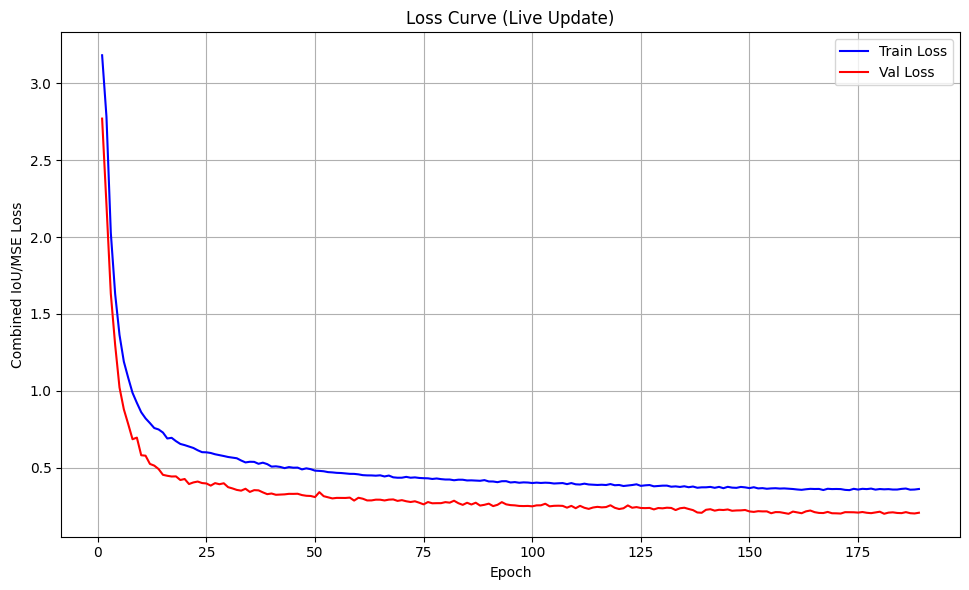

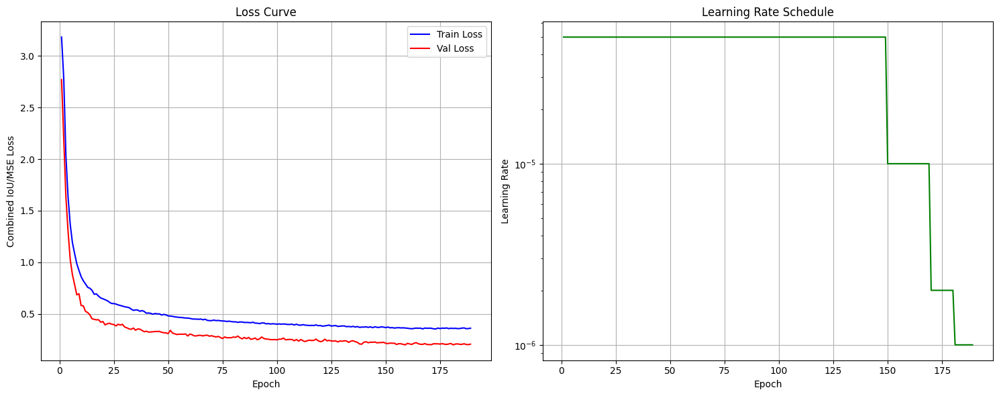

IoU > 0.7 Accuracy: 38.95%
Mean IoU: 0.5634, Median IoU: 0.6337
IoU Distribution:
  IoU > 0.5: 65.15%
  IoU > 0.6: 54.85%
  IoU > 0.7: 38.95%
  IoU > 0.8: 17.65%
  IoU > 0.9: 2.70%


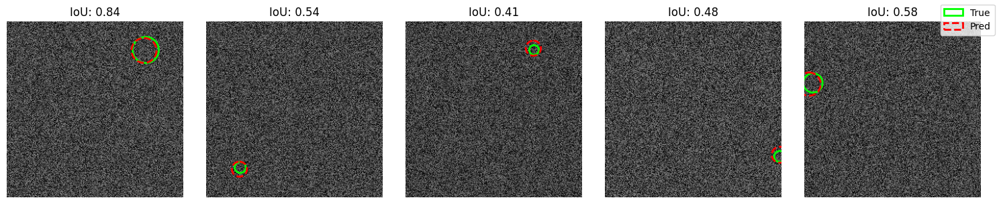

In [12]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import json
from torchvision import transforms
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from shapely.geometry import Point
#from create_dataset import generate_circle

# --------- Normalization Constants ---------
IMG_SIZE = 256
RADIUS_MIN, RADIUS_MAX = 3, 20

# --------- On-the-Fly Dataset Definition ---------
class CircleOnTheFlyDataset(Dataset):
    def __init__(self, n_samples=10000, noise_level=2):
        self.n_samples = n_samples
        self.noise_level = noise_level

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        img, label = generate_circle(noise_level=self.noise_level)
        img = np.expand_dims(img, axis=0)  # shape: (1, 256, 256)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

# --------- CNN Model Definition with Dropout ---------
class CircleFinderCNN(nn.Module):
    def __init__(self, dropout_rate=0.3):
        super(CircleFinderCNN, self).__init__()
        # First convolutional block
        self.conv1 = nn.Conv2d(1, 16, kernel_size=5, stride=1, padding=2)
        self.bn1 = nn.BatchNorm2d(16)  # BatchNorm after conv1
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Second convolutional block
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.bn2 = nn.BatchNorm2d(32)  # BatchNorm after conv2

        # Third convolutional block
        self.conv3 = nn.Conv2d(32, 64, kernel_size=5, stride=1, padding=2)
        self.bn3 = nn.BatchNorm2d(64)  # BatchNorm after conv3

        # Dropout layers
        self.dropout_conv = nn.Dropout2d(dropout_rate/2)
        self.dropout_fc = nn.Dropout(dropout_rate)

        # Fully connected layers
        self.fc1 = nn.Linear(64 * 32 * 32, 1024)
        self.bn_fc1 = nn.BatchNorm1d(1024)  # BatchNorm after fc1

        self.fc2 = nn.Linear(1024, 128)
        self.bn_fc2 = nn.BatchNorm1d(128)  # BatchNorm after fc2

        self.fc3 = nn.Linear(128, 3)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # First conv block with BN
        x = self.conv1(x)
        x = self.bn1(x)
        x = F.relu(x)
        x = self.pool(x)
        x = self.dropout_conv(x)

        # Second conv block with BN
        x = self.conv2(x)
        x = self.bn2(x)
        x = F.relu(x)
        x = self.pool(x)
        x = self.dropout_conv(x)

        # Third conv block with BN
        x = self.conv3(x)
        x = self.bn3(x)
        x = F.relu(x)
        x = self.pool(x)
        x = self.dropout_conv(x)

        # Flatten for fully connected layers
        x = x.view(-1, 64 * 32 * 32)

        # First FC block with BN
        x = self.fc1(x)
        x = self.bn_fc1(x)
        x = F.relu(x)
        x = self.dropout_fc(x)

        # Second FC block with BN
        x = self.fc2(x)
        x = self.bn_fc2(x)
        x = F.relu(x)
        x = self.dropout_fc(x)

        # Output layer
        x = self.sigmoid(self.fc3(x))
        return x

# --------- Training Loop ---------
def train_model(model, train_loader, val_loader, device, epochs=200, lr=1e-4, patience=20):
    # Create optimizer with initial learning rate
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    # Learning rate scheduler - reduce LR when progress plateaus
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode='min',           # Minimize validation loss
        factor=0.2,           # Multiply LR by 0.2 when triggered
        patience=10,          # Wait 10 epochs of no improvement
        verbose=True,         # Print message when LR changes
        min_lr=1e-6           # Don't go below this LR
    )

    # Alternatively, use a step scheduler with predefined milestones
    # scheduler = torch.optim.lr_scheduler.MultiStepLR(
    #     optimizer,
    #     milestones=[60, 120, 160],  # Reduce LR at these epochs
    #     gamma=0.2,                  # Multiply by 0.2 at each milestone
    #     verbose=True
    # )

    def loss_function(pred, target):
        return combined_loss(pred, target, alpha=0.6)

    model.to(device)
    best_val_loss = float('inf')
    patience_counter = 0
    train_losses, val_losses = [], []

    # Set up the live plot
    plt.ion()  # Turn on interactive mode
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Combined IoU/MSE Loss')
    ax.set_title('Loss Curve (Live Update)')
    ax.grid(True)
    train_line, = ax.plot([], [], 'b-', label='Train Loss')
    val_line, = ax.plot([], [], 'r-', label='Val Loss')
    ax.legend()
    plt.tight_layout()

    # Lists to store epoch numbers and learning rates
    epochs_list = []
    lr_history = []

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for imgs, targets in train_loader:
            imgs, targets = imgs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = loss_function(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        val_loss = 0
        model.eval()
        with torch.no_grad():
            for imgs, targets in val_loader:
                imgs, targets = imgs.to(device), targets.to(device)
                outputs = model(imgs)
                loss = loss_function(outputs, targets)
                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)
        epochs_list.append(epoch + 1)

        # Update learning rate based on validation loss
        scheduler.step(val_loss)  # For ReduceLROnPlateau
        # scheduler.step()        # For MultiStepLR

        # Store current learning rate
        lr_history.append(optimizer.param_groups[0]['lr'])

        # Only print loss every 10 epochs (or for the first epoch)
        if epoch == 0 or (epoch + 1) % 10 == 0 or (epoch + 1) == epochs:
            print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, LR: {optimizer.param_groups[0]['lr']:.2e}")

        # Update the live plot
        train_line.set_data(epochs_list, train_losses)
        val_line.set_data(epochs_list, val_losses)
        ax.relim()  # Recalculate limits
        ax.autoscale_view()  # Autoscale
        fig.canvas.draw()
        fig.canvas.flush_events()

        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    # Turn off interactive mode after training
    plt.ioff()

    # Final static plot - now with two subplots
    plt.figure(figsize=(15, 6))

    # Loss plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_list, train_losses, 'b-', label='Train Loss')
    plt.plot(epochs_list, val_losses, 'r-', label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Combined IoU/MSE Loss')
    plt.title('Loss Curve')
    plt.legend()
    plt.grid(True)

    # Learning rate plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_list, lr_history, 'g-')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.title('Learning Rate Schedule')
    plt.grid(True)
    plt.yscale('log')  # Log scale for better visualization

    plt.tight_layout()
    plt.show()


# --------- Evaluation and Visualization ---------
def show_predictions(model, dataset, device, num_samples=5):
    model.eval()
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 3))
    for i, idx in enumerate(indices):
        img, true = dataset[idx]
        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device)).cpu().numpy()[0]
        # Denormalize
        true_row = true[0].item() * IMG_SIZE
        true_col = true[1].item() * IMG_SIZE
        true_rad = true[2].item() * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        pred_row = pred[0] * IMG_SIZE
        pred_col = pred[1] * IMG_SIZE
        pred_rad = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        axs[i].imshow(img.squeeze(), cmap='gray')
        axs[i].add_patch(plt.Circle((true_col, true_row), true_rad, color='lime', fill=False, linewidth=2, label='True'))
        axs[i].add_patch(plt.Circle((pred_col, pred_row), pred_rad, color='red', fill=False, linewidth=2, linestyle='--', label='Pred'))
        axs[i].set_title(f"IoU: {intersection_over_union({'row': true_row, 'col': true_col, 'radius': true_rad}, {'row': pred_row, 'col': pred_col, 'radius': pred_rad}):.2f}")
        axs[i].axis('off')
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    plt.tight_layout()
    plt.show()

def intersection_over_union(circ1_dict, circ2_dict):
    shape1 = Point(circ1_dict['row'], circ1_dict['col']).buffer(circ1_dict['radius'])
    shape2 = Point(circ2_dict['row'], circ2_dict['col']).buffer(circ2_dict['radius'])
    return shape1.intersection(shape2).area / shape1.union(shape2).area

def evaluate_model(model, dataloader, device, iou_threshold=0.7):
    model.eval()
    matches = 0
    total = 0
    all_ious = []  # Track all IoU values

    with torch.no_grad():
        for imgs, targets in dataloader:
            imgs = imgs.to(device)
            outputs = model(imgs).cpu().numpy()
            targets = targets.numpy()
            for pred, true in zip(outputs, targets):
                # Denormalize for IoU calculation
                pred_row = pred[0] * IMG_SIZE
                pred_col = pred[1] * IMG_SIZE
                pred_radius = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                true_row = true[0] * IMG_SIZE
                true_col = true[1] * IMG_SIZE
                true_radius = true[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                pred_dict = {'row': pred_row, 'col': pred_col, 'radius': pred_radius}
                true_dict = {'row': true_row, 'col': true_col, 'radius': true_radius}

                iou = intersection_over_union(pred_dict, true_dict)
                all_ious.append(iou)

                if iou > iou_threshold:
                    matches += 1
                total += 1

    # Calculate more informative metrics
    accuracy = matches / total
    mean_iou = sum(all_ious) / len(all_ious)
    median_iou = sorted(all_ious)[len(all_ious)//2]

    # Show distribution in IoU brackets
    brackets = [0.5, 0.6, 0.7, 0.8, 0.9]
    bracket_counts = [sum(1 for iou in all_ious if iou > thresh) / total for thresh in brackets]

    print(f"IoU > {iou_threshold} Accuracy: {accuracy:.2%}")
    print(f"Mean IoU: {mean_iou:.4f}, Median IoU: {median_iou:.4f}")
    print("IoU Distribution:")
    for thresh, count in zip(brackets, bracket_counts):
        print(f"  IoU > {thresh:.1f}: {count:.2%}")

    return accuracy, mean_iou, all_ious

def iou_loss(pred, target, epsilon=1e-6, target_threshold=0.7):
    """Enhanced IoU loss with threshold focus."""
    # Denormalize predictions and targets
    pred_row = pred[:, 0] * IMG_SIZE
    pred_col = pred[:, 1] * IMG_SIZE
    pred_radius = pred[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    target_row = target[:, 0] * IMG_SIZE
    target_col = target[:, 1] * IMG_SIZE
    target_radius = target[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    # Distance between centers
    center_dist = torch.sqrt((pred_row - target_row)**2 + (pred_col - target_col)**2)

    # Sum of radii
    radii_sum = pred_radius + target_radius

    # Base IoU component calculation
    dist_loss = center_dist / (radii_sum + epsilon)
    radius_loss = torch.abs(pred_radius - target_radius) / (radii_sum + epsilon)
    base_iou_loss = dist_loss + radius_loss

    # Estimated IoU - approximate conversion from our distance metrics
    # This is a rough approximation to help with scaling
    est_iou = 1.0 - torch.clamp(base_iou_loss, 0.0, 1.0)

    # Apply increased penalty for predictions near but below threshold
    # This creates a "soft hinge" that pushes predictions to exceed the threshold
    threshold_penalty = torch.where(
        (est_iou < target_threshold) & (est_iou > target_threshold - 0.2),
        1.5 * (target_threshold - est_iou),  # 1.5x penalty in the critical region
        torch.zeros_like(est_iou)
    )

    # Combined loss with threshold incentive
    return base_iou_loss.mean() + threshold_penalty.mean()

def combined_loss(pred, target, alpha=0.6):
    """Combined MSE and enhanced IoU loss."""
    mse_component = F.mse_loss(pred, target)
    iou_component = iou_loss(pred, target, target_threshold=0.7)

    # Slightly higher alpha - focus more on IoU now that training is stable
    return alpha * iou_component + (1-alpha) * mse_component

# --------- Example Usage ---------
if __name__ == '__main__':
    train_dataset = CircleOnTheFlyDataset(n_samples=20000)
    val_dataset = CircleOnTheFlyDataset(n_samples=2000)

    # train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True)
    # val_loader = DataLoader(val_dataset, batch_size=100)

    # A100-optimized DataLoaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=256,
        shuffle=True,
        num_workers=4,
        pin_memory=True,  # Important for faster CPU->GPU data transfer
    #    persistent_workers=True  # Keeps workers alive between iterations
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=256,
        shuffle=False,  # No need to shuffle validation data
        num_workers=4,
        pin_memory=True
    )


    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = CircleFinderCNN()
    train_model(model, train_loader, val_loader, device, epochs=300, patience=30, lr=5e-5)
    evaluate_model(model, val_loader, device)
    show_predictions(model, val_dataset, device, num_samples=5)

    # Or with custom dropout rate
    model = CircleFinderCNN(dropout_rate=0.3)  # Higher dropout for more regularization

## dropout + Batch Norm + SGD

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1, Train Loss: 2.3472, Val Loss: 2.1936, LR: 1.00e-02
Epoch 10, Train Loss: 0.6784, Val Loss: 0.5020, LR: 1.00e-02
Epoch 20, Train Loss: 0.5800, Val Loss: 0.4750, LR: 1.00e-02
Epoch 30, Train Loss: 0.5334, Val Loss: 0.4985, LR: 1.00e-02
Epoch 40, Train Loss: 0.4819, Val Loss: 0.3330, LR: 1.00e-02
Epoch 50, Train Loss: 0.4483, Val Loss: 0.3876, LR: 1.00e-02
Epoch 60, Train Loss: 0.4607, Val Loss: 0.3845, LR: 1.00e-02
Epoch 70, Train Loss: 0.4262, Val Loss: 0.2957, LR: 1.00e-02
Epoch 80, Train Loss: 0.4101, Val Loss: 0.2560, LR: 1.00e-02
Epoch 90, Train Loss: 0.4114, Val Loss: 0.2498, LR: 1.00e-02
Epoch 100, Train Loss: 0.3807, Val Loss: 0.1930, LR: 1.00e-03
Epoch 110, Train Loss: 0.3844, Val Loss: 0.2027, LR: 1.00e-03
Epoch 120, Train Loss: 0.3945, Val Loss: 0.2010, LR: 1.00e-03
Epoch 130, Train Loss: 0.3647, Val Loss: 0.1932, LR: 1.00e-03
Epoch 140, Train Loss: 0.3658, Val Loss: 0.1851, LR: 1.00e-04
Epoch 150, Train Loss: 0.3718, Val Loss: 0.1910, LR: 1.00e-05


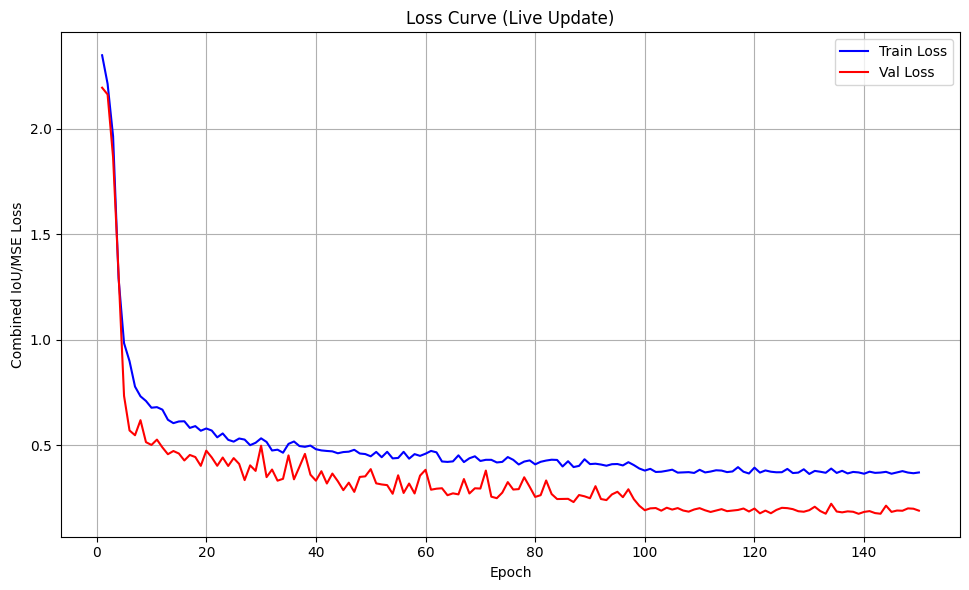

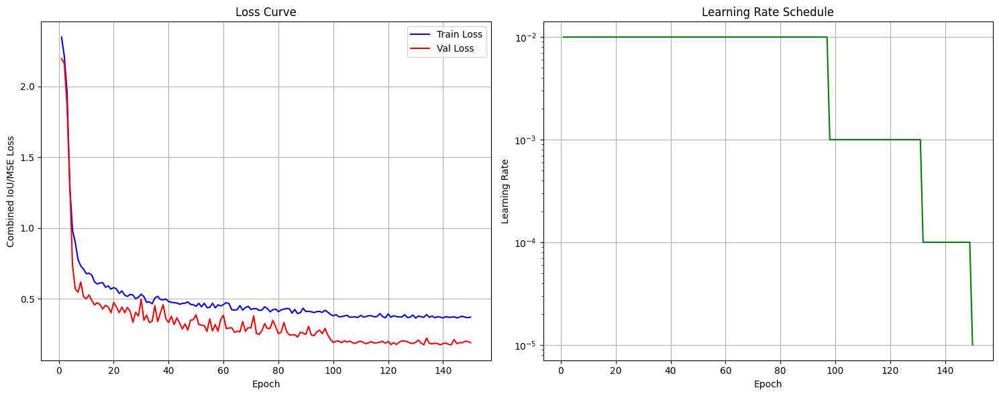

IoU > 0.7 Accuracy: 43.85%
Mean IoU: 0.5771, Median IoU: 0.6566
IoU Distribution:
  IoU > 0.5: 66.00%
  IoU > 0.6: 56.25%
  IoU > 0.7: 43.85%
  IoU > 0.8: 25.50%
  IoU > 0.9: 5.30%


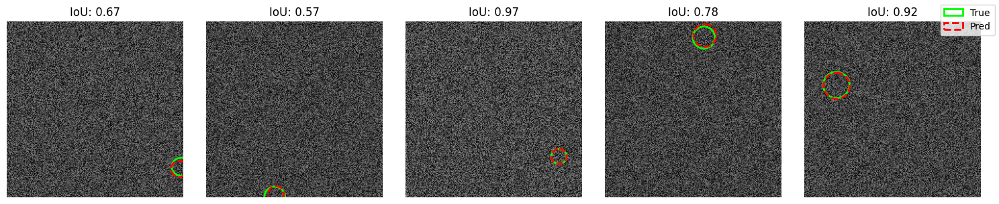

In [10]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import json
from torchvision import transforms
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from shapely.geometry import Point
#from create_dataset import generate_circle

# --------- Normalization Constants ---------
IMG_SIZE = 256
RADIUS_MIN, RADIUS_MAX = 3, 20

# --------- On-the-Fly Dataset Definition ---------
class CircleOnTheFlyDataset(Dataset):
    def __init__(self, n_samples=10000, noise_level=2):
        self.n_samples = n_samples
        self.noise_level = noise_level

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        img, label = generate_circle(noise_level=self.noise_level)
        img = np.expand_dims(img, axis=0)  # shape: (1, 256, 256)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

# --------- CNN Model Definition with Dropout ---------
class CircleFinderCNN(nn.Module):
    def __init__(self, dropout_rate=0.3):
        super(CircleFinderCNN, self).__init__()
        # First convolutional block
        self.conv1 = nn.Conv2d(1, 16, kernel_size=5, stride=1, padding=2)
        self.bn1 = nn.BatchNorm2d(16)  # BatchNorm after conv1
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Second convolutional block
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.bn2 = nn.BatchNorm2d(32)  # BatchNorm after conv2

        # Third convolutional block
        self.conv3 = nn.Conv2d(32, 64, kernel_size=5, stride=1, padding=2)
        self.bn3 = nn.BatchNorm2d(64)  # BatchNorm after conv3

        # Dropout layers
        self.dropout_conv = nn.Dropout2d(dropout_rate/2)
        self.dropout_fc = nn.Dropout(dropout_rate)

        # Fully connected layers
        self.fc1 = nn.Linear(64 * 32 * 32, 1024)
        self.bn_fc1 = nn.BatchNorm1d(1024)  # BatchNorm after fc1

        self.fc2 = nn.Linear(1024, 128)
        self.bn_fc2 = nn.BatchNorm1d(128)  # BatchNorm after fc2

        self.fc3 = nn.Linear(128, 3)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # First conv block with BN
        x = self.conv1(x)
        x = self.bn1(x)
        x = F.relu(x)
        x = self.pool(x)
        x = self.dropout_conv(x)

        # Second conv block with BN
        x = self.conv2(x)
        x = self.bn2(x)
        x = F.relu(x)
        x = self.pool(x)
        x = self.dropout_conv(x)

        # Third conv block with BN
        x = self.conv3(x)
        x = self.bn3(x)
        x = F.relu(x)
        x = self.pool(x)
        x = self.dropout_conv(x)

        # Flatten for fully connected layers
        x = x.view(-1, 64 * 32 * 32)

        # First FC block with BN
        x = self.fc1(x)
        x = self.bn_fc1(x)
        x = F.relu(x)
        x = self.dropout_fc(x)

        # Second FC block with BN
        x = self.fc2(x)
        x = self.bn_fc2(x)
        x = F.relu(x)
        x = self.dropout_fc(x)

        # Output layer
        x = self.sigmoid(self.fc3(x))
        return x

# --------- Training Loop ---------
def train_model(model, train_loader, val_loader, device, epochs=200, lr=1e-4, patience=20):
    # Create optimizer with initial learning rate
    optimizer = torch.optim.SGD(
        model.parameters(),
        lr=0.01,              # Higher initial learning rate than Adam
        momentum=0.9,         # Important for escaping local minima
        weight_decay=1e-4     # Light L2 regularization
    )

    # Learning rate scheduler - more important for SGD
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode='min',
        factor=0.1,           # Larger reduction factor than Adam
        patience=10,
        verbose=True,
        min_lr=1e-5
    )

    def loss_function(pred, target):
        return combined_loss(pred, target, alpha=0.6)

    model.to(device)
    best_val_loss = float('inf')
    patience_counter = 0
    train_losses, val_losses = [], []

    # Set up the live plot
    plt.ion()  # Turn on interactive mode
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Combined IoU/MSE Loss')
    ax.set_title('Loss Curve (Live Update)')
    ax.grid(True)
    train_line, = ax.plot([], [], 'b-', label='Train Loss')
    val_line, = ax.plot([], [], 'r-', label='Val Loss')
    ax.legend()
    plt.tight_layout()

    # Lists to store epoch numbers and learning rates
    epochs_list = []
    lr_history = []

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for imgs, targets in train_loader:
            imgs, targets = imgs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = loss_function(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        val_loss = 0
        model.eval()
        with torch.no_grad():
            for imgs, targets in val_loader:
                imgs, targets = imgs.to(device), targets.to(device)
                outputs = model(imgs)
                loss = loss_function(outputs, targets)
                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)
        epochs_list.append(epoch + 1)

        # Update learning rate based on validation loss
        scheduler.step(val_loss)  # For ReduceLROnPlateau

        # Store current learning rate
        lr_history.append(optimizer.param_groups[0]['lr'])

        # Only print loss every 10 epochs (or for the first epoch)
        if epoch == 0 or (epoch + 1) % 10 == 0 or (epoch + 1) == epochs:
            print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, LR: {optimizer.param_groups[0]['lr']:.2e}")

        # Update the live plot
        train_line.set_data(epochs_list, train_losses)
        val_line.set_data(epochs_list, val_losses)
        ax.relim()  # Recalculate limits
        ax.autoscale_view()  # Autoscale
        fig.canvas.draw()
        fig.canvas.flush_events()

        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    # Turn off interactive mode after training
    plt.ioff()

    # Final static plot - now with two subplots
    plt.figure(figsize=(15, 6))

    # Loss plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_list, train_losses, 'b-', label='Train Loss')
    plt.plot(epochs_list, val_losses, 'r-', label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Combined IoU/MSE Loss')
    plt.title('Loss Curve')
    plt.legend()
    plt.grid(True)

    # Learning rate plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_list, lr_history, 'g-')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.title('Learning Rate Schedule')
    plt.grid(True)
    plt.yscale('log')  # Log scale for better visualization

    plt.tight_layout()
    plt.show()


# --------- Evaluation and Visualization ---------
def show_predictions(model, dataset, device, num_samples=5):
    model.eval()
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 3))
    for i, idx in enumerate(indices):
        img, true = dataset[idx]
        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device)).cpu().numpy()[0]
        # Denormalize
        true_row = true[0].item() * IMG_SIZE
        true_col = true[1].item() * IMG_SIZE
        true_rad = true[2].item() * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        pred_row = pred[0] * IMG_SIZE
        pred_col = pred[1] * IMG_SIZE
        pred_rad = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        axs[i].imshow(img.squeeze(), cmap='gray')
        axs[i].add_patch(plt.Circle((true_col, true_row), true_rad, color='lime', fill=False, linewidth=2, label='True'))
        axs[i].add_patch(plt.Circle((pred_col, pred_row), pred_rad, color='red', fill=False, linewidth=2, linestyle='--', label='Pred'))
        axs[i].set_title(f"IoU: {intersection_over_union({'row': true_row, 'col': true_col, 'radius': true_rad}, {'row': pred_row, 'col': pred_col, 'radius': pred_rad}):.2f}")
        axs[i].axis('off')
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    plt.tight_layout()
    plt.show()

def intersection_over_union(circ1_dict, circ2_dict):
    shape1 = Point(circ1_dict['row'], circ1_dict['col']).buffer(circ1_dict['radius'])
    shape2 = Point(circ2_dict['row'], circ2_dict['col']).buffer(circ2_dict['radius'])
    return shape1.intersection(shape2).area / shape1.union(shape2).area

def evaluate_model(model, dataloader, device, iou_threshold=0.7):
    model.eval()
    matches = 0
    total = 0
    all_ious = []  # Track all IoU values

    with torch.no_grad():
        for imgs, targets in dataloader:
            imgs = imgs.to(device)
            outputs = model(imgs).cpu().numpy()
            targets = targets.numpy()
            for pred, true in zip(outputs, targets):
                # Denormalize for IoU calculation
                pred_row = pred[0] * IMG_SIZE
                pred_col = pred[1] * IMG_SIZE
                pred_radius = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                true_row = true[0] * IMG_SIZE
                true_col = true[1] * IMG_SIZE
                true_radius = true[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                pred_dict = {'row': pred_row, 'col': pred_col, 'radius': pred_radius}
                true_dict = {'row': true_row, 'col': true_col, 'radius': true_radius}

                iou = intersection_over_union(pred_dict, true_dict)
                all_ious.append(iou)

                if iou > iou_threshold:
                    matches += 1
                total += 1

    # Calculate more informative metrics
    accuracy = matches / total
    mean_iou = sum(all_ious) / len(all_ious)
    median_iou = sorted(all_ious)[len(all_ious)//2]

    # Show distribution in IoU brackets
    brackets = [0.5, 0.6, 0.7, 0.8, 0.9]
    bracket_counts = [sum(1 for iou in all_ious if iou > thresh) / total for thresh in brackets]

    print(f"IoU > {iou_threshold} Accuracy: {accuracy:.2%}")
    print(f"Mean IoU: {mean_iou:.4f}, Median IoU: {median_iou:.4f}")
    print("IoU Distribution:")
    for thresh, count in zip(brackets, bracket_counts):
        print(f"  IoU > {thresh:.1f}: {count:.2%}")

    return accuracy, mean_iou, all_ious

def iou_loss(pred, target, epsilon=1e-6, target_threshold=0.7):
    """Enhanced IoU loss with threshold focus."""
    # Denormalize predictions and targets
    pred_row = pred[:, 0] * IMG_SIZE
    pred_col = pred[:, 1] * IMG_SIZE
    pred_radius = pred[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    target_row = target[:, 0] * IMG_SIZE
    target_col = target[:, 1] * IMG_SIZE
    target_radius = target[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    # Distance between centers
    center_dist = torch.sqrt((pred_row - target_row)**2 + (pred_col - target_col)**2)

    # Sum of radii
    radii_sum = pred_radius + target_radius

    # Base IoU component calculation
    dist_loss = center_dist / (radii_sum + epsilon)
    radius_loss = torch.abs(pred_radius - target_radius) / (radii_sum + epsilon)
    base_iou_loss = dist_loss + radius_loss

    # Estimated IoU - approximate conversion from our distance metrics
    # This is a rough approximation to help with scaling
    est_iou = 1.0 - torch.clamp(base_iou_loss, 0.0, 1.0)

    # Apply increased penalty for predictions near but below threshold
    # This creates a "soft hinge" that pushes predictions to exceed the threshold
    threshold_penalty = torch.where(
        (est_iou < target_threshold) & (est_iou > target_threshold - 0.2),
        1.5 * (target_threshold - est_iou),  # 1.5x penalty in the critical region
        torch.zeros_like(est_iou)
    )

    # Combined loss with threshold incentive
    return base_iou_loss.mean() + threshold_penalty.mean()

def combined_loss(pred, target, alpha=0.6):
    """Combined MSE and enhanced IoU loss."""
    mse_component = F.mse_loss(pred, target)
    iou_component = iou_loss(pred, target, target_threshold=0.7)

    # Slightly higher alpha - focus more on IoU now that training is stable
    return alpha * iou_component + (1-alpha) * mse_component

# --------- Example Usage ---------
if __name__ == '__main__':
    train_dataset = CircleOnTheFlyDataset(n_samples=10000)
    val_dataset = CircleOnTheFlyDataset(n_samples=2000)

    # train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True)
    # val_loader = DataLoader(val_dataset, batch_size=100)

    # A100-optimized DataLoaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=256,
        shuffle=True,
        num_workers=4,
        pin_memory=True,  # Important for faster CPU->GPU data transfer
    #    persistent_workers=True  # Keeps workers alive between iterations
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=256,
        shuffle=False,  # No need to shuffle validation data
        num_workers=4,
        pin_memory=True
    )


    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = CircleFinderCNN()
    train_model(model, train_loader, val_loader, device, epochs=150, patience=25, lr=0.01)
    evaluate_model(model, val_loader, device)
    show_predictions(model, val_dataset, device, num_samples=5)

    # Or with custom dropout rate
    model = CircleFinderCNN(dropout_rate=0.3)  # Higher dropout for more regularization

## base CNN + SGD

Epoch 1, Train Loss: 2.4825, Val Loss: 2.3144, LR: 1.00e-02
Epoch 10, Train Loss: 2.2330, Val Loss: 2.2428, LR: 1.00e-02
Epoch 20, Train Loss: 2.2210, Val Loss: 2.2149, LR: 1.00e-03
Epoch 30, Train Loss: 2.2058, Val Loss: 2.2151, LR: 1.00e-03
Epoch 40, Train Loss: 2.2038, Val Loss: 2.1650, LR: 1.00e-04
Epoch 50, Train Loss: 2.2307, Val Loss: 2.2151, LR: 1.00e-05
Early stopping triggered.


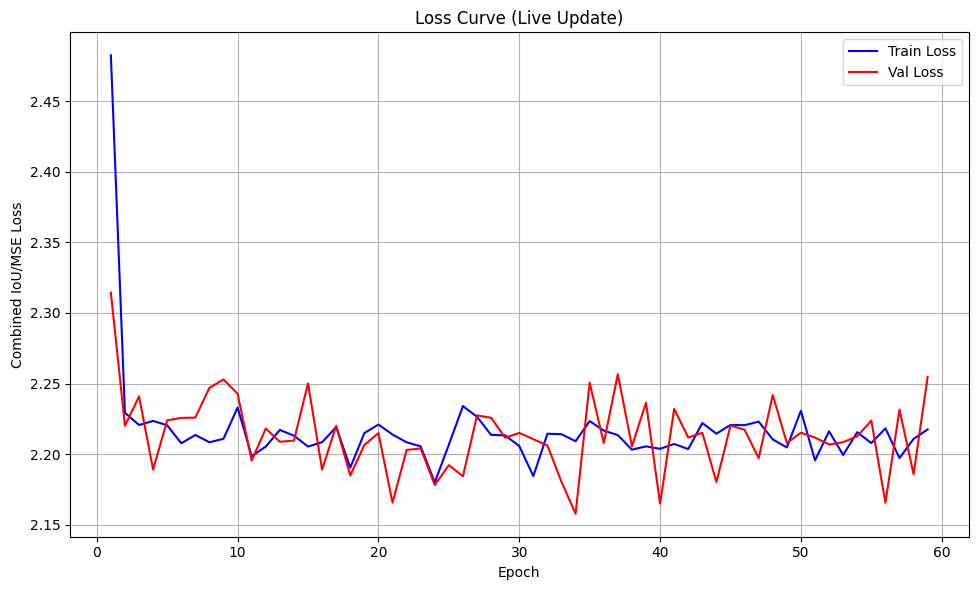

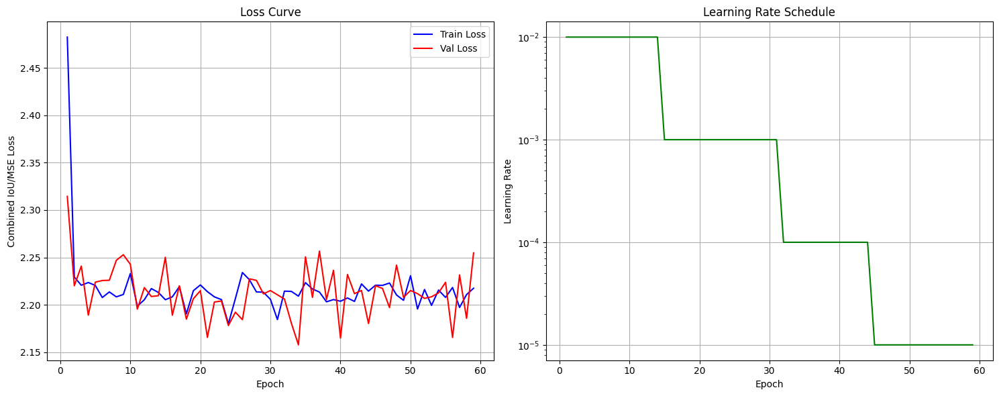

IoU > 0.7 Accuracy: 0.05%
Mean IoU: 0.0053, Median IoU: 0.0000
IoU Distribution:
  IoU > 0.5: 0.10%
  IoU > 0.6: 0.10%
  IoU > 0.7: 0.05%
  IoU > 0.8: 0.00%
  IoU > 0.9: 0.00%


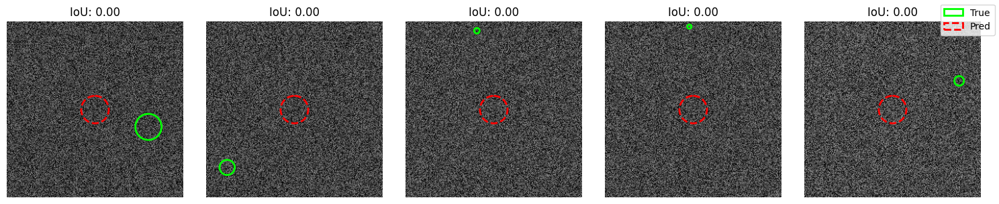

In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import json
from torchvision import transforms
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from shapely.geometry import Point
#from create_dataset import generate_circle

# --------- Normalization Constants ---------
IMG_SIZE = 256
RADIUS_MIN, RADIUS_MAX = 3, 20

# --------- On-the-Fly Dataset Definition ---------
class CircleOnTheFlyDataset(Dataset):
    def __init__(self, n_samples=10000, noise_level=2):
        self.n_samples = n_samples
        self.noise_level = noise_level

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        img, label = generate_circle(noise_level=self.noise_level)
        img = np.expand_dims(img, axis=0)  # shape: (1, 256, 256)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

# --------- CNN Model Definition with Dropout ---------
class CircleFinderCNN(nn.Module):
    def __init__(self, dropout_rate=0):  # Keep parameter but set default to 0
        super(CircleFinderCNN, self).__init__()
        # Convolutional layers (without batch norm)
        self.conv1 = nn.Conv2d(1, 16, kernel_size=5, stride=1, padding=2)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=5, stride=1, padding=2)

        # Fully connected layers (without batch norm)
        self.fc1 = nn.Linear(64 * 32 * 32, 1024)
        self.fc2 = nn.Linear(1024, 128)
        self.fc3 = nn.Linear(128, 3)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # First conv block (without BN and dropout)
        x = self.pool(F.relu(self.conv1(x)))

        # Second conv block (without BN and dropout)
        x = self.pool(F.relu(self.conv2(x)))

        # Third conv block (without BN and dropout)
        x = self.pool(F.relu(self.conv3(x)))

        # Flatten for fully connected layers
        x = x.view(-1, 64 * 32 * 32)

        # FC layers (without BN and dropout)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.sigmoid(self.fc3(x))
        return x

# --------- Training Loop ---------
def train_model(model, train_loader, val_loader, device, epochs=200, lr=1e-4, patience=20):
    # Create optimizer with initial learning rate
    optimizer = torch.optim.SGD(
        model.parameters(),
        lr=0.01,              # Higher initial learning rate than Adam
        momentum=0.9,         # Important for escaping local minima
        weight_decay=1e-4     # Light L2 regularization
    )

    # Learning rate scheduler - more important for SGD
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode='min',
        factor=0.1,           # Larger reduction factor than Adam
        patience=10,
        verbose=True,
        min_lr=1e-5
    )

    def loss_function(pred, target):
        return combined_loss(pred, target, alpha=0.6)

    model.to(device)
    best_val_loss = float('inf')
    patience_counter = 0
    train_losses, val_losses = [], []

    # Set up the live plot
    plt.ion()  # Turn on interactive mode
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Combined IoU/MSE Loss')
    ax.set_title('Loss Curve (Live Update)')
    ax.grid(True)
    train_line, = ax.plot([], [], 'b-', label='Train Loss')
    val_line, = ax.plot([], [], 'r-', label='Val Loss')
    ax.legend()
    plt.tight_layout()

    # Lists to store epoch numbers and learning rates
    epochs_list = []
    lr_history = []

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for imgs, targets in train_loader:
            imgs, targets = imgs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = loss_function(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        val_loss = 0
        model.eval()
        with torch.no_grad():
            for imgs, targets in val_loader:
                imgs, targets = imgs.to(device), targets.to(device)
                outputs = model(imgs)
                loss = loss_function(outputs, targets)
                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)
        epochs_list.append(epoch + 1)

        # Update learning rate based on validation loss
        scheduler.step(val_loss)  # For ReduceLROnPlateau

        # Store current learning rate
        lr_history.append(optimizer.param_groups[0]['lr'])

        # Only print loss every 10 epochs (or for the first epoch)
        if epoch == 0 or (epoch + 1) % 10 == 0 or (epoch + 1) == epochs:
            print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, LR: {optimizer.param_groups[0]['lr']:.2e}")

        # Update the live plot
        train_line.set_data(epochs_list, train_losses)
        val_line.set_data(epochs_list, val_losses)
        ax.relim()  # Recalculate limits
        ax.autoscale_view()  # Autoscale
        fig.canvas.draw()
        fig.canvas.flush_events()

        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    # Turn off interactive mode after training
    plt.ioff()

    # Final static plot - now with two subplots
    plt.figure(figsize=(15, 6))

    # Loss plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_list, train_losses, 'b-', label='Train Loss')
    plt.plot(epochs_list, val_losses, 'r-', label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Combined IoU/MSE Loss')
    plt.title('Loss Curve')
    plt.legend()
    plt.grid(True)

    # Learning rate plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_list, lr_history, 'g-')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.title('Learning Rate Schedule')
    plt.grid(True)
    plt.yscale('log')  # Log scale for better visualization

    plt.tight_layout()
    plt.show()


# --------- Evaluation and Visualization ---------
def show_predictions(model, dataset, device, num_samples=5):
    model.eval()
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 3))
    for i, idx in enumerate(indices):
        img, true = dataset[idx]
        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device)).cpu().numpy()[0]
        # Denormalize
        true_row = true[0].item() * IMG_SIZE
        true_col = true[1].item() * IMG_SIZE
        true_rad = true[2].item() * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        pred_row = pred[0] * IMG_SIZE
        pred_col = pred[1] * IMG_SIZE
        pred_rad = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        axs[i].imshow(img.squeeze(), cmap='gray')
        axs[i].add_patch(plt.Circle((true_col, true_row), true_rad, color='lime', fill=False, linewidth=2, label='True'))
        axs[i].add_patch(plt.Circle((pred_col, pred_row), pred_rad, color='red', fill=False, linewidth=2, linestyle='--', label='Pred'))
        axs[i].set_title(f"IoU: {intersection_over_union({'row': true_row, 'col': true_col, 'radius': true_rad}, {'row': pred_row, 'col': pred_col, 'radius': pred_rad}):.2f}")
        axs[i].axis('off')
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    plt.tight_layout()
    plt.show()

def intersection_over_union(circ1_dict, circ2_dict):
    shape1 = Point(circ1_dict['row'], circ1_dict['col']).buffer(circ1_dict['radius'])
    shape2 = Point(circ2_dict['row'], circ2_dict['col']).buffer(circ2_dict['radius'])
    return shape1.intersection(shape2).area / shape1.union(shape2).area

def evaluate_model(model, dataloader, device, iou_threshold=0.7):
    model.eval()
    matches = 0
    total = 0
    all_ious = []  # Track all IoU values

    with torch.no_grad():
        for imgs, targets in dataloader:
            imgs = imgs.to(device)
            outputs = model(imgs).cpu().numpy()
            targets = targets.numpy()
            for pred, true in zip(outputs, targets):
                # Denormalize for IoU calculation
                pred_row = pred[0] * IMG_SIZE
                pred_col = pred[1] * IMG_SIZE
                pred_radius = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                true_row = true[0] * IMG_SIZE
                true_col = true[1] * IMG_SIZE
                true_radius = true[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                pred_dict = {'row': pred_row, 'col': pred_col, 'radius': pred_radius}
                true_dict = {'row': true_row, 'col': true_col, 'radius': true_radius}

                iou = intersection_over_union(pred_dict, true_dict)
                all_ious.append(iou)

                if iou > iou_threshold:
                    matches += 1
                total += 1

    # Calculate more informative metrics
    accuracy = matches / total
    mean_iou = sum(all_ious) / len(all_ious)
    median_iou = sorted(all_ious)[len(all_ious)//2]

    # Show distribution in IoU brackets
    brackets = [0.5, 0.6, 0.7, 0.8, 0.9]
    bracket_counts = [sum(1 for iou in all_ious if iou > thresh) / total for thresh in brackets]

    print(f"IoU > {iou_threshold} Accuracy: {accuracy:.2%}")
    print(f"Mean IoU: {mean_iou:.4f}, Median IoU: {median_iou:.4f}")
    print("IoU Distribution:")
    for thresh, count in zip(brackets, bracket_counts):
        print(f"  IoU > {thresh:.1f}: {count:.2%}")

    return accuracy, mean_iou, all_ious

def iou_loss(pred, target, epsilon=1e-6, target_threshold=0.7):
    """Enhanced IoU loss with threshold focus."""
    # Denormalize predictions and targets
    pred_row = pred[:, 0] * IMG_SIZE
    pred_col = pred[:, 1] * IMG_SIZE
    pred_radius = pred[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    target_row = target[:, 0] * IMG_SIZE
    target_col = target[:, 1] * IMG_SIZE
    target_radius = target[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    # Distance between centers
    center_dist = torch.sqrt((pred_row - target_row)**2 + (pred_col - target_col)**2)

    # Sum of radii
    radii_sum = pred_radius + target_radius

    # Base IoU component calculation
    dist_loss = center_dist / (radii_sum + epsilon)
    radius_loss = torch.abs(pred_radius - target_radius) / (radii_sum + epsilon)
    base_iou_loss = dist_loss + radius_loss

    # Estimated IoU - approximate conversion from our distance metrics
    # This is a rough approximation to help with scaling
    est_iou = 1.0 - torch.clamp(base_iou_loss, 0.0, 1.0)

    # Apply increased penalty for predictions near but below threshold
    # This creates a "soft hinge" that pushes predictions to exceed the threshold
    threshold_penalty = torch.where(
        (est_iou < target_threshold) & (est_iou > target_threshold - 0.2),
        1.5 * (target_threshold - est_iou),  # 1.5x penalty in the critical region
        torch.zeros_like(est_iou)
    )

    # Combined loss with threshold incentive
    return base_iou_loss.mean() + threshold_penalty.mean()

def combined_loss(pred, target, alpha=0.6):
    """Combined MSE and enhanced IoU loss."""
    mse_component = F.mse_loss(pred, target)
    iou_component = iou_loss(pred, target, target_threshold=0.7)

    # Slightly higher alpha - focus more on IoU now that training is stable
    return alpha * iou_component + (1-alpha) * mse_component

# --------- Example Usage ---------
if __name__ == '__main__':
    train_dataset = CircleOnTheFlyDataset(n_samples=10000)
    val_dataset = CircleOnTheFlyDataset(n_samples=2000)

    # train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True)
    # val_loader = DataLoader(val_dataset, batch_size=100)

    # A100-optimized DataLoaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=256,
        shuffle=True,
        num_workers=4,
        pin_memory=True,  # Important for faster CPU->GPU data transfer
    #    persistent_workers=True  # Keeps workers alive between iterations
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=256,
        shuffle=False,  # No need to shuffle validation data
        num_workers=4,
        pin_memory=True
    )


    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = CircleFinderCNN()
    train_model(model, train_loader, val_loader, device, epochs=150, patience=25, lr=0.01)
    evaluate_model(model, val_loader, device)
    show_predictions(model, val_dataset, device, num_samples=5)

    # Or with custom dropout rate
    model = CircleFinderCNN(dropout_rate=0)  # Higher dropout for more regularization

## base CNN + circle kernel

Epoch 1, Train Loss: 2.2501, Val Loss: 2.2281, LR: 1.00e-04
Epoch 10, Train Loss: 1.1948, Val Loss: 1.1693, LR: 1.00e-04
Epoch 20, Train Loss: 0.7773, Val Loss: 0.7574, LR: 1.00e-04
Epoch 30, Train Loss: 0.4721, Val Loss: 0.5021, LR: 1.00e-04
Epoch 40, Train Loss: 0.3642, Val Loss: 0.3260, LR: 1.00e-04
Epoch 50, Train Loss: 0.2702, Val Loss: 0.2628, LR: 1.00e-04
Epoch 60, Train Loss: 0.2209, Val Loss: 0.2456, LR: 1.00e-04
Epoch 70, Train Loss: 0.2047, Val Loss: 0.1952, LR: 1.00e-04
Epoch 80, Train Loss: 0.1876, Val Loss: 0.1951, LR: 1.00e-04
Epoch 90, Train Loss: 0.1794, Val Loss: 0.1894, LR: 1.00e-04
Epoch 100, Train Loss: 0.1637, Val Loss: 0.1669, LR: 1.00e-04


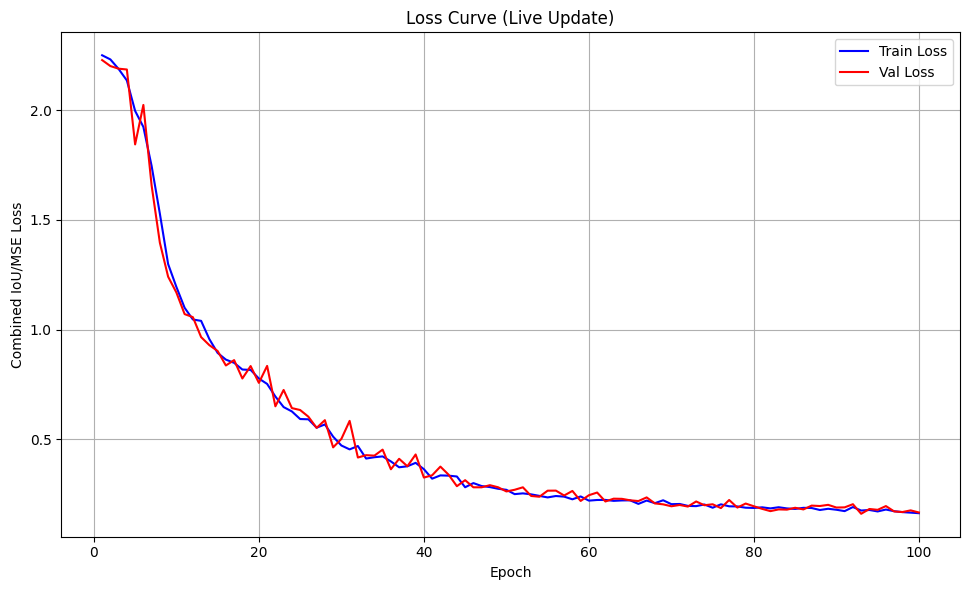

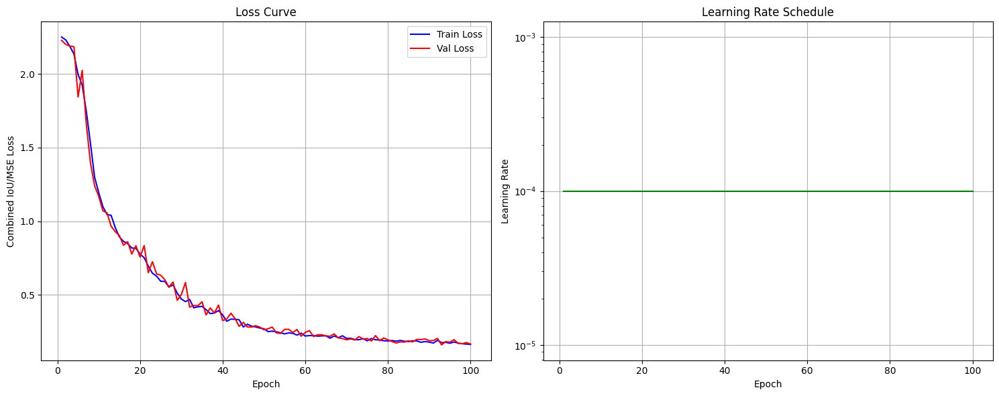

IoU > 0.7 Accuracy: 43.20%
Mean IoU: 0.6285, Median IoU: 0.6695
IoU Distribution:
  IoU > 0.5: 76.85%
  IoU > 0.6: 64.30%
  IoU > 0.7: 43.20%
  IoU > 0.8: 20.00%
  IoU > 0.9: 2.70%


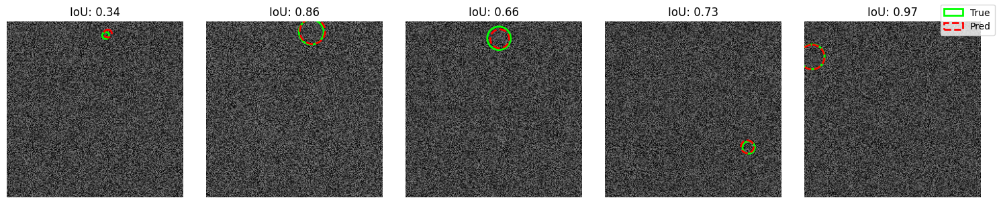

TypeError: CircleFinderCNN.__init__() got an unexpected keyword argument 'dropout_rate'

In [15]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import json
from torchvision import transforms
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from shapely.geometry import Point
#from create_dataset import generate_circle

# --------- Normalization Constants ---------
IMG_SIZE = 256
RADIUS_MIN, RADIUS_MAX = 3, 20

# --------- On-the-Fly Dataset Definition ---------
class CircleOnTheFlyDataset(Dataset):
    def __init__(self, n_samples=10000, noise_level=2):
        self.n_samples = n_samples
        self.noise_level = noise_level

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        img, label = generate_circle(noise_level=self.noise_level)
        img = np.expand_dims(img, axis=0)  # shape: (1, 256, 256)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

# Add circle kernel creation function
def create_circle_kernel(radius, size=None):
    """Create a kernel that responds to circles of a specific radius"""
    if size is None:
        size = 2 * radius + 3  # Instead of +5

    kernel = np.zeros((size, size))
    center = size // 2

    y, x = np.ogrid[-center:size-center, -center:size-center]
    # Create a ring with thickness of 1 pixel
    mask = (x**2 + y**2 <= (radius+0.5)**2) & (x**2 + y**2 >= (radius-0.5)**2)
    kernel[mask] = 1.0

    # Normalize kernel
    return kernel / kernel.sum() if kernel.sum() > 0 else kernel

# --------- CNN Model Definition with Circle Kernels ---------
class CircleFinderCNN(nn.Module):
    def __init__(self):
        super(CircleFinderCNN, self).__init__()

        # Standard convolutional path
        self.conv1 = nn.Conv2d(1, 12, kernel_size=5, stride=1, padding=2)

        # Circle-specialized kernels path (4 filters for different radii ranges)
        self.circle_kernels = nn.ModuleList()
        for radius in [5, 10, 15, 20]:  # Representative radii
            kernel_size = min(2 * radius + 3, 21)  # Smaller kernels
            kernel = torch.tensor(create_circle_kernel(radius, size=kernel_size), dtype=torch.float32)
            conv = nn.Conv2d(1, 1, kernel_size=kernel.shape[0], padding=kernel.shape[0]//2)

            # Initialize with our circle kernel but with lower magnitude
            kernel = kernel * 0.1  # Scale down initial weights to prevent explosion
            conv.weight.data = kernel.unsqueeze(0).unsqueeze(0)
            self.circle_kernels.append(conv)

        # Rest of your architecture
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=5, stride=1, padding=2)

        # Fully connected layers (without batch norm)
        self.fc1 = nn.Linear(64 * 32 * 32, 1024)
        self.fc2 = nn.Linear(1024, 128)
        self.fc3 = nn.Linear(128, 3)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # Downsample first, then apply expensive circle kernels
        x_downsampled = self.pool(x)  # Now 128x128 instead of 256x256

        # Apply circle kernels to smaller feature map
        circle_features = [F.relu(kernel(x_downsampled)) for kernel in self.circle_kernels]
        circle_features = torch.cat(circle_features, dim=1)

        # Standard path
        x1 = self.pool(F.relu(self.conv1(x)))

        # Now both paths are 128x128 spatially
        # Combine paths
        x = torch.cat([x1, circle_features], dim=1)

        # Continue with the standard pipeline
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))

        # Flatten for fully connected layers
        x = x.view(-1, 64 * 32 * 32)

        # FC layers
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.sigmoid(self.fc3(x))
        return x

# --------- Training Loop ---------
def train_model(model, train_loader, val_loader, device, epochs=200, lr=1e-4, patience=20):
    # MUCH LOWER learning rate for circle kernels model
    optimizer = torch.optim.Adam(
        model.parameters(),
        lr=1e-4,  # Changed from 1e-2 to 1e-4
        weight_decay=1e-5
    )

    # Add gradient clipping to prevent explosion
    max_grad_norm = 1.0  # Maximum gradient norm

    # Learning rate scheduler for Adam
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode='min',
        factor=0.2,
        patience=10,
        verbose=True,
        min_lr=1e-6
    )

    def loss_function(pred, target):
        return combined_loss(pred, target, alpha=0.6)

    model.to(device)
    best_val_loss = float('inf')
    patience_counter = 0
    train_losses, val_losses = [], []

    # Set up the live plot
    plt.ion()  # Turn on interactive mode
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Combined IoU/MSE Loss')
    ax.set_title('Loss Curve (Live Update)')
    ax.grid(True)
    train_line, = ax.plot([], [], 'b-', label='Train Loss')
    val_line, = ax.plot([], [], 'r-', label='Val Loss')
    ax.legend()
    plt.tight_layout()

    # Lists to store epoch numbers and learning rates
    epochs_list = []
    lr_history = []

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for imgs, targets in train_loader:
            imgs, targets = imgs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = loss_function(outputs, targets)
            loss.backward()

            # Add gradient clipping before optimizer step
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)

            optimizer.step()
            train_loss += loss.item()

            # Safety check for NaN loss
            if torch.isnan(loss):
                print("Warning: NaN loss detected. Skipping batch.")
                optimizer.zero_grad()  # Clear the bad gradients
                continue

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        val_loss = 0
        model.eval()
        with torch.no_grad():
            for imgs, targets in val_loader:
                imgs, targets = imgs.to(device), targets.to(device)
                outputs = model(imgs)
                loss = loss_function(outputs, targets)
                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)
        epochs_list.append(epoch + 1)

        # Update learning rate based on validation loss
        scheduler.step(val_loss)  # For ReduceLROnPlateau

        # Store current learning rate
        lr_history.append(optimizer.param_groups[0]['lr'])

        # Only print loss every 10 epochs (or for the first epoch)
        if epoch == 0 or (epoch + 1) % 10 == 0 or (epoch + 1) == epochs:
            print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, LR: {optimizer.param_groups[0]['lr']:.2e}")

        # Update the live plot
        train_line.set_data(epochs_list, train_losses)
        val_line.set_data(epochs_list, val_losses)
        ax.relim()  # Recalculate limits
        ax.autoscale_view()  # Autoscale
        fig.canvas.draw()
        fig.canvas.flush_events()

        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    # Turn off interactive mode after training
    plt.ioff()

    # Final static plot - now with two subplots
    plt.figure(figsize=(15, 6))

    # Loss plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_list, train_losses, 'b-', label='Train Loss')
    plt.plot(epochs_list, val_losses, 'r-', label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Combined IoU/MSE Loss')
    plt.title('Loss Curve')
    plt.legend()
    plt.grid(True)

    # Learning rate plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_list, lr_history, 'g-')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.title('Learning Rate Schedule')
    plt.grid(True)
    plt.yscale('log')  # Log scale for better visualization

    plt.tight_layout()
    plt.show()


# --------- Evaluation and Visualization ---------
def show_predictions(model, dataset, device, num_samples=5):
    model.eval()
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 3))
    for i, idx in enumerate(indices):
        img, true = dataset[idx]
        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device)).cpu().numpy()[0]
        # Denormalize
        true_row = true[0].item() * IMG_SIZE
        true_col = true[1].item() * IMG_SIZE
        true_rad = true[2].item() * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        pred_row = pred[0] * IMG_SIZE
        pred_col = pred[1] * IMG_SIZE
        pred_rad = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        axs[i].imshow(img.squeeze(), cmap='gray')
        axs[i].add_patch(plt.Circle((true_col, true_row), true_rad, color='lime', fill=False, linewidth=2, label='True'))
        axs[i].add_patch(plt.Circle((pred_col, pred_row), pred_rad, color='red', fill=False, linewidth=2, linestyle='--', label='Pred'))
        axs[i].set_title(f"IoU: {intersection_over_union({'row': true_row, 'col': true_col, 'radius': true_rad}, {'row': pred_row, 'col': pred_col, 'radius': pred_rad}):.2f}")
        axs[i].axis('off')
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    plt.tight_layout()
    plt.show()

def intersection_over_union(circ1_dict, circ2_dict):
    shape1 = Point(circ1_dict['row'], circ1_dict['col']).buffer(circ1_dict['radius'])
    shape2 = Point(circ2_dict['row'], circ2_dict['col']).buffer(circ2_dict['radius'])
    return shape1.intersection(shape2).area / shape1.union(shape2).area

def evaluate_model(model, dataloader, device, iou_threshold=0.7):
    model.eval()
    matches = 0
    total = 0
    all_ious = []  # Track all IoU values

    with torch.no_grad():
        for imgs, targets in dataloader:
            imgs = imgs.to(device)
            outputs = model(imgs).cpu().numpy()
            targets = targets.numpy()
            for pred, true in zip(outputs, targets):
                # Denormalize for IoU calculation
                pred_row = pred[0] * IMG_SIZE
                pred_col = pred[1] * IMG_SIZE
                pred_radius = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                true_row = true[0] * IMG_SIZE
                true_col = true[1] * IMG_SIZE
                true_radius = true[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                pred_dict = {'row': pred_row, 'col': pred_col, 'radius': pred_radius}
                true_dict = {'row': true_row, 'col': true_col, 'radius': true_radius}

                iou = intersection_over_union(pred_dict, true_dict)
                all_ious.append(iou)

                if iou > iou_threshold:
                    matches += 1
                total += 1

    # Calculate more informative metrics
    accuracy = matches / total
    mean_iou = sum(all_ious) / len(all_ious)
    median_iou = sorted(all_ious)[len(all_ious)//2]

    # Show distribution in IoU brackets
    brackets = [0.5, 0.6, 0.7, 0.8, 0.9]
    bracket_counts = [sum(1 for iou in all_ious if iou > thresh) / total for thresh in brackets]

    print(f"IoU > {iou_threshold} Accuracy: {accuracy:.2%}")
    print(f"Mean IoU: {mean_iou:.4f}, Median IoU: {median_iou:.4f}")
    print("IoU Distribution:")
    for thresh, count in zip(brackets, bracket_counts):
        print(f"  IoU > {thresh:.1f}: {count:.2%}")

    return accuracy, mean_iou, all_ious

def iou_loss(pred, target, epsilon=1e-6, target_threshold=0.7):
    """Enhanced IoU loss with threshold focus."""
    # Denormalize predictions and targets
    pred_row = pred[:, 0] * IMG_SIZE
    pred_col = pred[:, 1] * IMG_SIZE
    pred_radius = pred[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    target_row = target[:, 0] * IMG_SIZE
    target_col = target[:, 1] * IMG_SIZE
    target_radius = target[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    # Ensure positive radius (prevent div by zero)
    pred_radius = torch.clamp(pred_radius, min=0.1)

    # Distance between centers
    center_dist = torch.sqrt((pred_row - target_row)**2 + (pred_col - target_col)**2)

    # Sum of radii
    radii_sum = pred_radius + target_radius

    # Larger epsilon to prevent division by very small numbers
    epsilon = 1e-4

    # Base IoU component calculation
    dist_loss = center_dist / (radii_sum + epsilon)
    radius_loss = torch.abs(pred_radius - target_radius) / (radii_sum + epsilon)
    base_iou_loss = dist_loss + radius_loss

    # Estimated IoU - approximate conversion from our distance metrics
    # This is a rough approximation to help with scaling
    est_iou = 1.0 - torch.clamp(base_iou_loss, 0.0, 1.0)

    # Apply increased penalty for predictions near but below threshold
    # This creates a "soft hinge" that pushes predictions to exceed the threshold
    threshold_penalty = torch.where(
        (est_iou < target_threshold) & (est_iou > target_threshold - 0.2),
        1.5 * (target_threshold - est_iou),  # 1.5x penalty in the critical region
        torch.zeros_like(est_iou)
    )

    # Combined loss with threshold incentive
    return base_iou_loss.mean() + threshold_penalty.mean()

def combined_loss(pred, target, alpha=0.6):
    """Combined MSE and enhanced IoU loss."""
    mse_component = F.mse_loss(pred, target)
    iou_component = iou_loss(pred, target, target_threshold=0.7)

    # Slightly higher alpha - focus more on IoU now that training is stable
    return alpha * iou_component + (1-alpha) * mse_component

# --------- Example Usage ---------
if __name__ == '__main__':
    train_dataset = CircleOnTheFlyDataset(n_samples=10000)
    val_dataset = CircleOnTheFlyDataset(n_samples=2000)

    # train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True)
    # val_loader = DataLoader(val_dataset, batch_size=100)

    # A100-optimized DataLoaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=256,
        shuffle=True,
        num_workers=4,
        pin_memory=True,  # Important for faster CPU->GPU data transfer
    #    persistent_workers=True  # Keeps workers alive between iterations
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=256,
        shuffle=False,  # No need to shuffle validation data
        num_workers=4,
        pin_memory=True
    )


    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = CircleFinderCNN()
    train_model(model, train_loader, val_loader, device, epochs=100, patience=15, lr=1e-4)
    evaluate_model(model, val_loader, device)
    show_predictions(model, val_dataset, device, num_samples=5)

    # Or with custom dropout rate
    model = CircleFinderCNN(dropout_rate=0)  # Higher dropout for more regularization

    # Much smaller kernels that still detect circles
    for radius in [5, 10, 15, 20]:
        kernel_size = min(2 * radius + 3, 21)  # Cap at 21x21
        kernel = torch.tensor(create_circle_kernel(radius, size=kernel_size), dtype=torch.float32)

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1, Train Loss: 3.4344, Val Loss: 3.0590, LR: 2.00e-05
Epoch 10, Train Loss: 3.3666, Val Loss: 3.0731, LR: 1.00e-04
Epoch 20, Train Loss: 3.2318, Val Loss: 2.9582, LR: 1.00e-04


KeyboardInterrupt: 

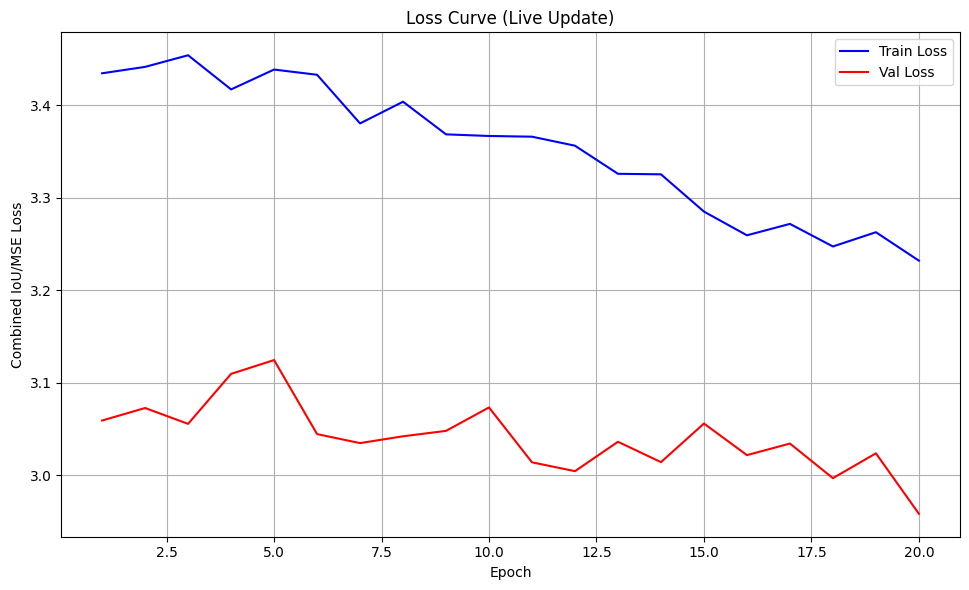

In [17]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import json
from torchvision import transforms
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from shapely.geometry import Point
#from create_dataset import generate_circle

# --------- Normalization Constants ---------
IMG_SIZE = 256
RADIUS_MIN, RADIUS_MAX = 3, 20

# --------- On-the-Fly Dataset Definition ---------
class CircleOnTheFlyDataset(Dataset):
    def __init__(self, n_samples=10000, noise_level=2):
        self.n_samples = n_samples
        self.noise_level = noise_level

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        img, label = generate_circle(noise_level=self.noise_level)
        img = np.expand_dims(img, axis=0)  # shape: (1, 256, 256)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

# Add circle kernel creation function
def create_circle_kernel(radius, size=None):
    """Create a kernel that responds to circles of a specific radius"""
    if size is None:
        size = 2 * radius + 3  # Instead of +5

    kernel = np.zeros((size, size))
    center = size // 2

    y, x = np.ogrid[-center:size-center, -center:size-center]
    # Create a ring with thickness of 1 pixel
    mask = (x**2 + y**2 <= (radius+0.5)**2) & (x**2 + y**2 >= (radius-0.5)**2)
    kernel[mask] = 1.0

    # Normalize kernel
    return kernel / kernel.sum() if kernel.sum() > 0 else kernel

# --------- CNN Model Definition with Circle Kernels ---------
class CircleFinderCNN(nn.Module):
    def __init__(self, dropout_rate=0.3):
        super(CircleFinderCNN, self).__init__()

        # Standard convolutional path
        self.conv1 = nn.Conv2d(1, 12, kernel_size=5, stride=1, padding=2)
        self.bn1 = nn.BatchNorm2d(12)

        # Circle-specialized kernels
        self.circle_kernels = nn.ModuleList()
        for radius in [5, 10, 15, 20]:
            kernel_size = min(2 * radius + 3, 21)
            kernel = torch.tensor(create_circle_kernel(radius, size=kernel_size), dtype=torch.float32)
            conv = nn.Conv2d(1, 1, kernel_size=kernel.shape[0], padding=kernel.shape[0]//2)
            kernel = kernel * 0.1
            conv.weight.data = kernel.unsqueeze(0).unsqueeze(0)
            self.circle_kernels.append(conv)

        # BatchNorm for circle features
        self.bn_circle = nn.BatchNorm2d(4)  # 4 circle filters

        # More convolutional layers with BN
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.bn2 = nn.BatchNorm2d(32)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=5, stride=1, padding=2)
        self.bn3 = nn.BatchNorm2d(64)

        # Dropout
        self.dropout_conv = nn.Dropout2d(dropout_rate/2)
        self.dropout_fc = nn.Dropout(dropout_rate)

        # FC layers with BN
        self.fc1 = nn.Linear(64 * 32 * 32, 1024)
        self.bn_fc1 = nn.BatchNorm1d(1024)
        self.fc2 = nn.Linear(1024, 128)
        self.bn_fc2 = nn.BatchNorm1d(128)
        self.fc3 = nn.Linear(128, 3)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # Downsample first for circle kernels
        x_downsampled = self.pool(x)

        # Circle kernel path with BN
        circle_features = [F.relu(kernel(x_downsampled)) for kernel in self.circle_kernels]
        circle_features = torch.cat(circle_features, dim=1)
        circle_features = self.bn_circle(circle_features)
        circle_features = self.dropout_conv(circle_features)

        # Standard path with BN
        x1 = F.relu(self.bn1(self.conv1(x)))
        x1 = self.pool(x1)
        x1 = self.dropout_conv(x1)

        # Combine paths
        x = torch.cat([x1, circle_features], dim=1)

        # Continue with BN and dropout
        x = F.relu(self.bn2(self.conv2(x)))
        x = self.pool(x)
        x = self.dropout_conv(x)

        x = F.relu(self.bn3(self.conv3(x)))
        x = self.pool(x)
        x = self.dropout_conv(x)

        # FC layers with BN and dropout
        x = x.view(-1, 64 * 32 * 32)
        x = F.relu(self.bn_fc1(self.fc1(x)))
        x = self.dropout_fc(x)
        x = F.relu(self.bn_fc2(self.fc2(x)))
        x = self.dropout_fc(x)

        x = self.sigmoid(self.fc3(x))
        return x

# --------- Training Loop ---------
def train_model(model, train_loader, val_loader, device, epochs=200, lr=1e-3, patience=20):
    # Use SGD with momentum
    optimizer = torch.optim.SGD(
        model.parameters(),
        lr=lr,                # Start with moderate learning rate
        momentum=0.9,         # Important for smoothing and escaping local minima
        weight_decay=1e-4,    # Slightly stronger weight decay than Adam
        nesterov=True         # Use Nesterov momentum for better performance
    )

    # More aggressive LR scheduling for SGD
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode='min',
        factor=0.1,           # Reduce by factor of 10
        patience=15,          # Wait longer before reducing
        verbose=True,
        min_lr=1e-6
    )

    # Gradient clipping is still beneficial
    max_grad_norm = 1.0

    def loss_function(pred, target):
        return combined_loss(pred, target, alpha=0.6)

    model.to(device)
    best_val_loss = float('inf')
    patience_counter = 0
    train_losses, val_losses = [], []

    # Set up the live plot
    plt.ion()  # Turn on interactive mode
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Combined IoU/MSE Loss')
    ax.set_title('Loss Curve (Live Update)')
    ax.grid(True)
    train_line, = ax.plot([], [], 'b-', label='Train Loss')
    val_line, = ax.plot([], [], 'r-', label='Val Loss')
    ax.legend()
    plt.tight_layout()

    # Lists to store epoch numbers and learning rates
    epochs_list = []
    lr_history = []

    # Add warmup to the beginning of the training loop
    warmup_epochs = 5
    for epoch in range(epochs):
        # Learning rate warmup
        if epoch < warmup_epochs:
            for param_group in optimizer.param_groups:
                param_group['lr'] = lr * (epoch + 1) / warmup_epochs

        model.train()
        train_loss = 0
        for imgs, targets in train_loader:
            imgs, targets = imgs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = loss_function(outputs, targets)
            loss.backward()

            # Add gradient clipping before optimizer step
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)

            optimizer.step()
            train_loss += loss.item()

            # Safety check for NaN loss
            if torch.isnan(loss):
                print("Warning: NaN loss detected. Skipping batch.")
                optimizer.zero_grad()  # Clear the bad gradients
                continue

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        val_loss = 0
        model.eval()
        with torch.no_grad():
            for imgs, targets in val_loader:
                imgs, targets = imgs.to(device), targets.to(device)
                outputs = model(imgs)
                loss = loss_function(outputs, targets)
                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)
        epochs_list.append(epoch + 1)

        # Update learning rate based on validation loss
        scheduler.step(val_loss)  # For ReduceLROnPlateau

        # Store current learning rate
        lr_history.append(optimizer.param_groups[0]['lr'])

        # Only print loss every 10 epochs (or for the first epoch)
        if epoch == 0 or (epoch + 1) % 10 == 0 or (epoch + 1) == epochs:
            print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, LR: {optimizer.param_groups[0]['lr']:.2e}")

        # Update the live plot
        train_line.set_data(epochs_list, train_losses)
        val_line.set_data(epochs_list, val_losses)
        ax.relim()  # Recalculate limits
        ax.autoscale_view()  # Autoscale
        fig.canvas.draw()
        fig.canvas.flush_events()

        # Early stopping check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    # Turn off interactive mode after training
    plt.ioff()

    # Final static plot - now with two subplots
    plt.figure(figsize=(15, 6))

    # Loss plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_list, train_losses, 'b-', label='Train Loss')
    plt.plot(epochs_list, val_losses, 'r-', label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Combined IoU/MSE Loss')
    plt.title('Loss Curve')
    plt.legend()
    plt.grid(True)

    # Learning rate plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_list, lr_history, 'g-')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.title('Learning Rate Schedule')
    plt.grid(True)
    plt.yscale('log')  # Log scale for better visualization

    plt.tight_layout()
    plt.show()


# --------- Evaluation and Visualization ---------
def show_predictions(model, dataset, device, num_samples=5):
    model.eval()
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 3))
    for i, idx in enumerate(indices):
        img, true = dataset[idx]
        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device)).cpu().numpy()[0]
        # Denormalize
        true_row = true[0].item() * IMG_SIZE
        true_col = true[1].item() * IMG_SIZE
        true_rad = true[2].item() * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        pred_row = pred[0] * IMG_SIZE
        pred_col = pred[1] * IMG_SIZE
        pred_rad = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
        axs[i].imshow(img.squeeze(), cmap='gray')
        axs[i].add_patch(plt.Circle((true_col, true_row), true_rad, color='lime', fill=False, linewidth=2, label='True'))
        axs[i].add_patch(plt.Circle((pred_col, pred_row), pred_rad, color='red', fill=False, linewidth=2, linestyle='--', label='Pred'))
        axs[i].set_title(f"IoU: {intersection_over_union({'row': true_row, 'col': true_col, 'radius': true_rad}, {'row': pred_row, 'col': pred_col, 'radius': pred_rad}):.2f}")
        axs[i].axis('off')
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    plt.tight_layout()
    plt.show()

def intersection_over_union(circ1_dict, circ2_dict):
    shape1 = Point(circ1_dict['row'], circ1_dict['col']).buffer(circ1_dict['radius'])
    shape2 = Point(circ2_dict['row'], circ2_dict['col']).buffer(circ2_dict['radius'])
    return shape1.intersection(shape2).area / shape1.union(shape2).area

def evaluate_model(model, dataloader, device, iou_threshold=0.7):
    model.eval()
    matches = 0
    total = 0
    all_ious = []  # Track all IoU values

    with torch.no_grad():
        for imgs, targets in dataloader:
            imgs = imgs.to(device)
            outputs = model(imgs).cpu().numpy()
            targets = targets.numpy()
            for pred, true in zip(outputs, targets):
                # Denormalize for IoU calculation
                pred_row = pred[0] * IMG_SIZE
                pred_col = pred[1] * IMG_SIZE
                pred_radius = pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                true_row = true[0] * IMG_SIZE
                true_col = true[1] * IMG_SIZE
                true_radius = true[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

                pred_dict = {'row': pred_row, 'col': pred_col, 'radius': pred_radius}
                true_dict = {'row': true_row, 'col': true_col, 'radius': true_radius}

                iou = intersection_over_union(pred_dict, true_dict)
                all_ious.append(iou)

                if iou > iou_threshold:
                    matches += 1
                total += 1

    # Calculate more informative metrics
    accuracy = matches / total
    mean_iou = sum(all_ious) / len(all_ious)
    median_iou = sorted(all_ious)[len(all_ious)//2]

    # Show distribution in IoU brackets
    brackets = [0.5, 0.6, 0.7, 0.8, 0.9]
    bracket_counts = [sum(1 for iou in all_ious if iou > thresh) / total for thresh in brackets]

    print(f"IoU > {iou_threshold} Accuracy: {accuracy:.2%}")
    print(f"Mean IoU: {mean_iou:.4f}, Median IoU: {median_iou:.4f}")
    print("IoU Distribution:")
    for thresh, count in zip(brackets, bracket_counts):
        print(f"  IoU > {thresh:.1f}: {count:.2%}")

    return accuracy, mean_iou, all_ious

def iou_loss(pred, target, epsilon=1e-6, target_threshold=0.7):
    """Enhanced IoU loss with threshold focus."""
    # Denormalize predictions and targets
    pred_row = pred[:, 0] * IMG_SIZE
    pred_col = pred[:, 1] * IMG_SIZE
    pred_radius = pred[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    target_row = target[:, 0] * IMG_SIZE
    target_col = target[:, 1] * IMG_SIZE
    target_radius = target[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN

    # Ensure positive radius (prevent div by zero)
    pred_radius = torch.clamp(pred_radius, min=0.1)

    # Distance between centers
    center_dist = torch.sqrt((pred_row - target_row)**2 + (pred_col - target_col)**2)

    # Sum of radii
    radii_sum = pred_radius + target_radius

    # Larger epsilon to prevent division by very small numbers
    epsilon = 1e-4

    # Base IoU component calculation
    dist_loss = center_dist / (radii_sum + epsilon)
    radius_loss = torch.abs(pred_radius - target_radius) / (radii_sum + epsilon)
    base_iou_loss = dist_loss + radius_loss

    # Estimated IoU - approximate conversion from our distance metrics
    # This is a rough approximation to help with scaling
    est_iou = 1.0 - torch.clamp(base_iou_loss, 0.0, 1.0)

    # Apply increased penalty for predictions near but below threshold
    # This creates a "soft hinge" that pushes predictions to exceed the threshold
    threshold_penalty = torch.where(
        (est_iou < target_threshold) & (est_iou > target_threshold - 0.2),
        1.5 * (target_threshold - est_iou),  # 1.5x penalty in the critical region
        torch.zeros_like(est_iou)
    )

    # Combined loss with threshold incentive
    return base_iou_loss.mean() + threshold_penalty.mean()

def combined_loss(pred, target, alpha=0.6):
    """Combined MSE and enhanced IoU loss."""
    mse_component = F.mse_loss(pred, target)
    iou_component = iou_loss(pred, target, target_threshold=0.7)

    # Slightly higher alpha - focus more on IoU now that training is stable
    return alpha * iou_component + (1-alpha) * mse_component

# --------- Example Usage ---------
if __name__ == '__main__':
    train_dataset = CircleOnTheFlyDataset(n_samples=10000)
    val_dataset = CircleOnTheFlyDataset(n_samples=2000)

    # train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True)
    # val_loader = DataLoader(val_dataset, batch_size=100)

    # A100-optimized DataLoaders
    train_loader = DataLoader(
        train_dataset,
        batch_size=256,
        shuffle=True,
        num_workers=4,
        pin_memory=True,  # Important for faster CPU->GPU data transfer
    #    persistent_workers=True  # Keeps workers alive between iterations
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=256,
        shuffle=False,  # No need to shuffle validation data
        num_workers=4,
        pin_memory=True
    )


    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = CircleFinderCNN()
    train_model(model, train_loader, val_loader, device, epochs=100, patience=15, lr=1e-3)
    evaluate_model(model, val_loader, device)
    show_predictions(model, val_dataset, device, num_samples=5)

    # Or with custom dropout rate
    model = CircleFinderCNN(dropout_rate=0)  # Higher dropout for more regularization

    # Much smaller kernels that still detect circles
    for radius in [5, 10, 15, 20]:
        kernel_size = min(2 * radius + 3, 21)  # Cap at 21x21
        kernel = torch.tensor(create_circle_kernel(radius, size=kernel_size), dtype=torch.float32)

ENd ------

In [11]:
evaluate_model(model, val_loader, device)

RuntimeError: Input type (torch.cuda.FloatTensor) and weight type (torch.FloatTensor) should be the same

In [28]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import json
from torchvision import transforms
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from shapely.geometry import Point

# --------- Normalization Constants ---------
IMG_SIZE = 256
RADIUS_MIN, RADIUS_MAX = 3, 20

# --------- On-the-Fly Dataset Definition ---------
class CircleOnTheFlyDataset(Dataset):
    def __init__(self, n_samples=10000, noise_level=2):
        self.n_samples = n_samples
        self.noise_level = noise_level

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        img, label = generate_circle(noise_level=self.noise_level)
        img = np.expand_dims(img, axis=0)  # shape: (1, 256, 256)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

# --------- CNN Model Definition ---------
class CircleFinderCNN(nn.Module):
    def __init__(self):
        super(CircleFinderCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 16, kernel_size=5, stride=1, padding=2)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.fc1 = nn.Linear(32 * 64 * 64, 128)
        self.fc2 = nn.Linear(128, 3)
        self.sigmoid = nn.Sigmoid()  # Output in range [0, 1]

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 32 * 64 * 64)
        x = F.relu(self.fc1(x))
        x = self.sigmoid(self.fc2(x))
        return x

# --------- Training Loop ---------
def train_model(model, train_loader, val_loader, device, epochs=100, lr=1e-4, patience=15):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    def custom_loss(pred, target):
        pred_area = ((pred[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN) ** 2)
        true_area = ((target[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN) ** 2)
        area_loss = F.mse_loss(pred_area / 1000, true_area / 1000)  # scale area
        pos_loss = F.mse_loss(pred[:, 0:2], target[:, 0:2])
        return pos_loss + area_loss
    # def custom_loss(pred, target):
    #     pos_loss = F.mse_loss(pred[:, 0:2], target[:, 0:2])
    #     radius_loss = F.mse_loss(pred[:, 2], target[:, 2])  # normalized radius
    #     return pos_loss + 2 * radius_loss

    model.to(device)
    best_val_loss = float('inf')
    patience_counter = 0
    train_losses, val_losses = [], []

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for imgs, targets in train_loader:
            imgs, targets = imgs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = custom_loss(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        val_loss = 0
        model.eval()
        with torch.no_grad():
            for imgs, targets in val_loader:
                imgs, targets = imgs.to(device), targets.to(device)
                outputs = model(imgs)
                loss = custom_loss(outputs, targets)
                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)

        print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    # Plot loss
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Custom Weighted Loss')
    plt.title('Loss Curve')
    plt.legend()
    plt.grid(True)
    plt.show()




Epoch 1, Train Loss: 0.0979, Val Loss: 0.0950
Epoch 2, Train Loss: 0.0957, Val Loss: 0.0927
Epoch 3, Train Loss: 0.0942, Val Loss: 0.0968
Epoch 4, Train Loss: 0.0957, Val Loss: 0.0942
Epoch 5, Train Loss: 0.0948, Val Loss: 0.0942
Epoch 6, Train Loss: 0.0924, Val Loss: 0.0914
Epoch 7, Train Loss: 0.0915, Val Loss: 0.0891
Epoch 8, Train Loss: 0.0856, Val Loss: 0.0793
Epoch 9, Train Loss: 0.0758, Val Loss: 0.0694
Epoch 10, Train Loss: 0.0683, Val Loss: 0.0615
Epoch 11, Train Loss: 0.0576, Val Loss: 0.0568
Epoch 12, Train Loss: 0.0505, Val Loss: 0.0459
Epoch 13, Train Loss: 0.0442, Val Loss: 0.0418
Epoch 14, Train Loss: 0.0381, Val Loss: 0.0367
Epoch 15, Train Loss: 0.0346, Val Loss: 0.0314
Epoch 16, Train Loss: 0.0310, Val Loss: 0.0297
Epoch 17, Train Loss: 0.0290, Val Loss: 0.0288
Epoch 18, Train Loss: 0.0271, Val Loss: 0.0251
Epoch 19, Train Loss: 0.0258, Val Loss: 0.0235
Epoch 20, Train Loss: 0.0241, Val Loss: 0.0244
Epoch 21, Train Loss: 0.0230, Val Loss: 0.0234
Epoch 22, Train Loss: 

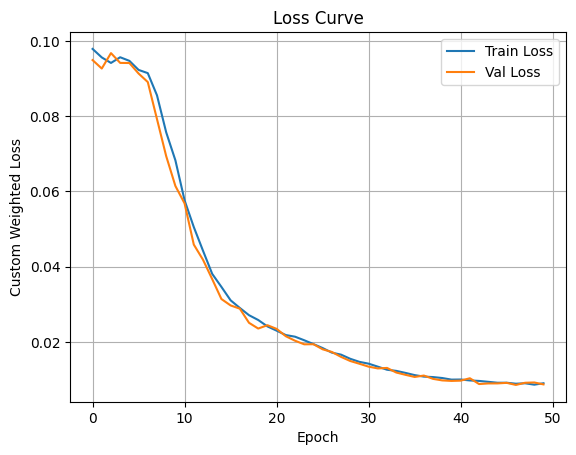

IoU > 0.7 Accuracy: 42.65%


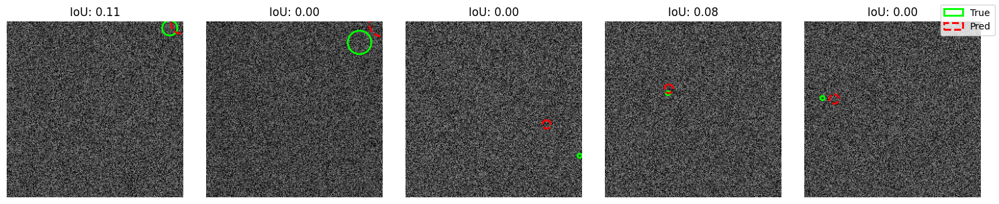

In [ ]:
# --------- Example Usage ---------
if __name__ == '__main__':
    train_dataset = CircleOnTheFlyDataset(n_samples=8000)
    val_dataset = CircleOnTheFlyDataset(n_samples=2000)

    train_loader = DataLoader(train_dataset, batch_size=50, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=50)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = CircleFinderCNN()
    train_model(model, train_loader, val_loader, device, epochs=50, patience=10)

    evaluate_model(model, val_loader, device)

    show_predictions(model, val_dataset, device, num_samples=5)

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import json
from torchvision import transforms
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from shapely.geometry import Point
#from create_dataset import generate_circle

# --------- Normalization Constants ---------
IMG_SIZE = 256
RADIUS_MIN, RADIUS_MAX = 3, 20

# --------- On-the-Fly Dataset Definition ---------
class CircleOnTheFlyDataset(Dataset):
    def __init__(self, n_samples=10000, noise_level=2):
        self.n_samples = n_samples
        self.noise_level = noise_level

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        img, label = generate_circle(noise_level=self.noise_level)
        img = np.expand_dims(img, axis=0)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

# --------- Fixed Validation Dataset from JSON ---------
class CircleJsonDataset(Dataset):
    def __init__(self, data_folder):
        self.files = [os.path.join(data_folder, f) for f in os.listdir(data_folder) if f.endswith('.json')]

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        with open(self.files[idx], 'r') as f:
            data = json.load(f)
        img = np.array(data['img'], dtype=np.float32)
        label = data['label']
        img = np.expand_dims(img, axis=0)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

# --------- CNN Model Definition ---------
def create_circular_kernel(kernel_size=5):
    center = (kernel_size - 1) / 2
    y, x = np.ogrid[:kernel_size, :kernel_size]
    dist = np.sqrt((x - center) ** 2 + (y - center) ** 2)
    circle = np.exp(-((dist - center) ** 2) / (2.0 * 0.5 ** 2))
    return torch.tensor(circle, dtype=torch.float32)

class CircleFinderCNN(nn.Module):
    def __init__(self):
        super(CircleFinderCNN, self).__init__()

        circular_kernel = create_circular_kernel(5).unsqueeze(0).unsqueeze(0)  # shape: (1, 1, 5, 5)
        self.fixed_conv = nn.Conv2d(1, 1, kernel_size=5, padding=2, bias=False)
        self.fixed_conv.weight = nn.Parameter(circular_kernel, requires_grad=False)

        self.conv1 = nn.Conv2d(1, 16, kernel_size=5, stride=1, padding=2)
        self.bn1 = nn.BatchNorm2d(16)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.bn2 = nn.BatchNorm2d(32)

        self.conv3 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.bn3 = nn.BatchNorm2d(64)

        self.dropout = nn.Dropout(p=0.0)
        self.fc1 = nn.Linear(64 * 32 * 32, 128)
        self.fc2 = nn.Linear(128, 3)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.fixed_conv(x)  # circular filter pre-processing
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = x.view(-1, 64 * 32 * 32)
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.sigmoid(self.fc2(x))
        return x

# --------- Training Loop ---------
# (unchanged)




Epoch 1, Train Loss: 0.9405, Val Loss: 0.9324, IoU > 0.7 Accuracy: 0.00%
Epoch 2, Train Loss: 0.9406, Val Loss: 0.9324, IoU > 0.7 Accuracy: 0.00%
Epoch 3, Train Loss: 0.9284, Val Loss: 0.9324, IoU > 0.7 Accuracy: 0.00%
Epoch 4, Train Loss: 0.9400, Val Loss: 0.9324, IoU > 0.7 Accuracy: 0.00%
Epoch 5, Train Loss: 0.9507, Val Loss: 0.9324, IoU > 0.7 Accuracy: 0.00%
Epoch 6, Train Loss: 0.9372, Val Loss: 0.9324, IoU > 0.7 Accuracy: 0.00%
Epoch 7, Train Loss: 0.9352, Val Loss: 0.9324, IoU > 0.7 Accuracy: 0.00%
Epoch 8, Train Loss: 0.9303, Val Loss: 0.9324, IoU > 0.7 Accuracy: 0.00%
Epoch 9, Train Loss: 0.9365, Val Loss: 0.9324, IoU > 0.7 Accuracy: 0.00%
Epoch 10, Train Loss: 0.9357, Val Loss: 0.9324, IoU > 0.7 Accuracy: 0.00%
Epoch 11, Train Loss: 0.9457, Val Loss: 0.9324, IoU > 0.7 Accuracy: 0.00%
Epoch 12, Train Loss: 0.9424, Val Loss: 0.9324, IoU > 0.7 Accuracy: 0.00%
Epoch 13, Train Loss: 0.9304, Val Loss: 0.9324, IoU > 0.7 Accuracy: 0.00%
Epoch 14, Train Loss: 0.9424, Val Loss: 0.9324,

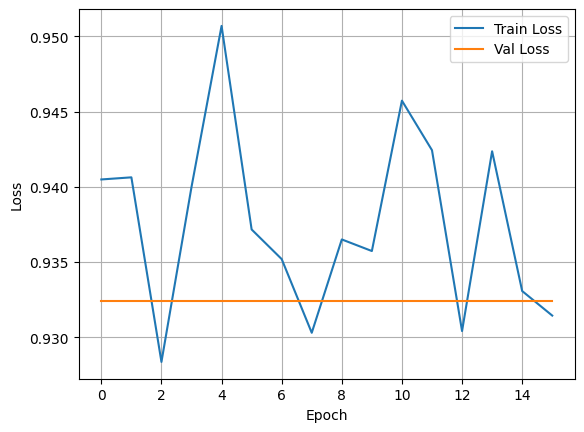

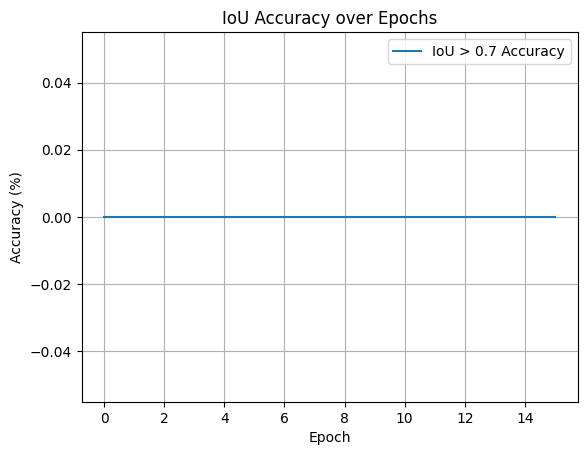

Model saved as 'circle_finder_model.pkl


ZeroDivisionError: float division by zero

In [ ]:
# --------- Example Usage ---------
if __name__ == '__main__':
    train_dataset = CircleOnTheFlyDataset(n_samples=8000)
    val_dataset = CircleJsonDataset('drive/MyDrive/data')

    #val_dataset = CircleOnTheFlyDataset(n_samples=2000)

    train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=100)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = CircleFinderCNN()
    train_model(model, train_loader, val_loader, device, epochs=100, patience=15)

    evaluate_model(model, val_loader, device)

    show_predictions(model, val_dataset, device, num_samples=5)

In [30]:
for file in os.listdir("drive/MyDrive/data"):
    if file.endswith(".json"):
        with open(os.path.join("drive/MyDrive/data", file), "r") as f:
            try:
                d = json.load(f)
                if not (3 <= d['label']['radius'] <= 20):
                    print(f"Suspicious radius in: {file} → {d['label']['radius']}")
            except:
                continue



In [ ]:
# day2

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import json
from torchvision import transforms
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from shapely.geometry import Point
#from create_dataset import generate_circle

# --------- Normalization Constants ---------
IMG_SIZE = 256
RADIUS_MIN, RADIUS_MAX = 3, 20

In [ ]:
def custom_loss(pred, target):
    return F.smooth_l1_loss(pred, target)  # also called Huber loss


In [ ]:
def custom_loss(pred, target):
    return F.smooth_l1_loss(pred, target)  # also called Huber loss


In [ ]:
# --------- CNN Model Definition ---------
# Make sure to call `model.to(device)` after initializing this model to match
# the device of your input tensors, especially when running on GPU in Colab.
class CircleFinderCNN(nn.Module):
    def __init__(self):
        super(CircleFinderCNN, self).__init__()

        # First convolutional block: extracts low-level features
        self.conv1 = nn.Conv2d(1, 16, kernel_size=5, stride=1, padding=2)
        self.bn1 = nn.BatchNorm2d(16)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Second convolutional block: deeper pattern detection
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.bn2 = nn.BatchNorm2d(32)

        # Third convolutional block: extracts high-level features
        self.conv3 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.bn3 = nn.BatchNorm2d(64)

        # Global Average Pooling layer: reduces each 32x32 feature map to a single value
        self.global_avg_pool = nn.AdaptiveAvgPool2d((1, 1))

        # Fully connected layers for regression to (row, col, radius)
        self.fc1 = nn.Linear(64, 128)  # Reduced from 64*32*32 to just 64 using GAP
        self.fc2 = nn.Linear(128, 3)   # Outputs normalized values for [row, col, radius]
        self.sigmoid = nn.Sigmoid()   # Constrains output to [0, 1]

    def forward(self, x):
        # Ensure the input x is on the same device as the model
        # Useful check: assert x.device == next(self.parameters()).device
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.global_avg_pool(x)        # shape: (B, 64, 1, 1)
        x = x.view(x.size(0), -1)          # shape: (B, 64)
        x = F.relu(self.fc1(x))            # shape: (B, 128)
        x = self.sigmoid(self.fc2(x))      # shape: (B, 3) — normalized predictions
        return x

In [ ]:
# --------- Normalization Constants ---------
IMG_SIZE = 256
RADIUS_MIN, RADIUS_MAX = 3, 20

# --------- On-the-Fly Dataset Definition ---------
class CircleOnTheFlyDataset(Dataset):
    def __init__(self, n_samples=10000, noise_level=2):
        self.n_samples = n_samples
        self.noise_level = noise_level

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        img, label = generate_circle(noise_level=self.noise_level)
        img = np.expand_dims(img, axis=0)  # shape: (1, 256, 256)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

# --------- CNN Model Definition ---------
class CircleFinderCNN(nn.Module):
    def __init__(self):
        super(CircleFinderCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 16, kernel_size=5, stride=1, padding=2)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.bn1 = nn.BatchNorm2d(16)
        self.bn2 = nn.BatchNorm2d(32)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.bn3 = nn.BatchNorm2d(64)
        self.global_avg_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc1 = nn.Linear(64, 128)
        self.fc2 = nn.Linear(128, 3)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.global_avg_pool(x)
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = self.sigmoid(self.fc2(x))
        return x

# --------- Load Train and Validation Dataset ---------
def load_dataloaders(batch_size=64, noise_level=2):
    full_dataset = CircleOnTheFlyDataset(n_samples=12000, noise_level=noise_level)
    train_size = int(0.8 * len(full_dataset))
    val_size = len(full_dataset) - train_size
    train_dataset, val_dataset = torch.utils.data.random_split(full_dataset, [train_size, val_size])

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader

# --------- Training Loop ---------
def train_model(model, train_loader, val_loader, device, epochs=100, lr=1e-4, patience=15):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    def custom_loss(pred, target):
        return F.smooth_l1_loss(pred, target)  # also called Huber loss

    model.to(device)
    best_val_loss = float('inf')
    patience_counter = 0
    train_losses, val_losses = [], []

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for imgs, targets in train_loader:
            imgs, targets = imgs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = custom_loss(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        val_loss = 0
        model.eval()
        with torch.no_grad():
            for imgs, targets in val_loader:
                imgs, targets = imgs.to(device), targets.to(device)
                outputs = model(imgs)
                loss = custom_loss(outputs, targets)
                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)

        print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    # Plot loss
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Custom Weighted Loss')
    plt.title('Loss Curve')
    plt.legend()
    plt.grid(True)
    plt.show()


In [ ]:
# --------- Example Usage ---------
if __name__ == '__main__':
    train_dataset = CircleOnTheFlyDataset(n_samples=8000)
    val_dataset = CircleJsonDataset('drive/MyDrive/data')

    #val_dataset = CircleOnTheFlyDataset(n_samples=2000)

    train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=100)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = CircleFinderCNN()
    model.to(device) # Move the model to the device before training
    train_model(model, train_loader, val_loader, device, epochs=100, patience=15)

    evaluate_model(model, val_loader, device)

    show_predictions(model, val_dataset, device, num_samples=5)

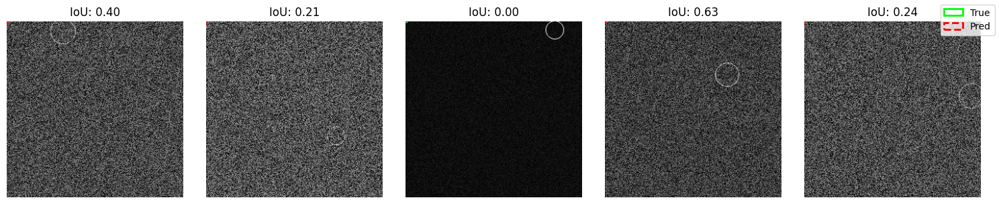

In [ ]:
show_predictions(model, val_dataset, device, num_samples=5)

In [ ]:
# --------- Normalization Constants ---------
IMG_SIZE = 256
RADIUS_MIN, RADIUS_MAX = 3, 20

# --------- On-the-Fly Dataset Definition ---------
class CircleOnTheFlyDataset(Dataset):
    def __init__(self, n_samples=10000, noise_level=2):
        self.n_samples = n_samples
        self.noise_level = noise_level

    def __len__(self):
        return self.n_samples

    def __getitem__(self, idx):
        img, label = generate_circle(noise_level=self.noise_level)
        img = np.expand_dims(img, axis=0)  # shape: (1, 256, 256)
        row = label['row'] / IMG_SIZE
        col = label['col'] / IMG_SIZE
        radius = (label['radius'] - RADIUS_MIN) / (RADIUS_MAX - RADIUS_MIN)
        target = torch.tensor([row, col, radius], dtype=torch.float32)
        return torch.tensor(img, dtype=torch.float32), target

# --------- CNN Model Definition ---------
class CircleFinderCNN(nn.Module):
    def __init__(self):
        super(CircleFinderCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 16, kernel_size=5, stride=1, padding=2)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5, stride=1, padding=2)
        self.bn1 = nn.BatchNorm2d(16)
        self.bn2 = nn.BatchNorm2d(32)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.bn3 = nn.BatchNorm2d(64)
        self.global_avg_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc1 = nn.Linear(64, 128)
        self.fc2 = nn.Linear(128, 3)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.pool(F.relu(self.bn3(self.conv3(x))))
        x = self.global_avg_pool(x)
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = self.sigmoid(self.fc2(x))
        return x

# --------- Load Train and Validation Dataset ---------
def load_dataloaders(batch_size=64, noise_level=2):
    train_dataset = CircleOnTheFlyDataset(n_samples=10000, noise_level=noise_level)
    val_dataset = CircleOnTheFlyDataset(n_samples=2000, noise_level=noise_level)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    return train_loader, val_loader

# --------- Evaluation ---------
def intersection_over_union(circ1_dict, circ2_dict):
    shape1 = Point(circ1_dict['row'], circ1_dict['col']).buffer(circ1_dict['radius'])
    shape2 = Point(circ2_dict['row'], circ2_dict['col']).buffer(circ2_dict['radius'])
    return shape1.intersection(shape2).area / shape1.union(shape2).area

def evaluate_model(model, dataloader, device, iou_threshold=0.7):
    model.eval()
    matches = 0
    total = 0
    with torch.no_grad():
        for imgs, targets in dataloader:
            imgs = imgs.to(device)
            outputs = model(imgs).cpu().numpy()
            targets = targets.numpy()
            for pred, true in zip(outputs, targets):
                pred_dict = {
                    'row': pred[0] * IMG_SIZE,
                    'col': pred[1] * IMG_SIZE,
                    'radius': pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
                }
                true_dict = {
                    'row': true[0] * IMG_SIZE,
                    'col': true[1] * IMG_SIZE,
                    'radius': true[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN
                }
                iou = intersection_over_union(pred_dict, true_dict)
                if iou > iou_threshold:
                    matches += 1
                total += 1
    accuracy = matches / total
    print(f"IoU > {iou_threshold} Accuracy: {accuracy:.2%}")
    return accuracy

# --------- Visualization ---------
def show_predictions(model, dataset, device, num_samples=5):
    model.eval()
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 3))
    for i, idx in enumerate(indices):
        img, true = dataset[idx]
        with torch.no_grad():
            pred = model(img.unsqueeze(0).to(device)).cpu().numpy()[0]
        axs[i].imshow(img.squeeze(), cmap='gray')
        axs[i].add_patch(plt.Circle(
            (true[1] * IMG_SIZE, true[0] * IMG_SIZE),  # (col, row)
            true[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN,
            color='lime', fill=False, linewidth=2, label='True'))
        axs[i].add_patch(plt.Circle(
            (pred[1] * IMG_SIZE, pred[0] * IMG_SIZE),
            pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN,
            color='red', fill=False, linewidth=2, linestyle='--', label='Pred'))
        iou = intersection_over_union(
            {'row': true[0] * IMG_SIZE, 'col': true[1] * IMG_SIZE, 'radius': true[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN},
            {'row': pred[0] * IMG_SIZE, 'col': pred[1] * IMG_SIZE, 'radius': pred[2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN})
        axs[i].set_title(f"IoU: {iou:.2f}")
        axs[i].axis('off')
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right')
    plt.tight_layout()
    plt.show()

# --------- Training Loop ---------
def train_model(model, train_loader, val_loader, device, epochs=100, lr=1e-4, patience=15):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    def custom_loss(pred, target):
        pred_area = ((pred[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN) ** 2)
        true_area = ((target[:, 2] * (RADIUS_MAX - RADIUS_MIN) + RADIUS_MIN) ** 2)
        area_loss = F.mse_loss(pred_area / 1000, true_area / 1000)  # scale area
        pos_loss = F.mse_loss(pred[:, 0:2], target[:, 0:2])
        return pos_loss + area_loss  # also called Huber loss

    model.to(device)
    best_val_loss = float('inf')
    patience_counter = 0
    train_losses, val_losses = [], []

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for imgs, targets in train_loader:
            imgs, targets = imgs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(imgs)
            loss = custom_loss(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        val_loss = 0
        model.eval()
        with torch.no_grad():
            for imgs, targets in val_loader:
                imgs, targets = imgs.to(device), targets.to(device)
                outputs = model(imgs)
                loss = custom_loss(outputs, targets)
                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)

        print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
        evaluate_model(model, val_loader, device)

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    # Plot loss
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Custom Weighted Loss')
    plt.title('Loss Curve')
    plt.legend()
    plt.grid(True)
    plt.show()
